In [1]:
import pandas as pd
import numpy as np
from math import sqrt
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
from pmdarima import auto_arima

ModuleNotFoundError: No module named 'statsmodels'

In [ ]:
data=pd.read_csv("F:/arjun/Data/datapull_new.csv")

In [3]:

data['DateID']=pd.to_datetime(data['DateID'])
data=data[data['Status']=="Current"]
data.drop(['Status'],axis=1,inplace=True)

# Adding Pricezone to data
pricezone=pd.read_excel("F:/arjun/Data/ZipCode-PriceZones.xlsx")
data=data.merge(pricezone,how="left",on="ZipCode")
data['PriceZoneAssigned'].fillna("NoSales",inplace=True)


# Merging Calender
calender=pd.read_excel("F:/arjun/Data/Blank Calendar 2015-2022.xlsx", sheet_name = 'Raw Data')
data=data.merge(calender[['DateID','PromoWeek','PromoYear']],on="DateID",how="left")

In [4]:
data.dropna(subset=['PromoWeek'], inplace=True)

In [5]:
# Splitting into price zones
dfz16 = data.copy()
dfz16.loc[dfz16.loc[dfz16['PriceZoneAssigned'].isin(['AFHSPGZ1','AFHSPGZ6'])  == False].index, 'Quantity'] = 0
dfz16.loc[dfz16.loc[dfz16['PriceZoneAssigned'].isin(['AFHSPGZ1','AFHSPGZ6'])  == False].index, 'COGS'] = 0
dfz16.loc[dfz16.loc[dfz16['PriceZoneAssigned'].isin(['AFHSPGZ1','AFHSPGZ6'])  == False].index, 'Sales'] = 0
dfz16.loc[dfz16.loc[dfz16['PriceZoneAssigned'].isin(['AFHSPGZ1','AFHSPGZ6'])  == False].index, 'Discounts'] = 0

In [6]:
# df5 = dfz16[dfz16['PriceZoneAssigned'].isin(['AFHSPGZ1','AFHSPGZ6'])]

In [7]:
dfz16 = dfz16.groupby(['ItemID', 'ProductLine','SeriesName','SeriesNumber','PromoYear','PromoWeek']).agg({'Quantity':'sum', 'Sales': 'sum', 'Discounts':'sum', 'COGS':'sum'}).reset_index()

dfz16['PriceZone'] = 'Z16'
dfz16['PromoYear'] = dfz16['PromoYear'] - 2015

In [8]:
# Creating features

dfz16['Price']=(dfz16['Sales']+dfz16['Discounts'])/dfz16['Quantity']
dfz16['AverageWeeklyPricePreCoupon'] = dfz16['Sales'] / dfz16['Quantity']
dfz16['AverageWeeklyPrice'] = (dfz16['Sales'] + dfz16['Discounts']) / dfz16['Quantity']
dfz16['AverageWeeklyCOGS'] = dfz16['COGS'] / dfz16['Quantity']
dfz16['AverageWeeklyPricePreCoupon'] = dfz16['AverageWeeklyPricePreCoupon'].replace(0, np.nan)
dfz16['AverageWeeklyPricePreCoupon'] = dfz16.groupby('ItemID')['AverageWeeklyPricePreCoupon'].ffill()
dfz16['AverageWeeklyCOGS'] = dfz16['AverageWeeklyCOGS'].replace(0, np.nan)
dfz16['AverageWeeklyCOGS'] = dfz16.groupby('ItemID')['AverageWeeklyCOGS'].ffill()
dfz16['AverageWeeklyPrice'] = dfz16['AverageWeeklyPrice'].replace(0, np.nan)
dfz16[['AverageWeeklyPricePreCoupon','AverageWeeklyPrice']] = dfz16[['AverageWeeklyPricePreCoupon','AverageWeeklyPrice']].ffill(axis = 1)
dfz16.dropna(subset=['AverageWeeklyPrice', 'AverageWeeklyCOGS'], inplace=True)


dfz16['Prev_week'] =  dfz16.groupby('ItemID')['Sales'].shift()
dfz16['Prev_week2'] =  dfz16.groupby('ItemID')['Sales'].shift(2)
dfz16['Prev_week3'] =  dfz16.groupby('ItemID')['Sales'].shift(3)

dfz16.dropna(subset=['Prev_week','Prev_week2','Prev_week3'],inplace=True)

In [9]:
# Adding Tentpole
tentpole_calender=pd.read_excel("F:/arjun/Data/Blank Calendar 2015-2022.xlsx", sheet_name = 'Blank Calendar with Holiday')
tentpole_calender['PromoYear'] = tentpole_calender['PromoYear'] - 2015

dfz16 = pd.merge(dfz16, tentpole_calender, how="left", on=("PromoWeek", "PromoYear"))

In [10]:
dfz16["Holiday"] = np.where((dfz16['TentpoleCalendar'].isnull()), 0, 1)

In [11]:
df_tp = pd.get_dummies(data=dfz16[['Tentpole']])
df_tp.fillna(0, inplace=True)

In [12]:
dfz16 = pd.concat([dfz16,df_tp], axis=1)

In [13]:

dfz16.columns

Index(['ItemID', 'ProductLine', 'SeriesName', 'SeriesNumber', 'PromoYear',
       'PromoWeek', 'Quantity', 'Sales', 'Discounts', 'COGS', 'PriceZone',
       'Price', 'AverageWeeklyPricePreCoupon', 'AverageWeeklyPrice',
       'AverageWeeklyCOGS', 'Prev_week', 'Prev_week2', 'Prev_week3',
       'FiscalQuarter', 'PromotionPeriod', 'Tentpole', 'TentpoleCalendar',
       'TentpolePeriod', 'SpecialEvent', 'Holiday', 'Tentpole_AnniversarySale',
       'Tentpole_BlackFriday', 'Tentpole_CyberMonday',
       'Tentpole_IndependenceDay', 'Tentpole_LaborDay', 'Tentpole_MemorialDay',
       'Tentpole_NewYear', 'Tentpole_PostIndependenceDay',
       'Tentpole_PostLaborDay', 'Tentpole_PostMemorialDay',
       'Tentpole_PostPresidentsDay', 'Tentpole_PreBlackFriday',
       'Tentpole_PreIndependenceDay', 'Tentpole_PreLaborDay',
       'Tentpole_PreMemorialDay', 'Tentpole_PrePresidentsDay',
       'Tentpole_PresidentsDay'],
      dtype='object')

In [14]:

dfz16=dfz16.drop(['Tentpole','TentpoleCalendar','TentpolePeriod'],axis=1)

In [15]:
#Creating FiscalQuarter Q2 2022

dfz16["Q2_2022"] = np.where(((dfz16['PromoYear'] == 7)&(dfz16["PromoWeek"] >12)) & ((dfz16['PromoYear'] == 7)&(dfz16["PromoWeek"]<25)) , 1, 0)

In [16]:
dfz16['LogPrice'] = np.log(dfz16['AverageWeeklyPrice'])
dfz16['Intercept'] = 1

In [17]:
dfz16['Holiday_Prev_week'] = dfz16['Prev_week'] * dfz16['Holiday']
dfz16['Holiday_Prev_week2'] = dfz16['Prev_week2'] * dfz16['Holiday']

In [18]:
dfz16.columns

Index(['ItemID', 'ProductLine', 'SeriesName', 'SeriesNumber', 'PromoYear',
       'PromoWeek', 'Quantity', 'Sales', 'Discounts', 'COGS', 'PriceZone',
       'Price', 'AverageWeeklyPricePreCoupon', 'AverageWeeklyPrice',
       'AverageWeeklyCOGS', 'Prev_week', 'Prev_week2', 'Prev_week3',
       'FiscalQuarter', 'PromotionPeriod', 'SpecialEvent', 'Holiday',
       'Tentpole_AnniversarySale', 'Tentpole_BlackFriday',
       'Tentpole_CyberMonday', 'Tentpole_IndependenceDay', 'Tentpole_LaborDay',
       'Tentpole_MemorialDay', 'Tentpole_NewYear',
       'Tentpole_PostIndependenceDay', 'Tentpole_PostLaborDay',
       'Tentpole_PostMemorialDay', 'Tentpole_PostPresidentsDay',
       'Tentpole_PreBlackFriday', 'Tentpole_PreIndependenceDay',
       'Tentpole_PreLaborDay', 'Tentpole_PreMemorialDay',
       'Tentpole_PrePresidentsDay', 'Tentpole_PresidentsDay', 'Q2_2022',
       'LogPrice', 'Intercept', 'Holiday_Prev_week', 'Holiday_Prev_week2'],
      dtype='object')

In [19]:
dfz16forecast2022 = dfz16[(dfz16['PromoYear'] == 7) & (dfz16['PromoWeek'] > 19)].reset_index(drop = True)

In [20]:
dfz16 = dfz16.drop(dfz16[(dfz16['PromoYear'] == 7)&(dfz16['PromoWeek'] > 19)].index)

In [21]:
# Adding Master Pricing 
AFI_prices=pd.read_excel("F:/arjun/Data/AFI Prices week 18.xlsx")
AFI_prices.rename(columns={"East New Price (Zone 1/6)(8%)": "New_Price"},inplace='true')

#AFI_prices.head(3)
dfz16forecast2022=dfz16forecast2022.merge(AFI_prices[['Sku','New_Price']],left_on="ItemID",right_on="Sku",how='left')

#- can remove if don't want price to replace newprice
dfz16forecast2022['New_Price'].fillna(dfz16forecast2022['Price'],inplace=True) 

In [104]:
AFI_prices.head()

,Sku,ProductLine,ItemSeriesName,ItemSeriesNumber,ItemConsumerDescription,SellingStatus,Last6MonthsSales,New_Price
0,1000608,Stationary,Elyza,10006,Oversized Accent Ottoman,NotOnSalesYet,NoSalesLast6months,469.99
1,1000616,Stationary,Elyza,10006,Left-Arm Facing Corner Chaise,NotOnSalesYet,NoSalesLast6months,719.99
2,1000617,Stationary,Elyza,10006,Right-Arm Facing Corner Chaise,NotOnSalesYet,NoSalesLast6months,719.99
3,1000646,Stationary,Elyza,10006,Armless Chair,NotOnSalesYet,NoSalesLast6months,500.00
4,1000664,Stationary,Elyza,10006,Left-Arm Facing Corner Chair,NotOnSalesYet,NoSalesLast6months,549.99


In [22]:
dfz16forecast2022 = dfz16forecast2022.dropna(subset=['New_Price'])

dfz16forecast2022.drop(['Price'],axis=1,inplace=True)  #Removing price from test dataset
dfz16forecast2022.rename(columns = {'New_Price':'Price'}, inplace = True)
dfz16forecast2022.shape

(122775, 45)

In [23]:
dfz16forecast2022.isna().sum()

ItemID                               0
ProductLine                          0
SeriesName                           0
SeriesNumber                         0
PromoYear                            0
PromoWeek                            0
Quantity                             0
Sales                                0
Discounts                            0
COGS                                 0
PriceZone                            0
AverageWeeklyPricePreCoupon          0
AverageWeeklyPrice                   0
AverageWeeklyCOGS                    0
Prev_week                            0
Prev_week2                           0
Prev_week3                           0
FiscalQuarter                        0
PromotionPeriod                  75826
SpecialEvent                    122775
Holiday                              0
Tentpole_AnniversarySale             0
Tentpole_BlackFriday                 0
Tentpole_CyberMonday                 0
Tentpole_IndependenceDay             0
Tentpole_LaborDay        

In [24]:
## import package for model building





In [25]:
prod_line_list = list(dfz16['ProductLine'].unique())

new_df = pd.DataFrame()
rmse_dict = dict()
for prod in prod_line_list:
    temp=dfz16[dfz16.ProductLine==prod]
    
#     display(temp.head(2))
    remove_cols = ['ItemID','SeriesName','ProductLine','SeriesNumber','Price','PromoYear','PromoWeek','Quantity',
                 'PromotionPeriod','SpecialEvent','Sales','FiscalQuarter','Discounts','COGS','PriceZone','SpecialEvent']
    X=temp.drop(remove_cols,axis=1)
    y=temp['Quantity']
    model = sm.OLS(y, X)
    results = model.fit()
    prediction = results.predict(X)
    X['Prediction'] = prediction
    X["Actual"] = y
    
#     prediction

    

#     tempforecast2022 = dfz16forecast2022[dfz16forecast2022['ProductLine'] == item].reset_index(drop = True)
#     test_x = tempforecast2022[list(X.columns)]
#     tempforecast2022['Predicted'] = results.predict(test_x)
    
#     remove_cols_2 = ['ItemID','SeriesName','SeriesNumber','Price','PromoYear','PromoWeek','PromotionPeriod',
#                      'SpecialEvent','Sales','FiscalQuarter','Discounts','COGS','PriceZone','SpecialEvent','Sku',]
#     tempforecast2022.drop(remove_cols_2,axis=1, inplace=True)

    new_df = pd.concat([new_df,X], axis=0)
#     rmse = sqrt(mean_squared_error(tempforecast2022['Quantity'], round(tempforecast2022['Predicted'])))
#     rmse_dict[prod] = round(rmse,2)

In [26]:
new_df.tail()

,AverageWeeklyPricePreCoupon,AverageWeeklyPrice,AverageWeeklyCOGS,Prev_week,Prev_week2,Prev_week3,Holiday,Tentpole_AnniversarySale,Tentpole_BlackFriday,Tentpole_CyberMonday,...,Tentpole_PreMemorialDay,Tentpole_PrePresidentsDay,Tentpole_PresidentsDay,Q2_2022,LogPrice,Intercept,Holiday_Prev_week,Holiday_Prev_week2,Prediction,Actual
215456,359.99,323.99,167.43,719.98,359.99,359.99,0,0,0,0,...,0,0,0,1,5.780713,1,0.0,0.0,1.914608,2.0
215457,359.99,359.99,167.43,719.98,719.98,359.99,0,0,0,0,...,0,0,0,1,5.886076,1,0.0,0.0,1.323408,0.0
215458,349.99,349.99,167.43,0.00,719.98,719.98,0,0,0,0,...,0,0,0,1,5.857905,1,0.0,0.0,0.817182,1.0
215459,233.99,233.99,163.35,349.99,0.00,719.98,0,0,0,0,...,0,0,0,1,5.455278,1,0.0,0.0,1.442344,1.0
215460,233.99,233.99,163.35,233.99,349.99,0.00,0,0,0,0,...,0,0,0,1,5.455278,1,0.0,0.0,1.281301,0.0


In [27]:
new_df.Prediction.sum()

174135.00000000015

In [28]:
new_df.Actual.sum()

174135.0

<AxesSubplot:xlabel='Actual', ylabel='Prediction'>

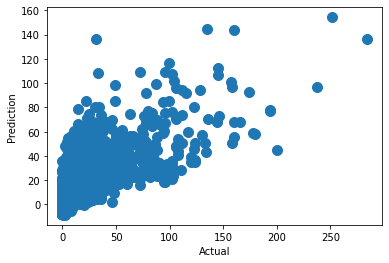

In [29]:
# new_df[["Prediction","Actual"]].plot()
new_df.plot.scatter(x = 'Actual', y = 'Prediction', s = 100)

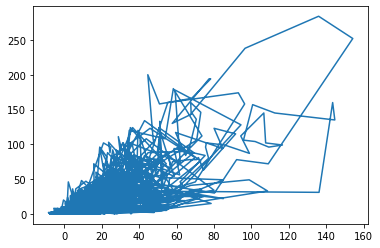

In [30]:
import matplotlib.pyplot as plt
plt.plot(new_df["Prediction"],new_df["Actual"])

In [91]:
## ARIMA
dfz16.head(3)

,level_0,index,ItemID,ProductLine,SeriesName,SeriesNumber,PromoYear,PromoWeek,Quantity,Sales,...,Tentpole_PreIndependenceDay,Tentpole_PreLaborDay,Tentpole_PreMemorialDay,Tentpole_PrePresidentsDay,Tentpole_PresidentsDay,Q2_2022,LogPrice,Intercept,Holiday_Prev_week,Holiday_Prev_week2
0,0,0,1010425,Motion,McCade,10104,7,4,3.0,1298.97,...,0,0,0,0,0,0,6.070715,1,0.0,0.0
1,1,1,1010425,Motion,McCade,10104,7,5,2.0,865.98,...,0,0,0,0,0,0,6.070715,1,0.0,0.0
2,2,2,1010425,Motion,McCade,10104,7,6,2.0,865.98,...,0,0,0,0,0,0,6.070715,1,0.0,0.0


In [93]:
#dfz16.reset_index(inplace = True)
merged =dfz16.copy()
test = dfz16forecast2022.copy()


merged.head()

,level_0,index,ItemID,ProductLine,SeriesName,SeriesNumber,PromoYear,PromoWeek,Quantity,Sales,...,Tentpole_PreIndependenceDay,Tentpole_PreLaborDay,Tentpole_PreMemorialDay,Tentpole_PrePresidentsDay,Tentpole_PresidentsDay,Q2_2022,LogPrice,Intercept,Holiday_Prev_week,Holiday_Prev_week2
0,0,0,1010425,Motion,McCade,10104,7,4,3.0,1298.97,...,0,0,0,0,0,0,6.070715,1,0.00,0.00
1,1,1,1010425,Motion,McCade,10104,7,5,2.0,865.98,...,0,0,0,0,0,0,6.070715,1,0.00,0.00
2,2,2,1010425,Motion,McCade,10104,7,6,2.0,865.98,...,0,0,0,0,0,0,6.070715,1,0.00,0.00
3,3,3,1010425,Motion,McCade,10104,7,7,0.0,0.00,...,0,0,0,1,0,0,6.070715,1,865.98,865.98
4,4,4,1010425,Motion,McCade,10104,7,8,1.0,432.99,...,0,0,0,0,1,0,6.070715,1,0.00,865.98


In [94]:
(merged['Quantity']) = (merged['Quantity']).astype('float')
(test['Quantity']) = (test['Quantity']).astype('float')

(merged['Quantity']).describe()

count    66817.000000
mean         2.606148
std          7.141853
min          0.000000
25%          0.000000
50%          1.000000
75%          3.000000
max        284.000000
Name: Quantity, dtype: float64

In [95]:
#merged.reset_index()
#merged['Date']=(pd.to_datetime((merged['PromoYear']).astype(str)+'-'+merged['PromoWeek'].astype(str)))
dates = (merged.PromoYear+2015)*100+merged.PromoWeek
merged['Date'] = pd.to_datetime(dates.astype(str) + '0', format='%Y%W%w')

dates1 = (test.PromoYear+2015)*100+test.PromoWeek
test['Date'] = pd.to_datetime(dates1.astype(str) + '0', format='%Y%W%w')

merged['Sales'] = merged['Sales']* 1.0
test['Quantity'] = merged['Quantity']* 1.0


#merged = merged.set_index(['Date'])

In [96]:
merged.head()

,level_0,index,ItemID,ProductLine,SeriesName,SeriesNumber,PromoYear,PromoWeek,Quantity,Sales,...,Tentpole_PreLaborDay,Tentpole_PreMemorialDay,Tentpole_PrePresidentsDay,Tentpole_PresidentsDay,Q2_2022,LogPrice,Intercept,Holiday_Prev_week,Holiday_Prev_week2,Date
0,0,0,1010425,Motion,McCade,10104,7,4,3.0,1298.97,...,0,0,0,0,0,6.070715,1,0.00,0.00,2022-01-30
1,1,1,1010425,Motion,McCade,10104,7,5,2.0,865.98,...,0,0,0,0,0,6.070715,1,0.00,0.00,2022-02-06
2,2,2,1010425,Motion,McCade,10104,7,6,2.0,865.98,...,0,0,0,0,0,6.070715,1,0.00,0.00,2022-02-13
3,3,3,1010425,Motion,McCade,10104,7,7,0.0,0.00,...,0,0,1,0,0,6.070715,1,865.98,865.98,2022-02-20
4,4,4,1010425,Motion,McCade,10104,7,8,1.0,432.99,...,0,0,0,1,0,6.070715,1,0.00,865.98,2022-02-27


In [97]:
merged.columns



Index(['level_0', 'index', 'ItemID', 'ProductLine', 'SeriesName',
       'SeriesNumber', 'PromoYear', 'PromoWeek', 'Quantity', 'Sales',
       'Discounts', 'COGS', 'PriceZone', 'Price',
       'AverageWeeklyPricePreCoupon', 'AverageWeeklyPrice',
       'AverageWeeklyCOGS', 'Prev_week', 'Prev_week2', 'Prev_week3',
       'FiscalQuarter', 'PromotionPeriod', 'SpecialEvent', 'Holiday',
       'Tentpole_AnniversarySale', 'Tentpole_BlackFriday',
       'Tentpole_CyberMonday', 'Tentpole_IndependenceDay', 'Tentpole_LaborDay',
       'Tentpole_MemorialDay', 'Tentpole_NewYear',
       'Tentpole_PostIndependenceDay', 'Tentpole_PostLaborDay',
       'Tentpole_PostMemorialDay', 'Tentpole_PostPresidentsDay',
       'Tentpole_PreBlackFriday', 'Tentpole_PreIndependenceDay',
       'Tentpole_PreLaborDay', 'Tentpole_PreMemorialDay',
       'Tentpole_PrePresidentsDay', 'Tentpole_PresidentsDay', 'Q2_2022',
       'LogPrice', 'Intercept', 'Holiday_Prev_week', 'Holiday_Prev_week2',
       'Date'],
      dty

<AxesSubplot:>

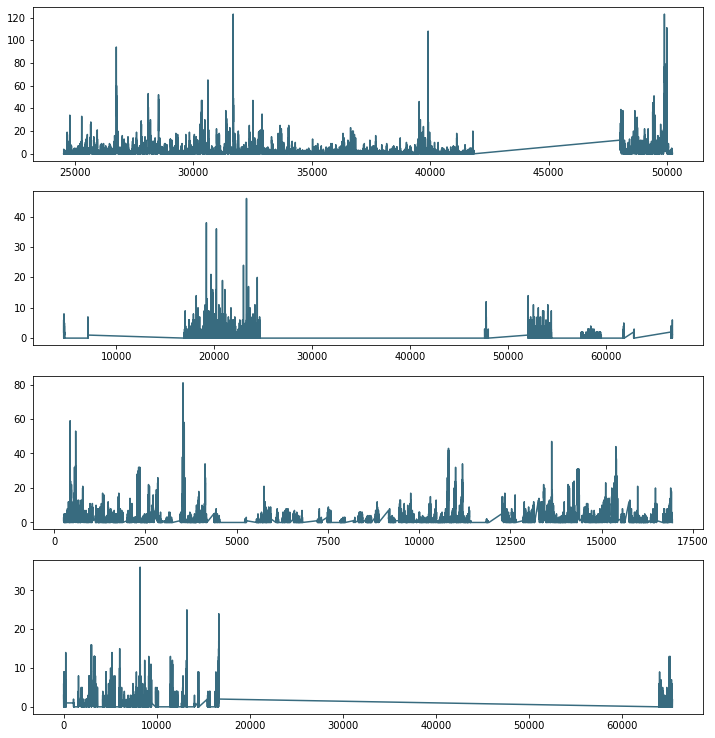

In [98]:
# preparation: input should be float type

# store types
sales_a = merged[merged.ProductLine == 'Bedroom']['Quantity'].sort_index(ascending = True)
sales_b = merged[merged.ProductLine == 'Accessories']['Quantity'].sort_index(ascending = True) 
sales_c = merged[merged.ProductLine == 'Stationary']['Quantity'].sort_index(ascending = True)
sales_d = merged[merged.ProductLine == 'Motion']['Quantity'].sort_index(ascending = True)

f, (ax1, ax2, ax3, ax4) = plt.subplots(4, figsize = (12, 13))
c = '#386B7F'

# store types
sales_a.plot(color = c, ax = ax1)
sales_b.plot(color = c, ax = ax2)
sales_c.plot(color = c, ax = ax3)
sales_d.plot(color = c, ax = ax4)

#All Stores have same trend..

In [99]:
#merged.reset_index(inplace=True)
data_ts=merged[['Date','Quantity','ItemID']].copy()
test1=test[['Date','Quantity','ItemID','PromoWeek']].copy()
test1.set_index(keys=['ItemID','PromoWeek'],inplace=True)
data_ts.head()
#data_ts.reset_index(level = ['ItemID'],inplace=True)

,Date,Quantity,ItemID
0,2022-01-30,3.0,1010425
1,2022-02-06,2.0,1010425
2,2022-02-13,2.0,1010425
3,2022-02-20,0.0,1010425
4,2022-02-27,1.0,1010425


In [100]:
merged.head()

,level_0,index,ItemID,ProductLine,SeriesName,SeriesNumber,PromoYear,PromoWeek,Quantity,Sales,...,Tentpole_PreLaborDay,Tentpole_PreMemorialDay,Tentpole_PrePresidentsDay,Tentpole_PresidentsDay,Q2_2022,LogPrice,Intercept,Holiday_Prev_week,Holiday_Prev_week2,Date
0,0,0,1010425,Motion,McCade,10104,7,4,3.0,1298.97,...,0,0,0,0,0,6.070715,1,0.00,0.00,2022-01-30
1,1,1,1010425,Motion,McCade,10104,7,5,2.0,865.98,...,0,0,0,0,0,6.070715,1,0.00,0.00,2022-02-06
2,2,2,1010425,Motion,McCade,10104,7,6,2.0,865.98,...,0,0,0,0,0,6.070715,1,0.00,0.00,2022-02-13
3,3,3,1010425,Motion,McCade,10104,7,7,0.0,0.00,...,0,0,1,0,0,6.070715,1,865.98,865.98,2022-02-20
4,4,4,1010425,Motion,McCade,10104,7,8,1.0,432.99,...,0,0,0,1,0,6.070715,1,0.00,865.98,2022-02-27


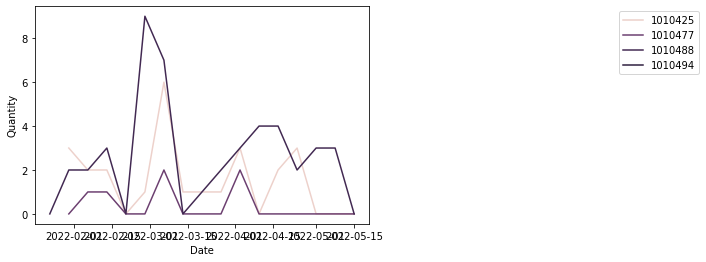

In [101]:
import seaborn as sns
sns.lineplot(x='Date',y='Quantity',data=data_ts.head(50),hue='ItemID')
plt.legend(loc='best',bbox_to_anchor=(2,1))
plt.show()

In [106]:
train=data_ts.copy()
#test=data_ts[data_ts['Date'].dt.year>=2019]
#test_1['Month']=test_1['Date'].dt.month
#test_1.set_index(keys=['ProfitCenter','Month'],inplace=True)
test1.head(3)

Date  Quantity
ItemID  PromoWeek                     
8070234 20        2022-05-22       0.0
        21        2022-05-29       1.0
        22        2022-06-05       0.0

In [107]:
train.head()

,Date,Quantity,ItemID
0,2022-01-30,3.0,1010425
1,2022-02-06,2.0,1010425
2,2022-02-13,2.0,1010425
3,2022-02-20,0.0,1010425
4,2022-02-27,1.0,1010425


In [81]:
test.head()

,ItemID,ProductLine,SeriesName,SeriesNumber,PromoYear,PromoWeek,Quantity,Sales,Discounts,COGS,...,Tentpole_PrePresidentsDay,Tentpole_PresidentsDay,Q2_2022,LogPrice,Intercept,Holiday_Prev_week,Holiday_Prev_week2,Sku,Price,Date
36041,8070234,Stationary,Ballinasloe,80702,7,20,0.0,0.0,0.0,0.0,...,0,0,1,5.981414,1,0.0,0.0,8070234,390.0,2022-05-22
36042,8070234,Stationary,Ballinasloe,80702,7,21,1.0,0.0,0.0,0.0,...,0,0,1,5.981414,1,0.0,0.0,8070234,390.0,2022-05-29
36043,8070234,Stationary,Ballinasloe,80702,7,22,0.0,0.0,0.0,0.0,...,0,0,1,5.981414,1,0.0,0.0,8070234,390.0,2022-06-05
36044,8070234,Stationary,Ballinasloe,80702,7,23,1.0,0.0,0.0,0.0,...,0,0,1,5.981414,1,0.0,0.0,8070234,390.0,2022-06-12
36045,8070234,Stationary,Ballinasloe,80702,7,24,1.0,0.0,0.0,0.0,...,0,0,1,5.981414,1,0.0,0.0,8070234,390.0,2022-06-19


In [127]:
final_result=pd.DataFrame()
group_train=train.groupby('ItemID')
for i in group_train.groups.keys():
    #plt.title("Sales of ProfitCenter "+str(i))
    print("ItemID",i)
    time=group_train.get_group(i).set_index(keys='Date')
    time.drop('ItemID',axis=1,inplace=True)
    #display(time)
    #sm.tsa.seasonal_decompose(time['Written Sales']).plot()
    stepwise_model = auto_arima(time, start_p=1, start_q=1,
                           max_p=3, max_q=3, m=12,
                           start_P=0, seasonal=True,
                           d=1,D=0,  trace=True,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True)
    print("AIC",stepwise_model.aic())
    stepwise_model.fit(time)
    result=pd.DataFrame()
    result['Time']=range(1,13)
    result["value"]=stepwise_model.predict(n_periods=12)
    result["ItemID"]=i
    result.set_index(keys=['ItemID','Time'],inplace=True)
    display(result)
    final_result=final_result.append(result)

ItemID 1010425
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=2.07 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=72.121, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=72.497, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.230, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=73.080, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=75.080, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=71.218, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.031 seconds
AIC 70.23001209835998


value
ItemID  Time       
1010425 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1010477
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=49.303, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=49.801, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=47.303, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=51.303, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=51.303, Time=0.06 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=53.303, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=48.001, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.131 seconds
AIC 47.30297934861021


value
ItemID  Time              
1010477 1     2.397018e-94
        2     2.397018e-94
        3     2.397018e-94
        4     2.397018e-94
        5     2.397018e-94
        6     2.397018e-94
        7     2.397018e-94
        8     2.397018e-94
        9     2.397018e-94
        10    2.397018e-94
        11    2.397018e-94
        12    2.397018e-94

ItemID 1010488
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=86.836, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=87.952, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.836, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.185, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=89.185, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.861, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.023 seconds
AIC 84.83641812072142


value
ItemID  Time              
1010488 1    -4.440892e-16
        2    -4.440892e-16
        3    -4.440892e-16
        4    -4.440892e-16
        5    -4.440892e-16
        6    -4.440892e-16
        7    -4.440892e-16
        8    -4.440892e-16
        9    -4.440892e-16
        10   -4.440892e-16
        11   -4.440892e-16
        12   -4.440892e-16

ItemID 1010494
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.610, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=88.366, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=83.636, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=86.800, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=88.800, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.107, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.772 seconds
AIC 83.63585514566674


value
ItemID  Time       
1010494 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1030125
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=83.139, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=85.332, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=81.169, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=84.561, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=84.561, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=86.561, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=83.824, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.454 seconds
AIC 81.16944426864669


value
ItemID  Time       
1030125 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 1030225
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=49.359, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=50.494, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=47.407, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=50.908, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=50.908, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=52.908, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=48.848, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.546 seconds
AIC 47.40679044375848


value
ItemID  Time       
1030225 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1040225
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=40.486, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=41.681, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=38.486, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=42.486, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=42.486, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=44.486, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=39.731, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.526 seconds
AIC 38.48617937533459


value
ItemID  Time              
1040225 1    -1.110223e-16
        2    -1.110223e-16
        3    -1.110223e-16
        4    -1.110223e-16
        5    -1.110223e-16
        6    -1.110223e-16
        7    -1.110223e-16
        8    -1.110223e-16
        9    -1.110223e-16
        10   -1.110223e-16
        11   -1.110223e-16
        12   -1.110223e-16

ItemID 1040325
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=47.270, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=49.987, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=45.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=49.270, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=49.270, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=51.270, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=47.987, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.684 seconds
AIC 45.26953078135001


value
ItemID  Time       
1040325 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1060417
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=16.455, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=25.892, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=23.892, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=14.492, Time=0.16 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=16.455, Time=0.56 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=18.455, Time=0.58 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=12.947, Time=0.10 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=16.676, Time=0.73 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=14.656, Time=0.33 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=11.8

value
ItemID  Time          
1060417 1     0.894766
        2     0.094159
        3     0.810516
        4     0.169544
        5     0.743064
        6     0.229898
        7     0.689062
        8     0.278217
        9     0.645827
        10    0.316902
        11    0.611213
        12    0.347874

ItemID 1060440
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=16.455, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=25.892, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=23.892, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=14.492, Time=0.20 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=16.455, Time=0.67 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=18.455, Time=0.59 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=12.947, Time=0.10 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=16.676, Time=0.65 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=14.656, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=11.8

value
ItemID  Time          
1060440 1     0.894766
        2     0.094159
        3     0.810516
        4     0.169544
        5     0.743064
        6     0.229898
        7     0.689062
        8     0.278217
        9     0.645827
        10    0.316902
        11    0.611213
        12    0.347874

ItemID 1060446
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=28.932, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=38.368, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=36.368, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=26.969, Time=0.12 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=28.932, Time=0.29 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=30.932, Time=0.44 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=25.423, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=29.152, Time=0.82 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=27.132, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=24.3

value
ItemID  Time          
1060446 1     1.789528
        2     0.188322
        3     1.621024
        4     0.339094
        5     1.486119
        6     0.459802
        7     1.378114
        8     0.556441
        9     1.291645
        10    0.633811
        11    1.222417
        12    0.695753

ItemID 1060457
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=22.243, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=20.243, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=24.243, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=24.243, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=26.243, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=17.522, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=19.389, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=19.422, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Ti

value
ItemID  Time              
1060457 1    -1.850595e-20
        2    -5.804693e-21
        3    -1.452199e-20
        4    -8.539016e-21
        5    -1.264533e-20
        6    -9.827029e-21
        7    -1.176132e-20
        8    -1.043375e-20
        9    -1.134491e-20
        10   -1.071955e-20
        11   -1.114876e-20
        12   -1.085418e-20

ItemID 1060477
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=16.455, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=25.892, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=23.892, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=14.492, Time=0.19 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=16.455, Time=0.42 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=18.455, Time=0.61 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=12.947, Time=0.10 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=16.676, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=14.656, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=11.8

value
ItemID  Time          
1060477 1     0.894766
        2     0.094159
        3     0.810516
        4     0.169544
        5     0.743064
        6     0.229898
        7     0.689062
        8     0.278217
        9     0.645827
        10    0.316902
        11    0.611213
        12    0.347874

ItemID 1080129
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=70.012, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=63.753, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=68.012, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=61.757, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=63.753, Time=0.20 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=60.583, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=62.486, Time=0.14 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=62.487, Time=0.13 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=62.191, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf,

value
ItemID  Time          
1080129 1     1.119838
        2     0.873104
        3     0.634020
        4     0.977792
        5     0.740076
        6     0.827355
        7     0.843484
        8     0.789774
        9     0.836084
        10    0.813351
        11    0.815893
        12    0.823194

ItemID 1080229
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=59.249, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=55.010, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=57.700, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=53.306, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=55.000, Time=0.25 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=55.223, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=54.929, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=52.437, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=53.673, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=inf,

value
ItemID  Time              
1080229 1     1.860086e-16
        2     1.353616e-16
        3     1.695694e-16
        4     1.464649e-16
        5     1.620700e-16
        6     1.515300e-16
        7     1.586489e-16
        8     1.538407e-16
        9     1.570883e-16
        10    1.548948e-16
        11    1.563763e-16
        12    1.553757e-16

ItemID 1080329
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=31.213, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=34.687, Time=0.46 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=29.325, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=33.213, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=33.213, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=35.213, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=32.689, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.251 seconds
AIC 29.325165507642502


value
ItemID  Time       
1080329 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1090012
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=84.726, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=84.800, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=83.719, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=84.849, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=84.849, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=86.849, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=85.230, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=84.183, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=86.144, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.395 seconds
AIC 83.71920288738852


value
ItemID  Time       
1090012 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1090112
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=71.079, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=74.539, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=69.079, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=73.072, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=73.072, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=75.072, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=72.582, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.576 seconds
AIC 69.07876367134159


value
ItemID  Time       
1090112 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 1110216
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=43.339, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=46.730, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=46.449, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=41.592, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=45.304, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=45.304, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=47.304, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=44.753, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=44.544, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.647 seconds
AIC 41.59171360593079


value
ItemID  Time       
1110216 1       3.0
        2       3.0
        3       3.0
        4       3.0
        5       3.0
        6       3.0
        7       3.0
        8       3.0
        9       3.0
        10      3.0
        11      3.0
        12      3.0

ItemID 1110217
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=72.381, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=72.218, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=70.926, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.230, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=74.054, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=74.054, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=76.054, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=68.980, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=70.926, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=72.926, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=70.563, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=70.475, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   :

value
ItemID  Time              
1110217 1     3.473073e-16
        2     2.766424e-16
        3     3.165068e-16
        4     2.940180e-16
        5     3.067047e-16
        6     2.995477e-16
        7     3.035852e-16
        8     3.013075e-16
        9     3.025924e-16
        10    3.018676e-16
        11    3.022765e-16
        12    3.020458e-16

ItemID 1110234
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=70.979, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=76.455, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=69.200, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=74.455, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=68.299, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=69.195, Time=0.13 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=70.038, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=70.126, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=66.456, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=67.226, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=6

value
ItemID  Time          
1110234 1     1.299511
        2     1.790196
        3     1.446476
        4     1.687248
        5     1.518590
        6     1.636733
        7     1.553975
        8     1.611946
        9     1.571338
        10    1.599784
        11    1.579858
        12    1.593816

ItemID 1110255
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=72.381, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=72.218, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=70.926, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.230, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=74.054, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=74.054, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=76.054, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=68.980, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=70.926, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=72.926, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=70.563, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=70.475, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   :

value
ItemID  Time              
1110255 1     3.473073e-16
        2     2.766424e-16
        3     3.165068e-16
        4     2.940180e-16
        5     3.067047e-16
        6     2.995477e-16
        7     3.035852e-16
        8     3.013075e-16
        9     3.025924e-16
        10    3.018676e-16
        11    3.022765e-16
        12    3.020458e-16

ItemID 1110256
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=43.339, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=46.730, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=46.449, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=41.592, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=45.304, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=45.304, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=47.304, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=44.753, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=44.544, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.299 seconds
AIC 41.59171360593079


value
ItemID  Time       
1110256 1       3.0
        2       3.0
        3       3.0
        4       3.0
        5       3.0
        6       3.0
        7       3.0
        8       3.0
        9       3.0
        10      3.0
        11      3.0
        12      3.0

ItemID 1110277
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=70.979, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=76.455, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=69.200, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=74.455, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=68.299, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=69.195, Time=0.10 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=70.038, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=70.126, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=66.456, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=67.226, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=6

value
ItemID  Time          
1110277 1     1.299511
        2     1.790196
        3     1.446476
        4     1.687248
        5     1.518590
        6     1.636733
        7     1.553975
        8     1.611946
        9     1.571338
        10    1.599784
        11    1.579858
        12    1.593816

ItemID 1140217
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=81.906, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=76.499, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=79.961, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=79.965, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=74.682, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=77.999, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=77.999, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=79.999, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=78.278, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=78.269, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.855 seconds
AIC 74.68200253992921


value
ItemID  Time       
1140217 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1140235
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=60.958, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=59.597, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=58.989, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=62.953, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=62.953, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=64.953, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=58.247, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=61.597, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=59.294, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf,

value
ItemID  Time          
1140235 1     1.497779
        2     1.497779
        3     1.497779
        4     1.497779
        5     1.497779
        6     1.497779
        7     1.497779
        8     1.497779
        9     1.497779
        10    1.497779
        11    1.497779
        12    1.497779

ItemID 1140238
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=102.081, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=94.791, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=100.102, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=92.867, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=94.788, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=91.264, Time=0.04 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=93.253, Time=0.12 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=93.253, Time=0.08 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=93.184, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=93.131, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC

value
ItemID  Time          
1140238 1     7.456290
        2     4.353371
        3     3.951469
        4     5.990276
        5     3.943209
        6     5.158215
        7     4.867174
        8     4.564496
        9     5.048626
        10    4.669035
        11    4.839827
        12    4.846110

ItemID 1140260
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=38.316, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=41.344, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=36.316, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=40.316, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=40.316, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=42.316, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=39.344, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.589 seconds
AIC 36.315678174709035


value
ItemID  Time       
1140260 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1150220
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=58.022, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=56.428, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=55.346, Time=0.12 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=57.346, Time=0.93 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=57.346, Time=0.41 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=59.346, Time=0.61 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=56.524, Time=0.29 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=56.541, Ti

value
ItemID  Time              
1150220 1     1.444157e-15
        2    -1.811062e+00
        3     1.110223e-15
        4     1.811062e+00
        5     3.622124e+00
        6     2.716593e+00
        7     3.622124e+00
        8     2.716593e+00
        9     2.716593e+00
        10    2.716592e+00
        11    9.841066e-01
        12    3.998719e+00

ItemID 1150271
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=131.605, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=133.621, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=130.048, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.098, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=134.098, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=133.320, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=133.010, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.542 seconds
AIC 130.04832197408172


value
ItemID  Time       
1150271 1       2.0
        2       2.0
        3       2.0
        4       2.0
        5       2.0
        6       2.0
        7       2.0
        8       2.0
        9       2.0
        10      2.0
        11      2.0
        12      2.0

ItemID 1150320
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=82.925, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=66.600, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=80.925, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=65.711, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=66.593, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=65.593, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=67.190, Time=0.14 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=67.198, Time=0.12 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=67.578, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf,

value
ItemID  Time          
1150320 1     0.849716
        2     0.127699
        3     0.741208
        4     0.219900
        5     0.662863
        6     0.286470
        7     0.606297
        8     0.334535
        9     0.565456
        10    0.369239
        11    0.535968
        12    0.394296

ItemID 1150371
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=108.992, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=105.656, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=107.422, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=105.639, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=107.655, Time=0.12 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=107.137, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=104.486, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=104.340, Time=0.09 sec
 ARIMA(1,1,0)(2,0,0)[12]             : AIC

value
ItemID  Time          
1150371 1     8.190807
        2     9.689170
        3    -2.297736
        4     1.448172
        5    -3.046917
        6     1.448172
        7    -3.046917
        8    -0.799372
        9    -3.796099
        10    2.197354
        11   -1.548554
        12   -6.792825

ItemID 1202008
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=92.084, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=90.737, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=90.123, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=94.064, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=94.064, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=96.064, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.472, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=90.732, Time=0.11 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=91.339, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf,

value
ItemID  Time          
1202008 1     3.868299
        2     1.730622
        3     2.911932
        4     2.259124
        5     2.619875
        6     2.420519
        7     2.530686
        8     2.469806
        9     2.503449
        10    2.484857
        11    2.495131
        12    2.489454

ItemID 1202014
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=75.157, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=70.801, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=73.157, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=69.849, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=72.798, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=70.167, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=70.190, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=67.849, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=68.893, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=68.8

value
ItemID  Time         
1202014 1     0.75612
        2     0.75612
        3     0.75612
        4     0.75612
        5     0.75612
        6     0.75612
        7     0.75612
        8     0.75612
        9     0.75612
        10    0.75612
        11    0.75612
        12    0.75612

ItemID 1202020
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=69.874, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=68.097, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=71.777, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=71.777, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=73.777, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=68.812, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.327 seconds
AIC 68.09739476755196


value
ItemID  Time       
1202020 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1202025
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=100.064, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=98.855, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=99.560, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=98.318, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.863, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=100.782, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=100.782, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=102.782, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=97.698, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=96.461, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=98.318, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=100.318, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=98.285, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[12] inter

value
ItemID  Time          
1202025 1     7.926272
        2     7.926272
        3     7.926272
        4     7.926272
        5     7.926272
        6     7.926272
        7     7.926272
        8     7.926272
        9     7.926272
        10    7.926272
        11    7.926272
        12    7.926272

ItemID 1202035
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=114.165, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=115.802, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=112.235, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=113.977, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=115.977, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=115.082, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=114.405, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.592 seconds
AIC 112.23459225465787


value
ItemID  Time       
1202035 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 1202036
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=88.992, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=87.503, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=87.184, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.830, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=89.830, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.394, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=88.927, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.499 seconds
AIC 87.18354425314743


value
ItemID  Time       
1202036 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1202038
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=127.077, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=125.337, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=125.186, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=126.275, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=128.275, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=125.591, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=125.784, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=127.577, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.460 seconds
AIC 125.18627046311528


value
ItemID  Time       
1202038 1       5.0
        2       5.0
        3       5.0
        4       5.0
        5       5.0
        6       5.0
        7       5.0
        8       5.0
        9       5.0
        10      5.0
        11      5.0
        12      5.0

ItemID 1202046
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=83.753, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=85.714, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=81.758, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=85.691, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=85.691, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=87.691, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=83.819, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.330 seconds
AIC 81.75819006745353


value
ItemID  Time              
1202046 1    -8.881784e-16
        2    -8.881784e-16
        3    -8.881784e-16
        4    -8.881784e-16
        5    -8.881784e-16
        6    -8.881784e-16
        7    -8.881784e-16
        8    -8.881784e-16
        9    -8.881784e-16
        10   -8.881784e-16
        11   -8.881784e-16
        12   -8.881784e-16

ItemID 1202055
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=99.875, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=99.655, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=97.918, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=101.583, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=101.583, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=103.583, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=97.974, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.241 seconds
AIC 97.91803980100617


value
ItemID  Time       
1202055 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1202056
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=66.205, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=64.467, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=64.262, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=68.204, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=68.204, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=70.204, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=62.525, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=64.468, Time=0.19 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=66.467, Time=0.12 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=55.736, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=57.701, Time=0.17 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=57.699, Time=0.17 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   :

value
ItemID  Time          
1202056 1     1.914720
        2     2.090416
        3     0.878250
        4     1.733686
        5     1.740313
        6     1.255317
        7     1.633293
        8     1.607841
        9     1.415879
        10    1.581228
        11    1.558762
        12    1.483705

ItemID 1202066
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=66.205, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=64.467, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=64.262, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=68.204, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=68.204, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=70.204, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=62.525, Time=0.11 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=64.468, Time=0.17 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=66.467, Time=0.34 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=55.736, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=57.701, Time=0.20 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=57.699, Time=0.16 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   :

value
ItemID  Time          
1202066 1     1.914720
        2     2.090416
        3     0.878250
        4     1.733686
        5     1.740313
        6     1.255317
        7     1.633293
        8     1.607841
        9     1.415879
        10    1.581228
        11    1.558762
        12    1.483705

ItemID 1202067
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=99.875, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=99.655, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=97.918, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=101.583, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=101.583, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=103.583, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=97.974, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.415 seconds
AIC 97.91803980100617


value
ItemID  Time       
1202067 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1202108
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=66.964, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=68.187, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=66.429, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=66.265, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=69.855, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=69.855, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=71.855, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=64.841, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=66.425, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=66.182, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=65.866, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AI

value
ItemID  Time          
1202108 1     1.766683
        2     0.726293
        3     1.338973
        4     0.978169
        5     1.190645
        6     1.065519
        7     1.139205
        8     1.095812
        9     1.121366
        10    1.106317
        11    1.115179
        12    1.109960

ItemID 1202114
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=39.904, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=37.904, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=41.904, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=41.904, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=43.904, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=40.266, Time=0.03 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.321 seconds
AIC 37.90433295472311


value
ItemID  Time       
1202114 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1202120
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=66.785, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=67.288, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=64.854, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=68.694, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=68.694, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=70.694, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=65.515, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.842 seconds
AIC 64.85404813794037


value
ItemID  Time       
1202120 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1202125
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.083, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=94.665, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=95.086, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=92.722, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=94.664, Time=0.06 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=96.665, Time=0.12 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=93.703, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=90.880, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=92.767, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=92.7

value
ItemID  Time          
1202125 1     6.257781
        2     6.257781
        3     6.257781
        4     6.257781
        5     6.257781
        6     6.257781
        7     6.257781
        8     6.257781
        9     6.257781
        10    6.257781
        11    6.257781
        12    6.257781

ItemID 1202135
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=86.224, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=87.164, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=85.058, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=85.311, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=83.180, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=85.068, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=84.391, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=84.242, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=83.167, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=84.377, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=8

value
ItemID  Time          
1202135 1     4.474843
        2     1.614240
        3     3.442918
        4     2.273912
        5     3.021215
        6     2.543491
        7     2.848882
        8     2.653657
        9     2.778457
        10    2.698677
        11    2.749678
        12    2.717075

ItemID 1202136
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=83.652, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=85.182, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=85.490, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=81.674, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=85.652, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=85.652, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=87.652, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=83.401, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=83.616, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=83.619, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.384 seconds
AIC 81.67415623422687


value
ItemID  Time       
1202136 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 1202138
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=115.615, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=114.225, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=113.928, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=112.356, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=116.170, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=116.170, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=118.170, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=112.245, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=113.927, Time=0.11 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=115.925, Time=0.47 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=114.242, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=114.205, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[12] i

value
ItemID  Time           
1202138 1     10.224869
        2     10.224869
        3     10.224869
        4     10.224869
        5     10.224869
        6     10.224869
        7     10.224869
        8     10.224869
        9     10.224869
        10    10.224869
        11    10.224869
        12    10.224869

ItemID 1202146
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=72.290, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.587, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=73.469, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=73.642, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.991 seconds
AIC 70.58717182845218


value
ItemID  Time       
1202146 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1202155
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=71.319, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=73.569, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=69.335, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=72.314, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=72.314, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=74.314, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=72.142, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.684 seconds
AIC 69.33476913314598


value
ItemID  Time       
1202155 1       2.0
        2       2.0
        3       2.0
        4       2.0
        5       2.0
        6       2.0
        7       2.0
        8       2.0
        9       2.0
        10      2.0
        11      2.0
        12      2.0

ItemID 1202156
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=62.819, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=63.795, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=61.246, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=63.648, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=65.648, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=62.473, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.737 seconds
AIC 61.245992062610384


value
ItemID  Time       
1202156 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1202166
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=62.819, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=63.795, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=61.246, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=63.648, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=65.648, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=62.473, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.701 seconds
AIC 61.245992062610384


value
ItemID  Time       
1202166 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1202167
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=71.319, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=73.569, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=69.335, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=72.314, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=72.314, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=74.314, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=72.142, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.634 seconds
AIC 69.33476913314598


value
ItemID  Time       
1202167 1       2.0
        2       2.0
        3       2.0
        4       2.0
        5       2.0
        6       2.0
        7       2.0
        8       2.0
        9       2.0
        10      2.0
        11      2.0
        12      2.0

ItemID 1220614
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.533, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=29.725, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=25.645, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.533, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.533, Time=0.02 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=31.533, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=27.727, Time=0.05 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.106 seconds
AIC 25.64528081653131


value
ItemID  Time       
1220614 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1220620
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=29.634, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=27.511, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=28.147, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=25.514, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=27.511, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=29.511, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=27.270, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=24.625, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=26.620, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=26.6

value
ItemID  Time              
1220620 1    -6.111403e-33
        2    -4.077014e-34
        3    -4.887870e-33
        4    -1.368768e-33
        5    -4.132968e-33
        6    -1.961732e-33
        7    -3.667204e-33
        8    -2.327582e-33
        9    -3.379834e-33
        10   -2.553307e-33
        11   -3.202531e-33
        12   -2.692575e-33

ItemID 1220635
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.425, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.457, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=57.546, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=59.546, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=58.142, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.372 seconds
AIC 55.45721104723293


value
ItemID  Time       
1220635 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1220638
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=67.790, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=66.851, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=65.854, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=67.348, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=69.348, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=67.754, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.550 seconds
AIC 65.8544187594473


value
ItemID  Time       
1220638 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1240408
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=44.345, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=47.298, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=42.422, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=45.977, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=45.977, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=47.977, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=45.471, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.654 seconds
AIC 42.42164334224038


value
ItemID  Time              
1240408 1     2.220446e-16
        2     2.220446e-16
        3     2.220446e-16
        4     2.220446e-16
        5     2.220446e-16
        6     2.220446e-16
        7     2.220446e-16
        8     2.220446e-16
        9     2.220446e-16
        10    2.220446e-16
        11    2.220446e-16
        12    2.220446e-16

ItemID 1240416
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.402, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=84.261, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=83.422, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=86.914, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=88.914, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=82.495, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=86.260, Time=0.44 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=78.453, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=80.153, Time=0.14 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=80.168, Time=0.12 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=8

value
ItemID  Time          
1240416 1     1.386590
        2     0.832720
        3     0.487814
        4     1.085903
        5     0.797427
        6     0.688960
        7     0.942598
        8     0.798582
        9     0.770210
        10    0.875875
        11    0.806234
        12    0.802256

ItemID 1240417
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=86.076, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=86.021, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=84.686, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.046, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.476, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=87.476, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=89.476, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=83.651, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=84.687, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=86.687, Time=0.14 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=85.274, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=84.751, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   :

value
ItemID  Time          
1240417 1     2.464881
        2     1.749589
        3     2.098861
        4     1.928314
        5     2.011591
        6     1.970927
        7     1.990783
        8     1.981088
        9     1.985822
        10    1.983510
        11    1.984639
        12    1.984088

ItemID 1240434
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=89.148, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=87.979, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=87.184, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=90.369, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=92.369, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=86.731, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=89.979, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=88.253, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Ti

value
ItemID  Time          
1240434 1     2.485206
        2     1.749927
        3     2.113940
        4     1.933729
        5     2.022946
        6     1.978777
        7     2.000644
        8     1.989818
        9     1.995178
        10    1.992524
        11    1.993838
        12    1.993188

ItemID 1240446
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=68.526, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=71.044, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=66.536, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=69.664, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=71.664, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=69.757, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.812 seconds
AIC 66.53558268610055


value
ItemID  Time       
1240446 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1240455
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=86.076, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=86.021, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=84.686, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.046, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.476, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=87.476, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=89.476, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=83.651, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=84.687, Time=0.11 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=86.687, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=85.274, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=84.751, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   :

value
ItemID  Time          
1240455 1     2.464881
        2     1.749589
        3     2.098861
        4     1.928314
        5     2.011591
        6     1.970927
        7     1.990783
        8     1.981088
        9     1.985822
        10    1.983510
        11    1.984639
        12    1.984088

ItemID 1240456
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.402, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=84.261, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=83.422, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=86.914, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=88.914, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=82.495, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=86.260, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=78.453, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=80.153, Time=0.13 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=80.168, Time=0.15 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=8

value
ItemID  Time          
1240456 1     1.386590
        2     0.832720
        3     0.487814
        4     1.085903
        5     0.797427
        6     0.688960
        7     0.942598
        8     0.798582
        9     0.770210
        10    0.875875
        11    0.806234
        12    0.802256

ItemID 1240477
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=89.148, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=87.979, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=87.184, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=90.369, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=92.369, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=86.731, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=89.979, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=88.253, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Ti

value
ItemID  Time          
1240477 1     2.485206
        2     1.749927
        3     2.113940
        4     1.933729
        5     2.022946
        6     1.978777
        7     2.000644
        8     1.989818
        9     1.995178
        10    1.992524
        11    1.993838
        12    1.993188

ItemID 1310425
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=31.443, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=29.587, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=33.443, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=33.443, Time=0.04 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=35.443, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=32.379, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.996 seconds
AIC 29.586566788370533


value
ItemID  Time       
1310425 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1310446
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=16.464, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=17.561, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=14.464, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=18.464, Time=0.12 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=18.464, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=20.464, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=15.561, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.719 seconds
AIC 14.464418718925385


value
ItemID  Time               
1310446 1    -2.079082e-112
        2    -2.079082e-112
        3    -2.079082e-112
        4    -2.079082e-112
        5    -2.079082e-112
        6    -2.079082e-112
        7    -2.079082e-112
        8    -2.079082e-112
        9    -2.079082e-112
        10   -2.079082e-112
        11   -2.079082e-112
        12   -2.079082e-112

ItemID 1310458
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-252.256, Time=0.04 sec
Total fit time: 0.047 seconds
AIC -252.25568636237335


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\pmdarima\arima\auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


value
ItemID  Time       
1310458 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1310459
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-103.940, Time=0.04 sec
Total fit time: 0.044 seconds
AIC -103.93986931765556


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\pmdarima\arima\auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


value
ItemID  Time       
1310459 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1310462
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-103.940, Time=0.02 sec
Total fit time: 0.025 seconds
AIC -103.93986931765556


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\pmdarima\arima\auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


value
ItemID  Time       
1310462 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1310473
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-252.256, Time=0.03 sec
Total fit time: 0.028 seconds
AIC -252.25568636237335


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\pmdarima\arima\auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


value
ItemID  Time       
1310473 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1310477
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=16.464, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=17.561, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=14.464, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=18.464, Time=0.11 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=18.464, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=20.464, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=15.561, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.635 seconds
AIC 14.464418718925385


value
ItemID  Time               
1310477 1    -2.079082e-112
        2    -2.079082e-112
        3    -2.079082e-112
        4    -2.079082e-112
        5    -2.079082e-112
        6    -2.079082e-112
        7    -2.079082e-112
        8    -2.079082e-112
        9    -2.079082e-112
        10   -2.079082e-112
        11   -2.079082e-112
        12   -2.079082e-112

ItemID 1330208
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=78.363, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=74.640, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=76.404, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=72.646, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=74.640, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=76.640, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=65.261, Time=0.03 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=67.079, Time=0.18 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=67.082, Time=0.09 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=69.069, Time=0.57 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=67.196, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=67.212, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   :

value
ItemID  Time          
1330208 1     0.399171
        2     0.605943
        3     0.154180
        4     0.483794
        5     0.426652
        6     0.283433
        7     0.462690
        8     0.369176
        9     0.354257
        10    0.426285
        11    0.362735
        12    0.382936

ItemID 1330216
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=91.844, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=89.914, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=93.500, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=93.500, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=95.500, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=85.542, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=81.204, Time=0.30 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=83.061, Time=2.01 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=83.181, Time=1.55 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=1.49 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf,

value
ItemID  Time           
1330216 1      2.014271
        2      3.001085
        3      4.935802
        4      2.048391
        5     10.811111
        6      1.095401
        7      5.857288
        8      4.080092
        9      9.764196
        10     5.093669
        11     5.799257
        12     4.181601

ItemID 1330217
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=92.394, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=90.060, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=90.398, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=88.123, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=90.060, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=92.060, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=86.185, Time=0.03 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=87.635, Time=0.14 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=87.636, Time=0.14 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=89.635, Time=0.19 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=88.158, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=88.134, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   :

value
ItemID  Time       
1330217 1       2.0
        2       2.0
        3       2.0
        4       2.0
        5       2.0
        6       2.0
        7       2.0
        8       2.0
        9       2.0
        10      2.0
        11      2.0
        12      2.0

ItemID 1330234
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=91.773, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=88.994, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=89.773, Time=0.00 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=88.127, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=90.994, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=85.816, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=87.710, Time=0.10 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=87.710, Time=0.14 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=89.709, Time=0.59 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=86.287, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=i

value
ItemID  Time          
1330234 1     1.858255
        2     2.440661
        3     2.042965
        4     2.086574
        5     2.238500
        6     2.096929
        7     2.138458
        8     2.171812
        9     2.125731
        10    2.146805
        11    2.151638
        12    2.137893

ItemID 1330246
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=84.665, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=84.200, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=82.672, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=86.590, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=86.590, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=88.590, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=82.633, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=84.201, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=86.201, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=80.581, Time=0.07 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=82.061, Time=0.23 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AI

value
ItemID  Time         
1330246 1     2.52254
        2     2.52254
        3     2.52254
        4     2.52254
        5     2.52254
        6     2.52254
        7     2.52254
        8     2.52254
        9     2.52254
        10    2.52254
        11    2.52254
        12    2.52254

ItemID 1330255
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=61.180, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=61.183, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=59.281, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=62.722, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=62.722, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=64.722, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=59.535, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.356 seconds
AIC 59.280594791590566


value
ItemID  Time       
1330255 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1330256
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=21.081, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=23.031, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=19.419, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=23.081, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=23.081, Time=0.12 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=25.081, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=21.053, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.790 seconds
AIC 19.41899246356288


value
ItemID  Time              
1330256 1     1.519291e-64
        2     1.519291e-64
        3     1.519291e-64
        4     1.519291e-64
        5     1.519291e-64
        6     1.519291e-64
        7     1.519291e-64
        8     1.519291e-64
        9     1.519291e-64
        10    1.519291e-64
        11    1.519291e-64
        12    1.519291e-64

ItemID 1330266
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=87.305, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=84.893, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=85.311, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=82.894, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=84.893, Time=0.06 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=86.893, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=82.022, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=83.848, Time=0.12 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=83.848, Time=0.25 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=85.848, Time=0.16 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=84.020, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AI

value
ItemID  Time          
1330266 1     1.596683
        2     1.527733
        3     1.738862
        4     1.598520
        5     1.627645
        6     1.659070
        7     1.622892
        8     1.639328
        9     1.640362
        10    1.633164
        11    1.638460
        12    1.637062

ItemID 1330267
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=91.844, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=89.914, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=93.057, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=95.057, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=84.950, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=86.482, Time=0.57 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=84.815, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=86.465, Time=0.15 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=86.464, Time=0.20 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=88.4

value
ItemID  Time          
1330267 1    -0.560545
        2     2.446197
        3     3.046962
        4    -0.908782
        5     6.872909
        6    -1.141066
        7     2.058180
        8    -0.761559
        9     4.378855
        10    1.173878
        11    0.061929
        12   -2.533130

ItemID 1330277
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=91.631, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.298, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=89.631, Time=0.00 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=88.776, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=91.299, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=86.425, Time=0.07 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=87.878, Time=0.15 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=89.874, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=87.128, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf,

value
ItemID  Time          
1330277 1     1.789541
        2     2.425719
        3     2.051071
        4     2.026395
        5     2.224254
        6     2.088204
        7     2.095125
        8     2.155106
        9     2.106966
        10    2.114218
        11    2.131853
        12    2.115201

ItemID 1340514
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=92.015, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.787, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=90.534, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=93.179, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=95.179, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.990, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=91.787, Time=0.10 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=93.787, Time=0.38 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=89.529, Time=0.08 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=91.513, Time=0.15 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=91.513, Time=0.12 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AI

value
ItemID  Time          
1340514 1     2.131848
        2     2.131848
        3     2.131848
        4     2.131848
        5     2.131848
        6     2.131848
        7     2.131848
        8     2.131848
        9     2.131848
        10    2.131848
        11    2.131848
        12    2.131848

ItemID 1340521
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=58.843, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=59.829, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=56.843, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=60.843, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=60.843, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=62.843, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=57.839, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.308 seconds
AIC 56.842810849169496


value
ItemID  Time              
1340521 1     1.232595e-32
        2     1.232595e-32
        3     1.232595e-32
        4     1.232595e-32
        5     1.232595e-32
        6     1.232595e-32
        7     1.232595e-32
        8     1.232595e-32
        9     1.232595e-32
        10    1.232595e-32
        11    1.232595e-32
        12    1.232595e-32

ItemID 1340523
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=96.194, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=90.970, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=94.194, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=94.194, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=90.261, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=92.209, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=92.209, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=94.209, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=92.960, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=94.957, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.053 seconds
AIC 90.26122876389948


value
ItemID  Time       
1340523 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1340535
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=79.005, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=80.198, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=77.959, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=78.712, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=80.712, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=79.508, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=79.760, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.780 seconds
AIC 77.95871314158155


value
ItemID  Time              
1340535 1     4.930381e-32
        2     4.930381e-32
        3     4.930381e-32
        4     4.930381e-32
        5     4.930381e-32
        6     4.930381e-32
        7     4.930381e-32
        8     4.930381e-32
        9     4.930381e-32
        10    4.930381e-32
        11    4.930381e-32
        12    4.930381e-32

ItemID 1340538
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=91.636, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=89.330, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.651, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=90.929, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=88.598, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=90.472, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=90.472, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=92.472, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=88.968, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=89.924, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=90.968, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.867 seconds
AIC 88.59833399835821


value
ItemID  Time       
1340538 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1390414
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=43.221, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=41.221, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=42.599, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=44.599, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=42.266, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.723 seconds
AIC 41.221002727172916


value
ItemID  Time       
1390414 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1390420
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=55.930, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=54.317, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=53.930, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=57.211, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=59.211, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=53.074, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=56.317, Time=0.12 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=53.499, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Ti

value
ItemID  Time          
1390420 1     0.345642
        2     0.224934
        3     0.224934
        4     0.224934
        5     0.224934
        6     0.224934
        7     0.224934
        8     0.224934
        9     0.224934
        10    0.224934
        11    0.224934
        12    0.224934

ItemID 1390435
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=52.313, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=52.010, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=50.313, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=52.396, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=54.396, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=52.454, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.466 seconds
AIC 50.31303978045598


value
ItemID  Time              
1390435 1     2.220446e-16
        2     2.220446e-16
        3     2.220446e-16
        4     2.220446e-16
        5     2.220446e-16
        6     2.220446e-16
        7     2.220446e-16
        8     2.220446e-16
        9     2.220446e-16
        10    2.220446e-16
        11    2.220446e-16
        12    2.220446e-16

ItemID 1390438
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=67.594, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=65.325, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=65.611, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=64.054, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=65.322, Time=0.14 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=67.322, Time=0.50 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=64.973, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=62.058, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=63.416, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=63.4

value
ItemID  Time          
1390438 1     2.546051
        2     0.925457
        3     1.956985
        4     1.300405
        5     1.718327
        6     1.452314
        7     1.621634
        8     1.513860
        9     1.582460
        10    1.538795
        11    1.566588
        12    1.548897

ItemID 1390439
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.933, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=51.139, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.933, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=50.433, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=51.147, Time=0.14 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=53.131, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=43.769, Time=0.08 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=44.362, Time=0.21 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=46.356, Time=0.61 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=45.769, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=i

value
ItemID  Time          
1390439 1     1.172261
        2     2.068461
        3     0.185638
        4     1.652398
        5     1.387539
        6     0.600484
        7     1.687446
        8     1.040495
        9     0.967267
        10    1.529499
        11    0.947476
        12    1.189567

ItemID 1470735
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=73.774, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=71.774, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=68.144, Time=0.21 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=70.144, Time=0.48 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=70.144, Time=1.56 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=72.144, Time=1.15 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=64.876, Time=0.25 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=

value
ItemID  Time          
1470735 1     4.290959
        2     1.885259
        3     3.767596
        4     0.944090
        5     0.944090
        6     1.885259
        7     2.826427
        8     3.767596
        9     0.002922
        10    3.767596
        11    2.826427
        12    0.002922

ItemID 1470738
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=98.166, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=96.345, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.213, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=98.519, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=100.519, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=96.377, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.505 seconds
AIC 96.21334783450985


value
ItemID  Time       
1470738 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1510414
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=79.044, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=77.044, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=74.764, Time=0.16 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=76.764, Time=0.30 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=76.764, Time=0.86 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=78.764, Time=0.80 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=70.881, Time=0.22 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=

value
ItemID  Time          
1510414 1     2.591295
        2     3.851104
        3     5.110913
        4     0.897799
        5     3.981915
        6     2.505262
        7     4.677225
        8     4.112726
        9     6.284689
        10    7.544497
        11    5.155691
        12    8.239807

ItemID 1510423
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=84.782, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=80.565, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=82.782, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=82.013, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=82.565, Time=0.65 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=82.564, Time=0.14 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=84.565, Time=0.29 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=83.081, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=82.309, Time=0.19 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=81.988, Time=0.17 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=80.249, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AI

value
ItemID  Time          
1510423 1     0.976757
        2     1.604265
        3     2.231773
        4    -0.905765
        5    -0.278258
        6     0.976757
        7     2.859280
        8     2.231773
        9     1.604265
        10    3.486788
        11    2.231773
        12    3.486788

ItemID 1510435
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=66.328, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=64.328, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=65.176, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=64.247, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=62.829, Time=0.21 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=64.829, Time=0.40 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=64.829, Time=0.27 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=66.829, Time=0.44 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=64.655,

value
ItemID  Time           
1510435 1      2.253176
        2      3.448642
        3      5.619089
        4      4.864593
        5      5.085078
        6      8.230507
        7     11.375935
        8      9.646458
        9     14.741849
        10    14.962334
        11    15.182819
        12    18.328247

ItemID 1510438
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=80.388, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=78.397, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=82.072, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=82.072, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=84.072, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=80.472, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=80.227, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=82.285, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.966 seconds
AIC 78.39709672856654


value
ItemID  Time       
1510438 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1580425
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=56.965, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=54.965, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=58.965, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=58.965, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=60.965, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=54.256, Time=0.03 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=55.947, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=55.631, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=55.251, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=53.408, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=53.488, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=55.488, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=55.230, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=51.422, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=51.521, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12]             : AIC=53.521, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12]             : AIC=53.258, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[12]             : AIC=53.236, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12]          

value
ItemID  Time          
1580425 1     0.498568
        2     0.498568
        3     0.498568
        4     0.498568
        5     0.498568
        6     0.498568
        7     0.498568
        8     0.498568
        9     0.498568
        10    0.498568
        11    0.498568
        12    0.498568

ItemID 1580486
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=45.600, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=43.600, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=46.068, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.197 seconds
AIC 43.59971842699412


value
ItemID  Time       
1580486 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1580488
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=81.644, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=78.611, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=80.904, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=79.644, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=77.441, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=79.177, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=79.230, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=79.290, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=81.177, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=75.563, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=76.822, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AI

value
ItemID  Time          
1580488 1     3.014583
        2     1.197041
        3     2.292868
        4     1.632175
        5     2.030518
        6     1.790350
        7     1.935151
        8     1.847848
        9     1.900485
        10    1.868749
        11    1.887883
        12    1.876347

ItemID 1620320
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=71.603, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.048, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=73.196, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=73.196, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=75.196, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=68.526, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=52.756, Time=0.62 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=4.18 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=2.08 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=

value
ItemID  Time          
1620320 1     2.000060
        2     0.000348
        3     2.999806
        4    -2.998832
        5     1.999866
        6    -4.998168
        7     0.000084
        8    -2.998136
        9    -0.000013
        10   -5.997315
        11   -3.999289
        12   -4.997175

ItemID 1620335
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=46.728, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=49.303, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=45.118, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=47.303, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=43.707, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=45.117, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=47.118, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=45.629, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=45.574, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=41.707, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=43.253, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AI

value
ItemID  Time          
1620335 1     0.640168
        2     0.230353
        3     0.492704
        4     0.324755
        5     0.432270
        6     0.363442
        7     0.407504
        8     0.379297
        9     0.397354
        10    0.385795
        11    0.393195
        12    0.388457

ItemID 1620338
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=80.495, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=80.142, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=78.495, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=82.482, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=82.482, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=84.482, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=78.290, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=80.141, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=82.142, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=79.978, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=i

value
ItemID  Time          
1620338 1     1.494981
        2     0.749992
        3     1.121240
        4     0.936237
        5     1.028429
        6     0.982487
        7     1.005381
        8     0.993973
        9     0.999658
        10    0.996825
        11    0.998237
        12    0.997533

ItemID 1660008
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=55.284, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=53.415, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=57.284, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=57.284, Time=0.02 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=59.284, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=48.160, Time=0.03 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=43.098, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=44.975, Time=0.18 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=44.968, Time=0.13 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=43.248, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=43.457, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(3,1,1)(0,0,0)[12] intercept   : AIC=45.116, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[12]             : AIC=41.921, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12]             : AIC=43.719, Time=0.14 sec
 ARIMA(2,1,0)(0,0,1)[12]             : AIC=43.715, Time=0.20 sec
 ARIMA(2,1,0)(1,0,1)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=46.506, Time=0.02 sec
 ARIMA(3,1,0)(0,0,0)[12]             : A

value
ItemID  Time          
1660008 1    -0.014227
        2     0.544880
        3    -0.521614
        4     0.536050
        5    -0.217745
        6    -0.025678
        7     0.338200
        8    -0.416906
        9     0.433477
        10   -0.220070
        11    0.033615
        12    0.226859

ItemID 1660021
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=36.036, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=32.760, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=34.179, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=31.683, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=34.759, Time=0.14 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=28.729, Time=0.08 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=29.427, Time=0.29 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=31.403, Time=0.63 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=30.666, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf,

value
ItemID  Time              
1660021 1     2.134806e-41
        2     3.438071e-41
        3     3.099787e-41
        4     2.805967e-41
        5     3.187801e-41
        6     3.009375e-41
        7     2.986798e-41
        8     3.082184e-41
        9     3.015591e-41
        10    3.027583e-41
        11    3.046835e-41
        12    3.026224e-41

ItemID 1660046
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=68.550, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=70.964, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=66.569, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=69.561, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=69.561, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=71.561, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=69.976, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.516 seconds
AIC 66.56928412378558


value
ItemID  Time       
1660046 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 1660055
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=71.319, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=73.209, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=69.335, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=71.258, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=73.258, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=72.993, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.645 seconds
AIC 69.33476913311688


value
ItemID  Time       
1660055 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 1660067
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=71.319, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=73.209, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=69.335, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=71.258, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=73.258, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=72.993, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.540 seconds
AIC 69.33476913311688


value
ItemID  Time       
1660067 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 1660125
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=68.550, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=67.961, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=66.569, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=69.807, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=69.807, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=71.807, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=66.674, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.385 seconds
AIC 66.56928412389061


value
ItemID  Time       
1660125 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1660135
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=88.215, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=90.757, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.281, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=88.885, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=90.372, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=90.069, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=87.370, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=88.484, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.616 seconds
AIC 86.28146887207849


value
ItemID  Time       
1660135 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 1660138
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=92.252, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=90.331, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=91.999, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=94.135, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=93.780, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.755 seconds
AIC 90.33092958783254


value
ItemID  Time       
1660138 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1660139
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=58.216, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=60.283, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=56.360, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=60.212, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=60.212, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=62.212, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=58.288, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.440 seconds
AIC 56.35988567006455


value
ItemID  Time       
1660139 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1660146
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=69.914, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=72.752, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=68.089, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=70.774, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.777 seconds
AIC 68.08851639495461


value
ItemID  Time              
1660146 1     4.930381e-32
        2     4.930381e-32
        3     4.930381e-32
        4     4.930381e-32
        5     4.930381e-32
        6     4.930381e-32
        7     4.930381e-32
        8     4.930381e-32
        9     4.930381e-32
        10    4.930381e-32
        11    4.930381e-32
        12    4.930381e-32

ItemID 1660155
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=70.487, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=73.497, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=73.088, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=68.554, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=72.371, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=72.371, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=74.371, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=71.567, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=71.101, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.109 seconds
AIC 68.55412650683064


value
ItemID  Time       
1660155 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1660156
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=72.776, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=75.394, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.790, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=73.415, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=73.415, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=75.415, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=74.764, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=72.731, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.539 seconds
AIC 70.79031758335992


value
ItemID  Time       
1660156 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1660166
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=72.776, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=75.394, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.790, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=73.415, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=73.415, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=75.415, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=74.764, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=72.731, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.533 seconds
AIC 70.79031758335992


value
ItemID  Time       
1660166 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1660167
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=70.487, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=73.497, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=73.088, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=68.554, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=72.371, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=72.371, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=74.371, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=71.567, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=71.101, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.126 seconds
AIC 68.55412650683064


value
ItemID  Time       
1660167 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1770147
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=70.589, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=62.459, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=68.710, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=63.673, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=2.61 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.49 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=70.013, Time=0.11 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=63.470, Time=0.15 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=63.788, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=64.416, Time=0.20 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept   : AIC=inf, Ti

value
ItemID  Time          
1770147 1    -0.063571
        2    -1.118412
        3     1.396762
        4    -0.023556
        5    -1.240423
        6    -0.764204
        7    -1.239476
        8    -0.846271
        9     2.720605
        10   -0.541151
        11    3.012663
        12    1.609870

ItemID 1770152
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=60.308, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=69.240, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=67.240, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=62.307, Time=0.20 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=62.307, Time=0.73 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=60.307, Time=0.17 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=62.307, Time=0.78 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=64.307, Time=0.75 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept   : AIC=62.053, Time=0.24 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=71.2

value
ItemID  Time          
1770152 1     0.573145
        2     0.448062
        3     0.306235
        4     0.514714
        5     0.363463
        6     0.422881
        7     0.432588
        8     0.394084
        9     0.429875
        10    0.410654
        11    0.413774
        12    0.419658

ItemID 1770177
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=47.284, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=48.279, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=45.536, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=49.178, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=49.178, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=51.178, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=46.357, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.851 seconds
AIC 45.536233813818214


value
ItemID  Time              
1770177 1    -3.373503e-80
        2    -3.373503e-80
        3    -3.373503e-80
        4    -3.373503e-80
        5    -3.373503e-80
        6    -3.373503e-80
        7    -3.373503e-80
        8    -3.373503e-80
        9    -3.373503e-80
        10   -3.373503e-80
        11   -3.373503e-80
        12   -3.373503e-80

ItemID 1770181
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=46.501, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=44.701, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=44.568, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=47.344, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=45.699, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.722 seconds
AIC 44.56815599678421


value
ItemID  Time       
1770181 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1770182
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=62.155, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=56.834, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=60.365, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=54.969, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=56.838, Time=0.14 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=58.822, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=55.847, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=53.220, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=55.106, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=55.1

value
ItemID  Time          
1770182 1     1.420965
        2     0.411394
        3     1.128677
        4     0.619060
        5     0.981134
        6     0.723887
        7     0.906657
        8     0.776802
        9     0.869061
        10    0.803512
        11    0.850084
        12    0.816996

ItemID 1770194
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=36.631, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=40.627, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=35.139, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=38.627, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=38.627, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=40.627, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=38.630, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.601 seconds
AIC 35.139026105668314


value
ItemID  Time       
1770194 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1770196
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=63.507, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=65.806, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=61.700, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=65.011, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=67.011, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=63.866, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.732 seconds
AIC 61.69961700549303


value
ItemID  Time              
1770196 1     4.930381e-32
        2     4.930381e-32
        3     4.930381e-32
        4     4.930381e-32
        5     4.930381e-32
        6     4.930381e-32
        7     4.930381e-32
        8     4.930381e-32
        9     4.930381e-32
        10    4.930381e-32
        11    4.930381e-32
        12    4.930381e-32

ItemID 1780117
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=74.533, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=67.961, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=72.546, Time=0.00 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=67.726, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=69.961, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=68.063, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=65.729, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=65.970, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=inf, Ti

value
ItemID  Time          
1780117 1     2.004739
        2     0.665080
        3     1.560302
        4     0.962073
        5     1.361837
        6     1.094696
        7     1.273212
        8     1.153920
        9     1.233636
        10    1.180366
        11    1.215964
        12    1.192176

ItemID 1780135
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=43.086, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=41.569, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=45.086, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=45.086, Time=0.02 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=47.086, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=44.683, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=44.671, Time=0.03 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.598 seconds
AIC 41.568912749753


value
ItemID  Time       
1780135 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1780138
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=67.293, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=67.933, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=65.314, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=68.525, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=68.525, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=70.525, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=65.963, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.400 seconds
AIC 65.31373827651629


value
ItemID  Time       
1780138 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 1780142
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=49.303, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=51.585, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=47.303, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=50.041, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=52.041, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=50.791, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.954 seconds
AIC 47.30297934861019


value
ItemID  Time       
1780142 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1810214
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=64.037, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=65.999, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=62.104, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=65.993, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=65.993, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=67.993, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=64.000, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.349 seconds
AIC 62.1043001912454


value
ItemID  Time       
1810214 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1810218
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=100.737, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=100.798, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=98.828, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.968, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=101.968, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=101.561, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.501 seconds
AIC 98.82784559131443


value
ItemID  Time       
1810218 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1810220
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=64.771, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=68.086, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=62.787, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=66.604, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=66.604, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=68.604, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=66.421, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.495 seconds
AIC 62.78736248861272


value
ItemID  Time       
1810220 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1810260
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=56.920, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=55.348, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=55.009, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=53.385, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.058, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=57.058, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=53.339, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=55.009, Time=0.15 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=57.009, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=55.274, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=55.263, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AI

value
ItemID  Time          
1810260 1     0.670645
        2     0.670645
        3     0.670645
        4     0.670645
        5     0.670645
        6     0.670645
        7     0.670645
        8     0.670645
        9     0.670645
        10    0.670645
        11    0.670645
        12    0.670645

ItemID 1810268
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=82.112, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=85.332, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=84.156, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=80.168, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=84.086, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=84.086, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=86.086, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=83.359, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=82.160, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.969 seconds
AIC 80.16846845467853


value
ItemID  Time              
1810268 1    -2.220446e-16
        2    -2.220446e-16
        3    -2.220446e-16
        4    -2.220446e-16
        5    -2.220446e-16
        6    -2.220446e-16
        7    -2.220446e-16
        8    -2.220446e-16
        9    -2.220446e-16
        10   -2.220446e-16
        11   -2.220446e-16
        12   -2.220446e-16

ItemID 1900406
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-40.376, Time=0.02 sec
Total fit time: 0.016 seconds
AIC -40.375947727062226


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\pmdarima\arima\auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


value
ItemID  Time       
1900406 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1910313
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=41.825, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=39.225, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=39.916, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=38.236, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=41.223, Time=0.52 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=38.222, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=39.134, Time=0.19 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=41.132, Time=0.25 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=40.157, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=40.175, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=i

value
ItemID  Time              
1910313 1     6.789138e-46
        2     2.989260e-46
        3     5.116050e-46
        4     3.925686e-46
        5     4.591932e-46
        6     4.219035e-46
        7     4.427745e-46
        8     4.310930e-46
        9     4.376312e-46
        10    4.339718e-46
        11    4.360199e-46
        12    4.348736e-46

ItemID 1910314
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=32.824, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=36.379, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=30.824, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=34.824, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=34.824, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=36.824, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=34.428, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.829 seconds
AIC 30.823795018839483


value
ItemID  Time       
1910314 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1910315
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=32.824, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.796, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=30.824, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=34.824, Time=0.13 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=34.824, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=36.824, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.800, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=31.796, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=33.796, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=30.227, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=27.878, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=29.878, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=29.878, Time=0.06 sec
 ARIMA(1,1,0)(1,0,1)[12]             : AIC=31.878, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[12]             : AIC=28.374, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12]             

value
ItemID  Time          
1910315 1     0.554978
        2     0.246977
        3     0.417911
        4     0.323047
        5     0.375694
        6     0.346476
        7     0.362691
        8     0.353692
        9     0.358686
        10    0.355915
        11    0.357453
        12    0.356599

ItemID 1920246
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.164, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=58.010, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.457, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.066, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=59.066, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=61.066, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=56.031, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.452 seconds
AIC 55.45721104718291


value
ItemID  Time       
1920246 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1920248
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=49.633, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=49.834, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.114, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=49.845, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=51.845, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=48.627, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.692 seconds
AIC 48.11398766762433


value
ItemID  Time       
1920248 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1920249
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=60.511, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=58.511, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.958, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=61.958, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=57.664, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=60.011, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=57.052, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=58.721, Time=0.23 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=58.720, Time=0.15 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=60.7

value
ItemID  Time          
1920249 1     1.861242
        2     0.247314
        3     0.924061
        4     0.508883
        5     1.276249
        6     0.466604
        7     0.891431
        8     0.690028
        9     0.999757
        10    0.616006
        11    0.863168
        12    0.751830

ItemID 1920255
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=60.511, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=58.511, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.958, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=61.958, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=57.664, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=60.011, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=57.052, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=58.721, Time=0.12 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=58.720, Time=0.20 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=60.7

value
ItemID  Time          
1920255 1     1.861242
        2     0.247314
        3     0.924061
        4     0.508883
        5     1.276249
        6     0.466604
        7     0.891431
        8     0.690028
        9     0.999757
        10    0.616006
        11    0.863168
        12    0.751830

ItemID 1920256
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=49.633, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=49.834, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.114, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=49.845, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=51.845, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=48.627, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.723 seconds
AIC 48.11398766762433


value
ItemID  Time       
1920256 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1960408
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=108.588, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=106.699, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=106.597, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=106.751, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=105.315, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=106.401, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=108.401, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=105.437, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=106.030, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=107.369, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.061 seconds
AIC 105.31528732100305


value
ItemID  Time       
1960408 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 1960446
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=89.081, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=90.624, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=87.165, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=90.858, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=90.858, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=92.858, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=88.682, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.253 seconds
AIC 87.16453945937357


value
ItemID  Time       
1960446 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1960466
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=121.506, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=123.083, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.823, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=121.357, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.837, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=119.823, Time=0.10 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=121.823, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=119.685, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=119.506, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=121.346, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=116.539, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=118.417, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]  

value
ItemID  Time           
1960466 1     10.856209
        2      4.784655
        3      8.524812
        4      6.220827
        5      7.640112
        6      6.765814
        7      7.304393
        8      6.972621
        9      7.176997
        10     7.051099
        11     7.128653
        12     7.080879

ItemID 1960467
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=121.506, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=123.083, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.823, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=121.357, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.837, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=119.823, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=121.823, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=119.685, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=119.506, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=121.346, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=116.539, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=118.417, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]  

value
ItemID  Time           
1960467 1     10.856209
        2      4.784655
        3      8.524812
        4      6.220827
        5      7.640112
        6      6.765814
        7      7.304393
        8      6.972621
        9      7.176997
        10     7.051099
        11     7.128653
        12     7.080879

ItemID 1960477
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=121.506, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=123.083, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.823, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=121.357, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.837, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=119.823, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=121.823, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=119.685, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=119.506, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=121.346, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=116.539, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=118.417, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12]  

value
ItemID  Time           
1960477 1     10.856209
        2      4.784655
        3      8.524812
        4      6.220827
        5      7.640112
        6      6.765814
        7      7.304393
        8      6.972621
        9      7.176997
        10     7.051099
        11     7.128653
        12     7.080879

ItemID 1980308
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=16.345, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=16.297, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=14.345, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=18.345, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=18.345, Time=0.05 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=20.345, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=14.297, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=16.297, Time=0.16 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=18.297, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=14.746, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=12.297, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=14.297, Time=0.12 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=14.297, Time=0.17 sec
 ARIMA(1,1,0)(1,0,1)[12]             : AIC=16.297, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[12]             : AIC=12.746, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12]             : AIC=9.751, Time=0.18 sec
 ARIMA(1,1,1)(1,0,0)[12]             : AIC=11.727, Time=0.35 sec
 ARIMA(1,1,1)(0,0,1)[12]           

value
ItemID  Time          
1980308 1     0.062174
        2     0.062174
        3     0.062174
        4     0.062174
        5     0.062174
        6     0.062174
        7     0.062174
        8     0.062174
        9     0.062174
        10    0.062174
        11    0.062174
        12    0.062174

ItemID 1980314
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=16.464, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=17.561, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=14.464, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=18.464, Time=0.11 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=18.464, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=20.464, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=15.561, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.634 seconds
AIC 14.464418718925385


value
ItemID  Time               
1980314 1     2.308245e-128
        2     2.308245e-128
        3     2.308245e-128
        4     2.308245e-128
        5     2.308245e-128
        6     2.308245e-128
        7     2.308245e-128
        8     2.308245e-128
        9     2.308245e-128
        10    2.308245e-128
        11    2.308245e-128
        12    2.308245e-128

ItemID 1980320
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=16.553, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=17.364, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=14.553, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=18.553, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=18.553, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=20.553, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=15.364, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.813 seconds
AIC 14.553411169795849


value
ItemID  Time       
1980320 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1980321
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=6577.027, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=9.183, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=6577.027, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=6577.027, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=8.277, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=11.183, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=11.183, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=13.183, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=6575.027, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=6575.027, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.752 seconds
AIC 8.27670558530389


value
ItemID  Time       
1980321 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1980335
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=35.867, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=36.250, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=33.867, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=37.867, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=37.867, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=39.867, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=34.255, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.543 seconds
AIC 33.86666611574119


value
ItemID  Time       
1980335 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1980338
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=39.338, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=43.169, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=43.203, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=37.338, Time=0.01 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=41.338, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=41.338, Time=0.02 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=43.338, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=41.169, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=41.203, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=42.723, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.835 seconds
AIC 37.33827567463485


value
ItemID  Time       
1980338 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 1990026
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=49.303, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=44.837, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=47.303, Time=0.00 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=45.840, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=46.838, Time=0.14 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=48.838, Time=0.56 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=48.079, Time=0.08 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=42.299, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=43.206, Time=0.05 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=3.35 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf,

value
ItemID  Time          
1990026 1     0.336929
        2     2.310121
        3     0.214044
        4     0.425700
        5     0.535030
        6     0.325986
        7     0.439715
        8     0.461050
        9     0.379963
        10    0.435802
        11    2.016172
        12    0.404487

ItemID 2010208
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=52.313, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=53.737, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=50.313, Time=0.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=54.313, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=54.313, Time=0.02 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=56.313, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=51.737, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=51.671, Time=0.05 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=53.638, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.307 seconds
AIC 50.31303978045611


value
ItemID  Time       
2010208 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2010216
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.883, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.883, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=51.340, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=50.288, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.938 seconds
AIC 48.88338708335224


value
ItemID  Time       
2010216 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2010217
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=59.143, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=57.162, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=60.909, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.915 seconds
AIC 57.1618550925302


value
ItemID  Time       
2010217 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 2010225
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=32.824, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=32.776, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=30.824, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=34.824, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=34.824, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=36.824, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=30.776, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=32.776, Time=0.06 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=34.776, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=26.191, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=28.186, Time=0.17 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=28.186, Time=0.17 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   :

value
ItemID  Time              
2010225 1     2.994176e-21
        2     6.183110e-22
        3     6.721216e-22
        4     2.082652e-21
        5     9.304887e-22
        6     9.819554e-22
        7     1.645853e-21
        8     1.087573e-21
        9     1.124484e-21
        10    1.436674e-21
        11    1.166376e-21
        12    1.189901e-21

ItemID 2010235
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=49.028, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=47.962, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=47.393, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=50.212, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=52.212, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=46.830, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=49.962, Time=0.12 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=48.335, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Ti

value
ItemID  Time          
2010235 1     0.581205
        2     0.581205
        3     0.581205
        4     0.581205
        5     0.581205
        6     0.581205
        7     0.581205
        8     0.581205
        9     0.581205
        10    0.581205
        11    0.581205
        12    0.581205

ItemID 2010238
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=64.905, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=66.928, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=63.216, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=65.289, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=67.289, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=66.299, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.731 seconds
AIC 63.21605875854373


value
ItemID  Time       
2010238 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2010266
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=59.143, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=57.162, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=60.909, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.085 seconds
AIC 57.1618550925302


value
ItemID  Time       
2010266 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 2010267
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.883, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.883, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=51.340, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=50.288, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.112 seconds
AIC 48.88338708335224


value
ItemID  Time       
2010267 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2070235
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=102.985, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=98.769, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=100.990, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=100.947, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.908, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.513, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=101.513, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.541, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=101.497, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.402 seconds
AIC 96.90810241777493


value
ItemID  Time       
2070235 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 2070238
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=109.537, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=103.675, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=107.608, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=104.234, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=105.677, Time=0.17 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=107.672, Time=1.94 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=108.319, Time=0.13 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=104.460, Time=0.18 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept   : AIC

value
ItemID  Time           
2070238 1     18.496667
        2     11.596259
        3      5.558402
        4      8.146055
        5      5.558402
        6      2.970750
        7      6.420953
        8      5.558402
        9      6.420953
        10     5.558402
        11     7.283504
        12     0.383097

ItemID 2070239
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=108.138, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=107.548, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=106.610, Time=0.73 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=108.238, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=105.712, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=109.548, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=109.548, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=111.548, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=104.668, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=106.610, Time=0.17 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=108.610, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=106.112, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=106.264, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=106.239, Time=0.05 sec
 ARIMA(2,1,1)(0,0,

value
ItemID  Time          
2070239 1     5.185936
        2     2.995678
        3     4.141713
        4     3.542060
        5     3.855824
        6     3.691649
        7     3.777552
        8     3.732604
        9     3.756123
        10    3.743817
        11    3.750256
        12    3.746887

ItemID 2070260
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=70.042, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=68.645, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=68.097, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=72.031, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=72.031, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=74.031, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=66.648, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=68.645, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=70.645, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=66.063, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=67.961, Time=0.12 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=67.964, Time=0.12 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   :

value
ItemID  Time          
2070260 1     1.409536
        2     1.203531
        3     1.203531
        4     1.203531
        5     1.203531
        6     1.203531
        7     1.203531
        8     1.203531
        9     1.203531
        10    1.203531
        11    1.203531
        12    1.203531

ItemID 2080112
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=66.303, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=63.801, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=64.303, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=64.311, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=65.801, Time=0.38 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=65.802, Time=0.13 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=67.802, Time=0.43 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=64.993, Time=0.09 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=62.943, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=64.160, Time=0.06 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=2.06 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=i

value
ItemID  Time          
2080112 1     2.192420
        2     4.272838
        3     3.355304
        4     3.166625
        5     1.098812
        6     2.357466
        7     4.760578
        8     2.103584
        9     3.831179
        10    2.975729
        11    3.769183
        12    2.039360

ItemID 2100114
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=73.856, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=72.560, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=71.910, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=71.755, Time=0.09 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=73.755, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=73.755, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=75.755, Time=0.17 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=69.885, Time=0.08 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=71.885, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=71.8

value
ItemID  Time          
2100114 1     1.000000
        2     1.000000
        3     3.119775
        4     3.826367
        5     2.413184
        6     3.826367
        7     3.119775
        8     1.706592
        9     1.000000
        10    2.413184
        11    1.000000
        12    4.532959

ItemID 2100123
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=86.421, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=87.888, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.446, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=88.283, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=88.283, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=90.283, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=85.965, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.148 seconds
AIC 84.44615487074374


value
ItemID  Time       
2100123 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2100135
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=69.618, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=70.716, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=67.675, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=70.822, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=72.822, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=69.022, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.487 seconds
AIC 67.67483161327836


value
ItemID  Time       
2100135 1       2.0
        2       2.0
        3       2.0
        4       2.0
        5       2.0
        6       2.0
        7       2.0
        8       2.0
        9       2.0
        10      2.0
        11      2.0
        12      2.0

ItemID 2100138
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=100.737, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.421, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=98.747, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=102.014, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=102.014, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=104.014, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.820, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.258 seconds
AIC 98.74724088683784


value
ItemID  Time       
2100138 1       2.0
        2       2.0
        3       2.0
        4       2.0
        5       2.0
        6       2.0
        7       2.0
        8       2.0
        9       2.0
        10      2.0
        11      2.0
        12      2.0

ItemID 2100139
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=75.734, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=73.746, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=73.657, Time=0.16 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=75.657, Time=0.76 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=75.657, Time=1.41 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=77.657, Time=0.66 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=71.568, Time=0.20 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=

value
ItemID  Time          
2100139 1    -0.986526
        2     0.993437
        3    -1.987131
        4    -0.973055
        5     1.986614
        6     0.025032
        7     4.039857
        8     4.979530
        9     5.036627
        10    6.053319
        11    4.976201
        12    8.041906

ItemID 2150613
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.817, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=80.510, Time=0.63 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.046, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=81.814, Time=0.04 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=2.00 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=82.507, Time=0.46 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=84.502, Time=2.21 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=84.048, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=79.960, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=81.515, Time=0.05 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=2.60 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf,

value
ItemID  Time          
2150613 1     0.683937
        2     2.154108
        3    -4.372304
        4    -2.091018
        5    -0.861766
        6    -1.171715
        7    -3.888935
        8    -1.910702
        9    -2.614006
        10   -1.336347
        11   -3.354720
        12   -3.093559

ItemID 2150713
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=73.471, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=73.648, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=71.471, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=75.047, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=75.047, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=77.047, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=71.659, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.473 seconds
AIC 71.47127141350329


value
ItemID  Time       
2150713 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2160412
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=76.852, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=79.753, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=79.297, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=74.863, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=78.795, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=78.795, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=80.795, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=77.754, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=77.307, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.108 seconds
AIC 74.86279542382078


value
ItemID  Time       
2160412 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 2200313
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-19.188, Time=0.03 sec
Total fit time: 0.034 seconds
AIC -19.187973863531113


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\pmdarima\arima\auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


value
ItemID  Time       
2200313 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2230214
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=101.293, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=100.578, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=99.381, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=102.542, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=102.542, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=104.542, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.071, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=100.578, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=102.578, Time=0.12 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=99.196, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   

value
ItemID  Time          
2230214 1     4.274436
        2     4.274436
        3     4.274436
        4     4.274436
        5     4.274436
        6     4.274436
        7     4.274436
        8     4.274436
        9     4.274436
        10    4.274436
        11    4.274436
        12    4.274436

ItemID 2230223
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=92.036, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=94.202, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=91.388, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=92.442, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=94.442, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=93.305, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.586 seconds
AIC 91.38798819263225


value
ItemID  Time       
2230223 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 2230235
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=91.350, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=86.740, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.384, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=85.589, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=88.712, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=88.712, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=90.712, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.906, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=89.888, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.129 seconds
AIC 85.58949829437671


value
ItemID  Time       
2230235 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 2230238
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=115.744, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.691, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=119.533, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=114.135, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=117.742, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=117.742, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=119.742, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.694, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=117.543, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.128 seconds
AIC 114.13457229102247


value
ItemID  Time       
2230238 1       2.0
        2       2.0
        3       2.0
        4       2.0
        5       2.0
        6       2.0
        7       2.0
        8       2.0
        9       2.0
        10      2.0
        11      2.0
        12      2.0

ItemID 2420261
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.867, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=54.018, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.867, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=52.867, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=52.867, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=54.867, Time=0.05 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=52.020, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.514 seconds
AIC 48.866718848679234


value
ItemID  Time       
2420261 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2440108
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=60.032, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=48.078, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=58.384, Time=0.00 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=46.643, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=48.015, Time=0.16 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=47.826, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=45.872, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=46.862, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=inf, Ti

value
ItemID  Time              
2440108 1     8.487555e-17
        2     8.487555e-17
        3     8.487555e-17
        4     8.487555e-17
        5     8.487555e-17
        6     8.487555e-17
        7     8.487555e-17
        8     8.487555e-17
        9     8.487555e-17
        10    8.487555e-17
        11    8.487555e-17
        12    8.487555e-17

ItemID 2440138
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.933, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.131, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.933, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=58.708, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=60.708, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=55.590, Time=0.02 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=57.131, Time=0.15 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=59.131, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=56.782, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf,

value
ItemID  Time          
2440138 1     0.492827
        2     0.492827
        3     0.492827
        4     0.492827
        5     0.492827
        6     0.492827
        7     0.492827
        8     0.492827
        9     0.492827
        10    0.492827
        11    0.492827
        12    0.492827

ItemID 2440208
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=29.888, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=29.876, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=28.089, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=30.053, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=32.053, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=28.741, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.136 seconds
AIC 28.088971666676073


value
ItemID  Time       
2440208 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2440238
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=63.310, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=61.324, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=58.211, Time=0.57 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.44 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.18 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=57.867, Time=0.60 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec


value
ItemID  Time           
2440238 1     -7.006779
        2     -2.012177
        3     -3.018018
        4     -4.023240
        5     -5.028720
        6     -6.034105
        7     -7.039493
        8     -8.044969
        9     -9.050200
        10   -10.056019
        11   -11.060457
        12   -12.068126

ItemID 2440308
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=37.808, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=37.420, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=36.316, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=37.766, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=39.766, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=36.775, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.769 seconds
AIC 36.31567817470904


value
ItemID  Time       
2440308 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2440338
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=33.713, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.492, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=31.713, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=30.334, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=31.490, Time=0.10 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=33.489, Time=0.55 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=23.130, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=12.486, Time=1.11 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=5.24 sec
 ARIMA(2,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=2.53 sec
 ARIMA(2,1,0)(0,0,2)[12] intercept   : AIC=inf, Ti

value
ItemID  Time          
2440338 1     0.999820
        2     0.000277
        3     0.999117
        4     0.999639
        5     0.000553
        6     0.999021
        7     0.999459
        8     0.000830
        9     0.998924
        10    0.000066
        11    0.001021
        12    0.998884

ItemID 2450513
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=80.243, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=77.290, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=78.683, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=76.153, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=79.286, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=78.101, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=78.067, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=76.320, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=74.841, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=75.963, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=i

value
ItemID  Time          
2450513 1     1.792188
        2     0.721542
        3     1.361142
        4     0.979047
        5     1.207309
        6     1.070946
        7     1.152409
        8     1.103744
        9     1.132816
        10    1.115448
        11    1.125824
        12    1.119625

ItemID 2450515
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=106.061, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=108.728, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=104.177, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=107.340, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=109.340, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=107.368, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.611 seconds
AIC 104.17690621475334


value
ItemID  Time       
2450515 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2450518
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=66.281, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=68.767, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=67.225, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=65.954, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=68.020, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=68.020, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=70.020, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=66.837, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=65.271, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=67.225, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=69.225, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AI

value
ItemID  Time          
2450518 1    -0.128471
        2    -0.660608
        3    -1.192745
        4    -1.724883
        5    -2.257020
        6    -2.789158
        7    -3.321295
        8    -3.853432
        9    -4.385570
        10   -4.917707
        11   -5.449844
        12   -5.981982

ItemID 2500308
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=5.746, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4.783, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=7.656, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=7.634, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.242 seconds
AIC 4.783476325117802


value
ItemID  Time       
2500308 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2500316
Performing stepwise search to minimize aic


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=-97.940, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=14.436, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-97.940, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=12.436, Time=0.01 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=-95.940, Time=0.17 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=-95.940, Time=0.26 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:190

 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=-93.940, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-99.940, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=-97.940, Time=0.12 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=-95.940, Time=0.24 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=12.762, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=-101.940, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=-99.940, Time=0.11 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:189

 ARIMA(0,1,1)(0,0,1)[12]             : AIC=-99.940, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12]             : AIC=-97.940, Time=0.18 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,0,0)[12]             : AIC=-99.940, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[12]             : AIC=13.144, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=11.460, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12]             : AIC=15.133, Time=0.09 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12]          
Total fit time: 3.466 seconds
AIC -101.93986931765556


value
ItemID  Time       
2500316 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2500317
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-188.692, Time=0.05 sec
Total fit time: 0.053 seconds
AIC -188.69176477178002


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\pmdarima\arima\auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


value
ItemID  Time       
2500317 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2500366
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-188.692, Time=0.03 sec
Total fit time: 0.032 seconds
AIC -188.69176477178002


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\pmdarima\arima\auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


value
ItemID  Time       
2500366 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


ItemID 2500367
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=-97.940, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=14.436, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-97.940, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=12.436, Time=0.01 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:190

 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=-95.940, Time=0.20 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=-95.940, Time=0.18 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:190

 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=-93.940, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-99.940, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=-97.940, Time=0.13 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=-95.940, Time=0.17 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=12.762, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=-101.940, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=-99.940, Time=0.09 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:189

 ARIMA(0,1,1)(0,0,1)[12]             : AIC=-99.940, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12]             : AIC=-97.940, Time=0.18 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,0,0)[12]             : AIC=-99.940, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12]             : AIC=13.144, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=11.460, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12]             : AIC=15.133, Time=0.09 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12]          
Total fit time: 3.152 seconds
AIC -101.93986931765556


value
ItemID  Time       
2500367 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2580108
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=32.824, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=36.428, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=36.330, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=30.824, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=34.824, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=34.824, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=36.824, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=34.428, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=34.382, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.263 seconds
AIC 30.823795018839483


value
ItemID  Time       
2580108 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2580146
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=52.313, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=55.025, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=50.313, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=54.313, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=54.313, Time=0.02 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=56.313, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=53.025, Time=0.04 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.233 seconds
AIC 50.31303978045609


value
ItemID  Time       
2580146 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2580164
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=52.313, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=52.874, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=50.313, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=54.313, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=54.313, Time=0.02 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=56.313, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=50.881, Time=0.03 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.372 seconds
AIC 50.31303978045609


value
ItemID  Time       
2580164 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2580165
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=52.313, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=52.874, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=50.313, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=54.313, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=54.313, Time=0.02 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=56.313, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=50.881, Time=0.03 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.365 seconds
AIC 50.31303978045609


value
ItemID  Time       
2580165 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2580177
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=26.742, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=25.029, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=24.742, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=28.742, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=28.742, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=30.742, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=23.029, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=25.029, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=27.029, Time=0.12 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=16.380, Time=0.08 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=18.193, Time=0.22 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AI

value
ItemID  Time          
2580177 1    -0.323380
        2    -0.570119
        3    -0.244169
        4    -1.426817
        5    -0.187515
        6    -0.646258
        7    -1.278077
        8     0.016405
        9    -1.065934
        10   -0.927463
        11   -0.029314
        12   -1.357355

ItemID 2720211
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=69.874, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=71.497, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=67.888, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=71.131, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=71.131, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=73.131, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=70.558, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.324 seconds
AIC 67.88760113814742


value
ItemID  Time       
2720211 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2720267
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=76.725, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=77.541, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=74.725, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=77.758, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=77.758, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=79.758, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=76.256, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.416 seconds
AIC 74.72488604980782


value
ItemID  Time              
2720267 1    -1.776357e-15
        2    -1.776357e-15
        3    -1.776357e-15
        4    -1.776357e-15
        5    -1.776357e-15
        6    -1.776357e-15
        7    -1.776357e-15
        8    -1.776357e-15
        9    -1.776357e-15
        10   -1.776357e-15
        11   -1.776357e-15
        12   -1.776357e-15

ItemID 2740321
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=25.892, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=29.892, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=23.892, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=27.892, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=27.892, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=29.892, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=27.892, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.657 seconds
AIC 23.89170762427987


value
ItemID  Time       
2740321 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2760216
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=16.345, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=16.297, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=14.345, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=18.345, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=18.345, Time=0.07 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=20.345, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=14.297, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=16.297, Time=0.07 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=18.297, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=14.746, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=12.297, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=14.297, Time=0.09 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=14.297, Time=0.06 sec
 ARIMA(1,1,0)(1,0,1)[12]             : AIC=16.297, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[12]             : AIC=12.746, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=inf, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12]             : A

value
ItemID  Time              
2760216 1    -2.151220e-54
        2    -1.140545e-54
        3    -1.615375e-54
        4    -1.392293e-54
        5    -1.497100e-54
        6    -1.447860e-54
        7    -1.470994e-54
        8    -1.460125e-54
        9    -1.465231e-54
        10   -1.462832e-54
        11   -1.463960e-54
        12   -1.463430e-54

ItemID 2760217
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.682, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=49.573, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.883, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=51.697, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=51.697, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=53.697, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=48.567, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=49.573, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=51.572, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=49.233, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=5

value
ItemID  Time          
2760217 1     0.174688
        2     0.174688
        3     0.174688
        4     0.174688
        5     0.174688
        6     0.174688
        7     0.174688
        8     0.174688
        9     0.174688
        10    0.174688
        11    0.174688
        12    0.174688

ItemID 2760266
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.682, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=49.573, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.883, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=51.697, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=51.697, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=53.697, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=48.567, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=49.573, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=51.572, Time=0.53 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=49.233, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=5

value
ItemID  Time          
2760266 1     0.174688
        2     0.174688
        3     0.174688
        4     0.174688
        5     0.174688
        6     0.174688
        7     0.174688
        8     0.174688
        9     0.174688
        10    0.174688
        11    0.174688
        12    0.174688

ItemID 2760267
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=16.345, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=16.297, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=14.345, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=18.345, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=18.345, Time=0.07 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=20.345, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=14.297, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=16.297, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=18.297, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=14.746, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=12.297, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=14.297, Time=0.09 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=14.297, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12]             : AIC=16.297, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[12]             : AIC=12.746, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=inf, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12]             : A

value
ItemID  Time              
2760267 1    -2.151220e-54
        2    -1.140545e-54
        3    -1.615375e-54
        4    -1.392293e-54
        5    -1.497100e-54
        6    -1.447860e-54
        7    -1.470994e-54
        8    -1.460125e-54
        9    -1.465231e-54
        10   -1.462832e-54
        11   -1.463960e-54
        12   -1.463430e-54

ItemID 2780125
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=52.775, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=51.033, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=50.976, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=51.509, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=53.509, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=51.288, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.703 seconds
AIC 50.97632988417052


value
ItemID  Time       
2780125 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 2780148
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=99.211, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=97.222, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=101.131, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=101.131, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=103.131, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=96.772, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=100.145, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=98.067, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf

value
ItemID  Time          
2780148 1     4.005752
        2     2.499994
        3     3.254317
        4     2.876432
        5     3.065737
        6     2.970903
        7     3.018411
        8     2.994611
        9     3.006534
        10    3.000561
        11    3.003553
        12    3.002054

ItemID 2780149
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=99.211, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=97.222, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=101.131, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=101.131, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=103.131, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=96.772, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=100.145, Time=0.12 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=98.067, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf

value
ItemID  Time          
2780149 1     4.005752
        2     2.499994
        3     3.254317
        4     2.876432
        5     3.065737
        6     2.970903
        7     3.018411
        8     2.994611
        9     3.006534
        10    3.000561
        11    3.003553
        12    3.002054

ItemID 2780225
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=75.343, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=78.289, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=73.356, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=77.337, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=77.337, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=79.337, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=76.453, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.451 seconds
AIC 73.35579998343378


value
ItemID  Time              
2780225 1     2.220446e-16
        2     2.220446e-16
        3     2.220446e-16
        4     2.220446e-16
        5     2.220446e-16
        6     2.220446e-16
        7     2.220446e-16
        8     2.220446e-16
        9     2.220446e-16
        10    2.220446e-16
        11    2.220446e-16
        12    2.220446e-16

ItemID 2780248
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=87.675, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.241, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=90.962, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=85.681, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=89.335, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=89.335, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=91.335, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.591, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=89.252, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.060 seconds
AIC 85.681189089757


value
ItemID  Time       
2780248 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2780249
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=87.675, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.241, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=90.962, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=85.681, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=89.335, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=89.335, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=91.335, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.591, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=89.252, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.022 seconds
AIC 85.681189089757


value
ItemID  Time       
2780249 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2910125
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=63.246, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=62.626, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=61.246, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=65.216, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=65.216, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=67.216, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=60.660, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=62.626, Time=0.07 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=64.626, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=61.623, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=i

value
ItemID  Time          
2910125 1     1.620118
        2     0.745191
        3     1.217686
        4     0.962520
        5     1.100320
        6     1.025902
        7     1.066091
        8     1.044387
        9     1.056108
        10    1.049778
        11    1.053197
        12    1.051351

ItemID 2910188
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=80.789, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=78.810, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=78.824, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=81.616, Time=0.04 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=80.810, Time=0.25 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=80.810, Time=0.16 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=82.810, Time=0.54 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=78.537, Time=0.06 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=80.537, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=80.537, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=8

value
ItemID  Time          
2910188 1     3.784029
        2     3.784029
        3     1.366952
        4     0.561259
        5    -1.050125
        6    -1.050125
        7     2.172644
        8    -1.050125
        9    -0.244433
        10    0.561259
        11    1.366952
        12   -1.855818

ItemID 2910194
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=84.885, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=84.378, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=82.892, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=84.762, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=86.762, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=84.579, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.505 seconds
AIC 82.8915348955858


value
ItemID  Time       
2910194 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2910225
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=44.083, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=45.570, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=42.696, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=44.404, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=46.404, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=45.187, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.589 seconds
AIC 42.69617913109174


value
ItemID  Time       
2910225 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 2910288
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=82.050, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=83.132, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=80.075, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=82.108, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=84.108, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=82.456, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.499 seconds
AIC 80.07501020842749


value
ItemID  Time       
2910288 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 2910294
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=69.445, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=70.666, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=67.675, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=71.304, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=71.304, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=73.304, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=69.437, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.373 seconds
AIC 67.67483161328872


value
ItemID  Time              
2910294 1     4.440892e-16
        2     4.440892e-16
        3     4.440892e-16
        4     4.440892e-16
        5     4.440892e-16
        6     4.440892e-16
        7     4.440892e-16
        8     4.440892e-16
        9     4.440892e-16
        10    4.440892e-16
        11    4.440892e-16
        12    4.440892e-16

ItemID 2960314
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=63.678, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=65.783, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=61.700, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=64.002, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=66.002, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=65.618, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.647 seconds
AIC 61.69961700547988


value
ItemID  Time              
2960314 1     9.860761e-32
        2     9.860761e-32
        3     9.860761e-32
        4     9.860761e-32
        5     9.860761e-32
        6     9.860761e-32
        7     9.860761e-32
        8     9.860761e-32
        9     9.860761e-32
        10    9.860761e-32
        11    9.860761e-32
        12    9.860761e-32

ItemID 2960323
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=65.008, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=63.008, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=66.631, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.504 seconds
AIC 63.00783948593314


value
ItemID  Time       
2960323 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2960335
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=68.254, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=69.450, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=66.361, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=67.450, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=64.388, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=66.361, Time=0.07 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=68.361, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=66.381, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=66.310, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=62.431, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=64.386, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AI

value
ItemID  Time          
2960335 1     1.191268
        2     0.481708
        3     0.904346
        4     0.652609
        5     0.802552
        6     0.713241
        7     0.766438
        8     0.734752
        9     0.753625
        10    0.742384
        11    0.749079
        12    0.745091

ItemID 2960338
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=64.067, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=63.234, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=62.067, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=64.868, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=66.868, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=62.225, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.588 seconds
AIC 62.0666847726952


value
ItemID  Time       
2960338 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2980108
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=117.152, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=120.877, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=115.238, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=118.910, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=120.910, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=119.116, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.608 seconds
AIC 115.23811172598808


value
ItemID  Time       
2980108 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2980146
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=150.008, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=151.528, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=148.038, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=150.186, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=152.186, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=151.525, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=150.641, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.484 seconds
AIC 148.0377712259454


value
ItemID  Time       
2980146 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2980164
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=135.177, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=133.252, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=135.902, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=137.156, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=137.141, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.629 seconds
AIC 133.25230079106794


value
ItemID  Time              
2980164 1     3.552714e-15
        2     3.552714e-15
        3     3.552714e-15
        4     3.552714e-15
        5     3.552714e-15
        6     3.552714e-15
        7     3.552714e-15
        8     3.552714e-15
        9     3.552714e-15
        10    3.552714e-15
        11    3.552714e-15
        12    3.552714e-15

ItemID 2980165
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=135.290, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=133.364, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=136.053, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=137.274, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=137.262, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.530 seconds
AIC 133.36412419234966


value
ItemID  Time       
2980165 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 2980177
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=114.356, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=116.796, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=112.373, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=115.376, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=117.376, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=115.875, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=115.105, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.444 seconds
AIC 112.37312125784209


value
ItemID  Time              
2980177 1     4.440892e-16
        2     4.440892e-16
        3     4.440892e-16
        4     4.440892e-16
        5     4.440892e-16
        6     4.440892e-16
        7     4.440892e-16
        8     4.440892e-16
        9     4.440892e-16
        10    4.440892e-16
        11    4.440892e-16
        12    4.440892e-16

ItemID 3000413
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=60.084, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=59.057, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=58.111, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=58.493, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=60.493, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=58.562, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=59.053, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=59.460, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.676 seconds
AIC 58.11117166964277


value
ItemID  Time              
3000413 1    -2.220446e-16
        2    -2.220446e-16
        3    -2.220446e-16
        4    -2.220446e-16
        5    -2.220446e-16
        6    -2.220446e-16
        7    -2.220446e-16
        8    -2.220446e-16
        9    -2.220446e-16
        10   -2.220446e-16
        11   -2.220446e-16
        12   -2.220446e-16

ItemID 3000415
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=59.111, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=60.980, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=57.111, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.039, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=61.039, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=60.662, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=60.510, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.603 seconds
AIC 57.11085097131327


value
ItemID  Time       
3000415 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 3000418
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=59.111, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=57.111, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=58.035, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=57.859, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=59.605, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.697 seconds
AIC 57.110850971311706


value
ItemID  Time       
3000418 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 3080308
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=39.852, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=38.160, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=37.852, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=41.852, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=41.852, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=43.852, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=36.165, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=38.160, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=40.160, Time=0.14 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=34.898, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=36.886, Time=0.20 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=36.886, Time=0.12 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   :

value
ItemID  Time              
3080308 1    -2.656665e-22
        2     2.621427e-21
        3     1.972032e-21
        4     9.695942e-22
        5     2.177793e-21
        6     1.684989e-21
        7     1.454622e-21
        8     1.917689e-21
        9     1.645789e-21
        10    1.628534e-21
        11    1.790036e-21
        12    1.661159e-21

ItemID 3080314
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=40.089, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=40.320, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=38.200, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=40.967, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=42.967, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=38.591, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.844 seconds
AIC 38.200206744438134


value
ItemID  Time              
3080314 1     1.368456e-48
        2     1.368456e-48
        3     1.368456e-48
        4     1.368456e-48
        5     1.368456e-48
        6     1.368456e-48
        7     1.368456e-48
        8     1.368456e-48
        9     1.368456e-48
        10    1.368456e-48
        11    1.368456e-48
        12    1.368456e-48

ItemID 3080323
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=65.201, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=67.032, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=63.224, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=67.201, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=67.201, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=69.201, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=65.124, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.235 seconds
AIC 63.2238153581026


value
ItemID  Time              
3080323 1     2.220446e-16
        2     2.220446e-16
        3     2.220446e-16
        4     2.220446e-16
        5     2.220446e-16
        6     2.220446e-16
        7     2.220446e-16
        8     2.220446e-16
        9     2.220446e-16
        10    2.220446e-16
        11    2.220446e-16
        12    2.220446e-16

ItemID 3080335
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=66.303, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=61.104, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=64.303, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=59.701, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=61.104, Time=0.07 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=63.104, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=58.111, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=56.637, Time=0.52 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=58.638, Time=3.83 sec
 ARIMA(2,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.93 sec
 ARIMA(2,1,0)(0,0,2)[12] intercept   : AIC=inf,

value
ItemID  Time          
3080335 1    -1.587390
        2     0.818388
        3    -1.998745
        4     0.059554
        5    -0.517315
        6    -1.721331
        7     0.985664
        8    -2.114813
        9    -1.327970
        10    1.588967
        11   -2.030716
        12    0.198569

ItemID 3080338
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=75.157, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=74.347, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=73.157, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=76.992, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=76.992, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=78.992, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=72.759, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=74.347, Time=0.07 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=76.347, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=71.974, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=73.285, Time=0.11 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=73.285, Time=0.09 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   :

value
ItemID  Time          
3080338 1     0.704721
        2     0.523493
        3     0.758500
        4     0.668624
        5     0.639885
        6     0.693550
        7     0.668210
        8     0.664903
        9     0.676791
        10    0.670012
        11    0.670068
        12    0.672612

ItemID 3080342
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=39.020, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=38.403, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=37.020, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=40.198, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=40.198, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=42.198, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=36.964, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=38.404, Time=0.10 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=40.402, Time=0.56 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=37.834, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=i

value
ItemID  Time              
3080342 1    -1.114287e-21
        2    -1.114287e-21
        3    -1.114287e-21
        4    -1.114287e-21
        5    -1.114287e-21
        6    -1.114287e-21
        7    -1.114287e-21
        8    -1.114287e-21
        9    -1.114287e-21
        10   -1.114287e-21
        11   -1.114287e-21
        12   -1.114287e-21

ItemID 3110208
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=66.328, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=68.782, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=64.328, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=68.328, Time=0.02 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=68.328, Time=0.02 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=70.328, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=66.942, Time=0.03 sec


c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
c:\users\hari\appdata\local\programs\python\python39\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.174 seconds
AIC 64.32767834081722


value
ItemID  Time       
3110208 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 3110246
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=65.929, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=63.643, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=63.951, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=64.413, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=65.642, Time=0.45 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=67.638, Time=3.33 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=65.805, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=64.074, Time=0.16 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept   : AIC=64.348,

value
ItemID  Time          
3110246 1    -0.257405
        2    -1.282212
        3     1.913673
        4     1.080659
        5     0.348643
        6     1.863458
        7     0.340132
        8     1.101719
        9     0.337930
        10   -0.429298
        11    1.103429
        12    1.869197

ItemID 3110264
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=52.103, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=49.250, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=50.156, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=51.771, Time=0.02 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=51.250, Time=0.21 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=51.249, Time=0.14 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=53.250, Time=1.00 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=50.781, Time=0.08 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=47.521, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=49.920, Time=0.04 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=3.25 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=i

value
ItemID  Time          
3110264 1     0.361470
        2     0.578547
        3     1.917592
        4     1.196706
        5     0.446533
        6     1.998116
        7     1.203912
        8     1.227755
        9     1.199358
        10    0.384668
        11    1.214919
        12    2.028746

ItemID 3110265
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=52.103, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=49.250, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=50.156, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=51.771, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=51.250, Time=0.21 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=51.249, Time=0.14 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=53.250, Time=0.95 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=50.781, Time=0.09 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=47.521, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=49.920, Time=0.04 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=3.08 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=i

value
ItemID  Time          
3110265 1     0.361470
        2     0.578547
        3     1.917592
        4     1.196706
        5     0.446533
        6     1.998116
        7     1.203912
        8     1.227755
        9     1.199358
        10    0.384668
        11    1.214919
        12    2.028746

ItemID 3110277
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=39.020, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=41.787, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=37.020, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=41.020, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=41.020, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=43.020, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=39.787, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.542 seconds
AIC 37.01966761769489


value
ItemID  Time       
3110277 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 3110408
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=64.847, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=59.964, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=62.847, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=58.302, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=59.965, Time=0.07 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=61.965, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=59.840, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=56.302, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=57.968, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=57.9

value
ItemID  Time          
3110408 1     0.635318
        2     0.231689
        3     0.488122
        4     0.325205
        5     0.428709
        6     0.362951
        7     0.404729
        8     0.378187
        9     0.395049
        10    0.384336
        11    0.391142
        12    0.386818

ItemID 3110446
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=73.774, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=69.074, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=71.774, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=67.790, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=71.074, Time=0.09 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=64.613, Time=0.04 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=65.417, Time=0.17 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=67.284, Time=0.66 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=65.899, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf,

value
ItemID  Time          
3110446 1     2.715932
        2     1.824579
        3     1.824579
        4     1.824579
        5     1.824579
        6     1.824579
        7     1.824579
        8     1.824579
        9     1.824579
        10    1.824579
        11    1.824579
        12    1.824579

ItemID 3110464
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.883, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=47.755, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.883, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=45.755, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=47.755, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=49.755, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=44.324, Time=0.04 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=46.323, Time=0.16 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=46.323, Time=0.17 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=48.323, Time=0.18 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=45.383, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AI

value
ItemID  Time          
3110464 1     0.917620
        2     0.527084
        3     0.471151
        4     0.698800
        5     0.515158
        6     0.580890
        7     0.603485
        8     0.553074
        9     0.589131
        10    0.578805
        11    0.572001
        12    0.582906

ItemID 3110465
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.883, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=47.755, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.883, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=45.755, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=47.755, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=49.755, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=44.324, Time=0.04 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=46.323, Time=0.21 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=46.323, Time=0.15 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=48.323, Time=0.24 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=45.383, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AI

value
ItemID  Time          
3110465 1     0.917620
        2     0.527084
        3     0.471151
        4     0.698800
        5     0.515158
        6     0.580890
        7     0.603485
        8     0.553074
        9     0.589131
        10    0.578805
        11    0.572001
        12    0.582906

ItemID 3110477
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=47.536, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=41.687, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=45.536, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=41.307, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=43.684, Time=0.53 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=35.246, Time=0.03 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=35.679, Time=0.19 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=37.595, Time=0.67 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=35.559, Time=0.23 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf,

value
ItemID  Time          
3110477 1     1.116020
        2     0.522469
        3     0.457294
        4     0.916997
        5     0.446451
        6     0.671886
        7     0.727068
        8     0.518511
        9     0.715289
        10    0.631650
        11    0.596704
        12    0.690233

ItemID 3120114
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=78.100, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=72.693, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=76.270, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=76.114, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=71.610, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=74.654, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=74.654, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=76.654, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=74.276, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=74.121, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=76.108, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.691 seconds
AIC 71.61029557879468


value
ItemID  Time       
3120114 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 3120123
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.251, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=87.611, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=83.571, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=86.654, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=86.654, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=88.654, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=85.629, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.427 seconds
AIC 83.5714184408006


value
ItemID  Time       
3120123 1       2.0
        2       2.0
        3       2.0
        4       2.0
        5       2.0
        6       2.0
        7       2.0
        8       2.0
        9       2.0
        10      2.0
        11      2.0
        12      2.0

ItemID 3120135
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=79.622, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=82.316, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=77.660, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=81.621, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=81.621, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=83.621, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=80.325, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.409 seconds
AIC 77.6596390135566


value
ItemID  Time       
3120135 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 3120138
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.335, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=100.321, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=100.320, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=95.487, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=98.321, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=98.321, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=100.321, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.310, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.457 seconds
AIC 95.48705067834206


value
ItemID  Time       
3120138 1       2.0
        2       2.0
        3       2.0
        4       2.0
        5       2.0
        6       2.0
        7       2.0
        8       2.0
        9       2.0
        10      2.0
        11      2.0
        12      2.0

ItemID 3150223
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=54.266, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=50.704, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.400, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=50.011, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=52.694, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=51.962, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=51.953, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=48.563, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=49.028, Time=0.10 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=inf,

value
ItemID  Time              
3150223 1    -6.347768e-23
        2    -6.347768e-23
        3    -6.347768e-23
        4    -6.347768e-23
        5    -6.347768e-23
        6    -6.347768e-23
        7    -6.347768e-23
        8    -6.347768e-23
        9    -6.347768e-23
        10   -6.347768e-23
        11   -6.347768e-23
        12   -6.347768e-23

ItemID 3150235
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.284, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=49.876, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.680, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=49.253, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=51.253, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=50.016, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.510 seconds
AIC 48.6803953386699


value
ItemID  Time              
3150235 1    -4.440892e-16
        2    -4.440892e-16
        3    -4.440892e-16
        4    -4.440892e-16
        5    -4.440892e-16
        6    -4.440892e-16
        7    -4.440892e-16
        8    -4.440892e-16
        9    -4.440892e-16
        10   -4.440892e-16
        11   -4.440892e-16
        12   -4.440892e-16

ItemID 3150238
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=80.880, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=75.747, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=78.938, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=78.820, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=73.757, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=77.740, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=77.740, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=79.740, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=76.938, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=76.820, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=78.880, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.585 seconds
AIC 73.75680823290838


value
ItemID  Time       
3150238 1       0.0
        2       0.0
        3       0.0
        4       0.0
        5       0.0
        6       0.0
        7       0.0
        8       0.0
        9       0.0
        10      0.0
        11      0.0
        12      0.0

ItemID 3190125
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=72.218, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=74.242, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.410, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=73.650, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=75.650, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=72.501, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.645 seconds
AIC 70.40965496402428


value
ItemID  Time              
3190125 1     4.440892e-16
        2     4.440892e-16
        3     4.440892e-16
        4     4.440892e-16
        5     4.440892e-16
        6     4.440892e-16
        7     4.440892e-16
        8     4.440892e-16
        9     4.440892e-16
        10    4.440892e-16
        11    4.440892e-16
        12    4.440892e-16

ItemID 3190135
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=90.479, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=85.559, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=88.522, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=83.861, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=85.556, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=82.636, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=83.712, Time=0.11 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=85.670, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=72.207, Time=0.12 sec
 ARIMA(3,1,0)(1,0,0)[12] intercept   : AIC=73.812, Time=0.24 sec
 ARIMA(3,1,0)(0,0,1)[12] intercept   : AIC=i

value
ItemID  Time          
3190135 1     4.928053
        2     1.243113
        3     4.106790
        4     0.950256
        5     4.523594
        6     1.340048
        7     3.746350
        8     1.610508
        9     3.996615
        10    1.540511
        11    3.602999
        12    1.955792

ItemID 3190138
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=88.396, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=82.300, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.484, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=80.876, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=84.297, Time=0.54 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=81.261, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=78.952, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=80.372, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=inf, Ti

value
ItemID  Time          
3190138 1     3.201689
        2     2.338147
        3     2.338147
        4     2.338147
        5     2.338147
        6     2.338147
        7     2.338147
        8     2.338147
        9     2.338147
        10    2.338147
        11    2.338147
        12    2.338147

ItemID 3190139
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=71.014, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=66.232, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=69.079, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=64.596, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=52.472, Time=0.06 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=54.394, Time=0.17 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=54.419, Time=0.15 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=56.294, Time=0.62 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=53.893, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf,

value
ItemID  Time          
3190139 1     1.500704
        2     1.350179
        3     0.350362
        4     1.608335
        5     0.953900
        6     0.718366
        7     1.497915
        8     0.792572
        9     0.988588
        10    1.315620
        11    0.789564
        12    1.134327

ItemID 3290214
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=90.286, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=82.250, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=88.522, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=83.698, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.43 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=85.472, Time=0.05 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept   : AIC=67.109, Time=0.6

value
ItemID  Time          
3290214 1     3.035008
        2     0.994443
        3    -5.994050
        4     0.071134
        5     0.988164
        6    -4.988232
        7     0.106887
        8    -1.018260
        9    -6.981730
        10   -2.857252
        11   -6.024741
        12   -2.975275

ItemID 3290220
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=83.101, Time=0.00 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=81.290, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=79.014, Time=0.20 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=81.014, Time=0.25 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=81.014, Time=0.27 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=83.014, Time=0.37 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=74.783, Time=0.19 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=

value
ItemID  Time           
3290220 1     -3.430234
        2      0.150668
        3     -3.944009
        4     -0.363106
        5     -5.417230
        6     -3.755223
        7     -6.890452
        8    -10.025682
        9     -9.323121
        10    -8.620561
        11   -10.796343
        12    -9.134335

ItemID 3290235
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.558, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=97.846, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=95.586, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=97.982, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=97.982, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=99.982, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=96.885, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.308 seconds
AIC 95.58581642406105


value
ItemID  Time       
3290235 1       1.0
        2       1.0
        3       1.0
        4       1.0
        5       1.0
        6       1.0
        7       1.0
        8       1.0
        9       1.0
        10      1.0
        11      1.0
        12      1.0

ItemID 3290238
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=127.161, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=124.960, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=125.256, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=128.489, Time=0.05 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=126.960, Time=0.46 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=126.960, Time=0.21 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=128.960, Time=0.59 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=123.632, Time=0.09 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=125.632, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=125.632, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept

value
ItemID  Time           
3290238 1     -2.312653
        2      2.241050
        3     14.384257
        4     14.384257
        5     10.589505
        6      8.312653
        7     14.384257
        8      6.035802
        9     15.902158
        10     9.830554
        11     3.758950
        12    21.214811

ItemID 3330116


IndexError: too many indices for array: array is 0-dimensional, but 1 were indexed

In [128]:
final_result['name']='Prediction'

final_result.head()

value        name
ItemID  Time                   
1010425 1       0.0  Prediction
        2       0.0  Prediction
        3       0.0  Prediction
        4       0.0  Prediction
        5       0.0  Prediction

In [129]:
final_result.shape #(122775, 48)

(3192, 2)

In [131]:
#test.drop(labels=['Date'],axis=1,inplace=True)
test1['name']='Original'
test1.rename(columns={'Quantity':'value'},inplace=True)
#test1.drop(['Date'],axis=1, inplace=True)

#test.set_index('ItemID',inplace = True)
test1.head()

value      name
ItemID  PromoWeek                 
8070234 20           0.0  Original
        21           1.0  Original
        22           0.0  Original
        23           1.0  Original
        24           1.0  Original

In [132]:
final_result.tail()

value        name
ItemID  Time                       
3290238 8      6.035802  Prediction
        9     15.902158  Prediction
        10     9.830554  Prediction
        11     3.758950  Prediction
        12    21.214811  Prediction

In [133]:
final=pd.concat([final_result,test1])
#final.reset_index(inplace=True)


In [141]:
final.head(20)

value        name
ItemID  Time                          
1010425 1     0.000000e+00  Prediction
        2     0.000000e+00  Prediction
        3     0.000000e+00  Prediction
        4     0.000000e+00  Prediction
        5     0.000000e+00  Prediction
        6     0.000000e+00  Prediction
        7     0.000000e+00  Prediction
        8     0.000000e+00  Prediction
        9     0.000000e+00  Prediction
        10    0.000000e+00  Prediction
        11    0.000000e+00  Prediction
        12    0.000000e+00  Prediction
1010477 1     2.397018e-94  Prediction
        2     2.397018e-94  Prediction
        3     2.397018e-94  Prediction
        4     2.397018e-94  Prediction
        5     2.397018e-94  Prediction
        6     2.397018e-94  Prediction
        7     2.397018e-94  Prediction
        8     2.397018e-94  Prediction

In [140]:
#final.tail()

In [ ]:
#final.groupby('ItemID').get_group(8070234)



1010425


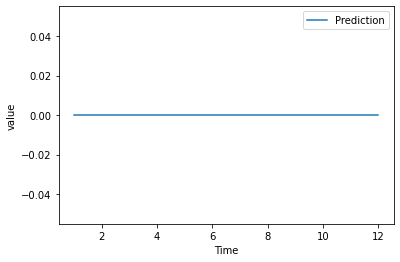

1010477


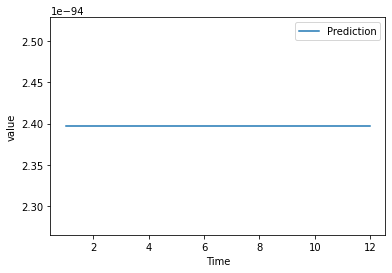

1010488


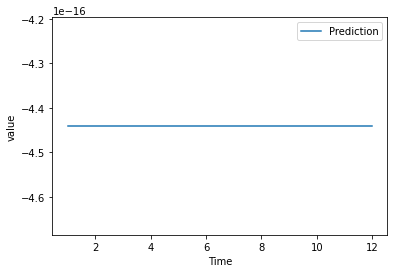

1010494


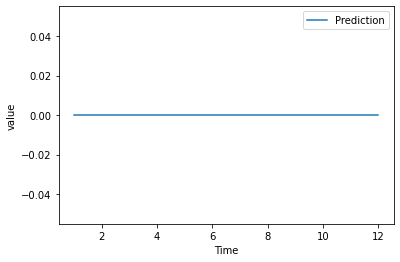

1030125


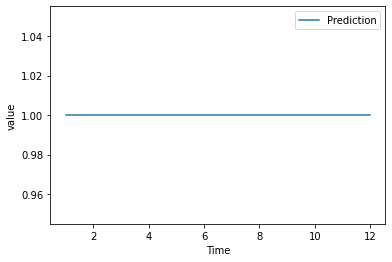

1030225


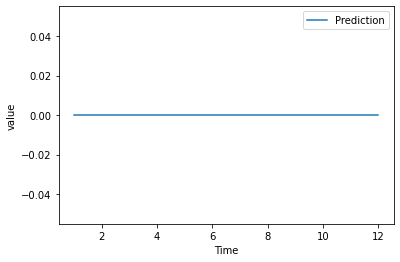

1040225


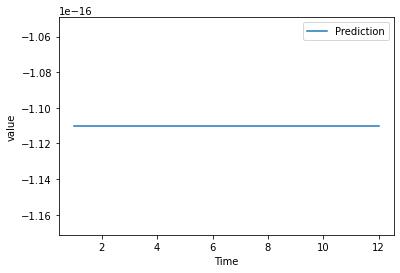

1040325


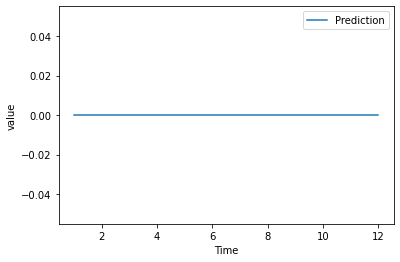

1060417


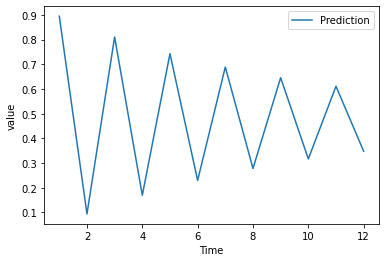

1060440


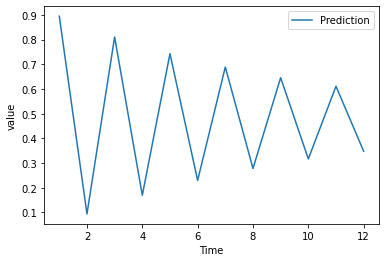

1060446


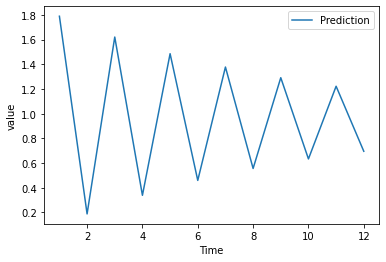

1060457


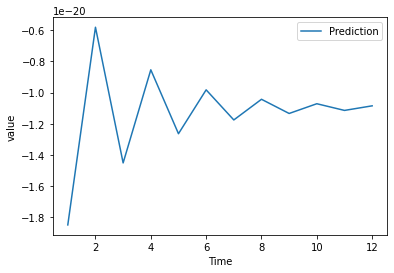

1060477


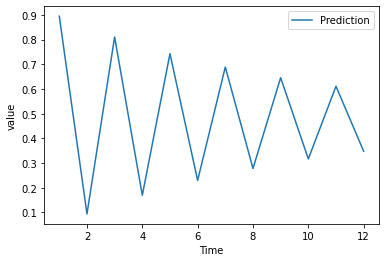

1080129


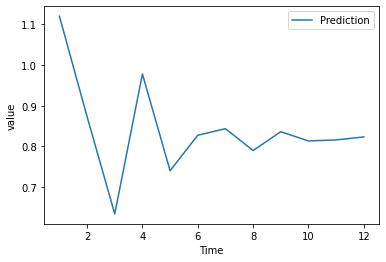

1080229


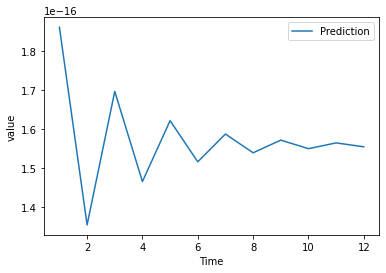

1080329


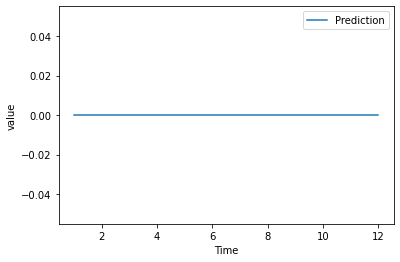

1090012


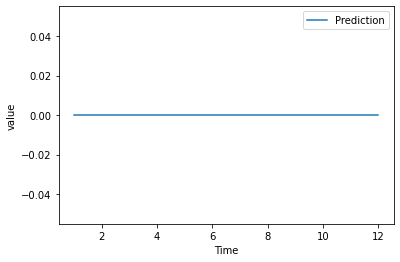

1090112


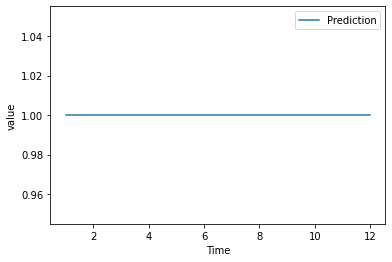

1110216


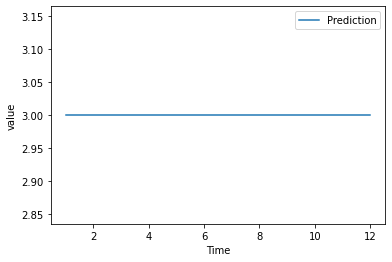

1110217


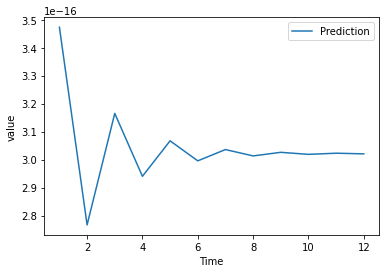

1110234


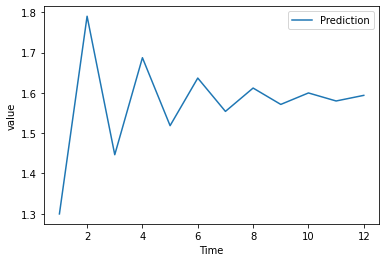

1110255


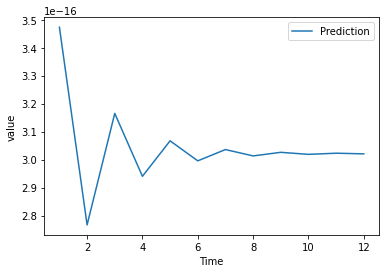

1110256


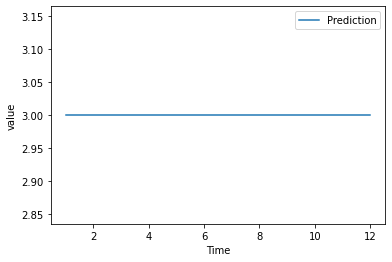

1110277


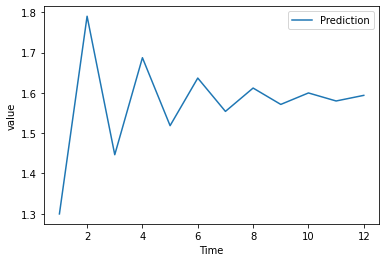

1140217


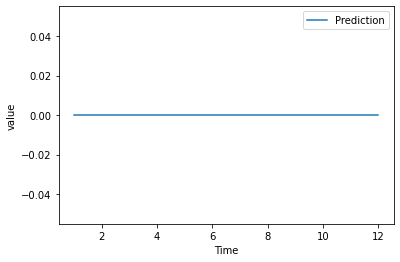

1140235


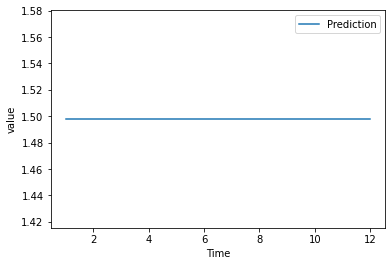

1140238


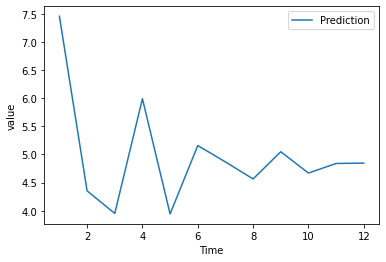

1140260


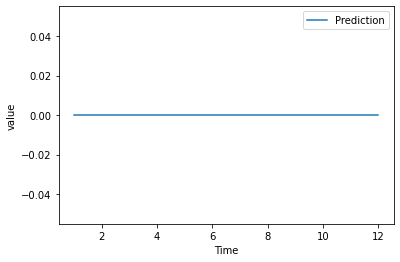

1150220


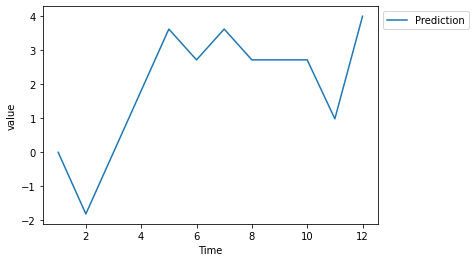

1150271


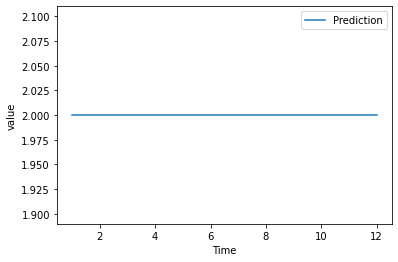

1150320


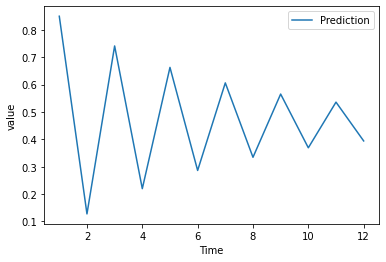

1150371


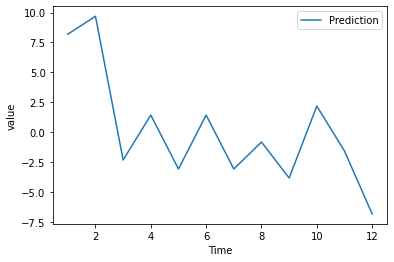

1202008


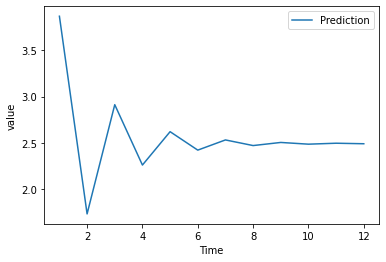

1202014


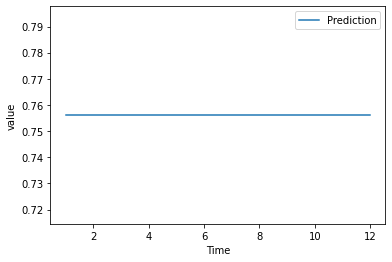

1202020


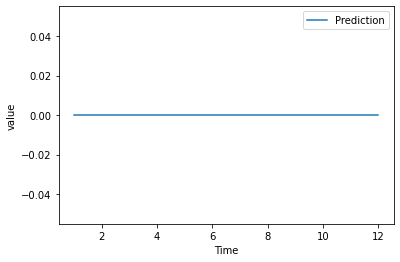

1202025


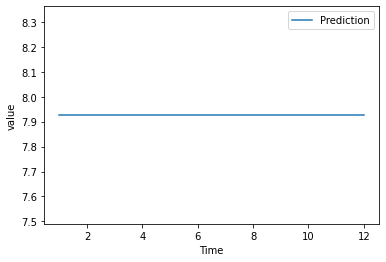

1202035


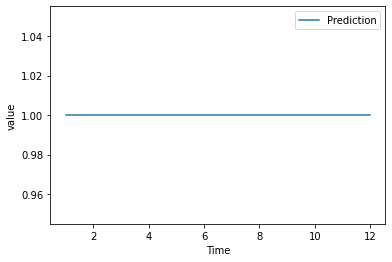

1202036


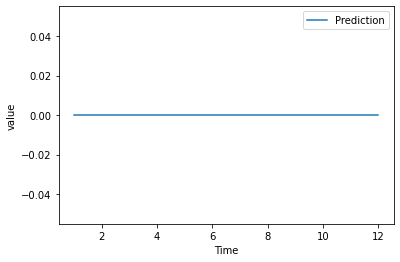

1202038


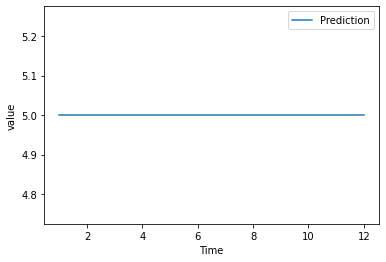

1202046


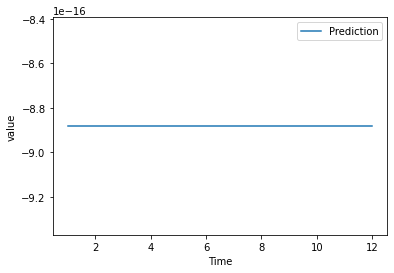

1202055


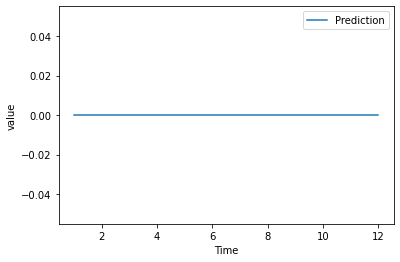

1202056


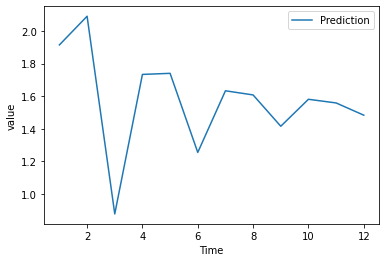

1202066


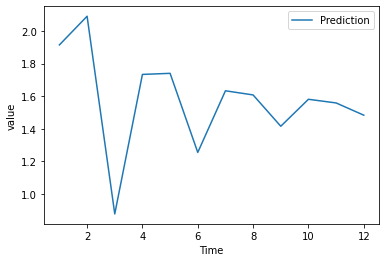

1202067


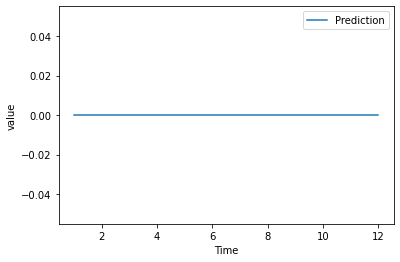

1202108


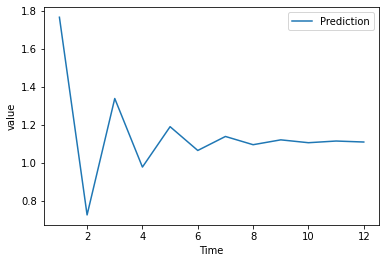

1202114


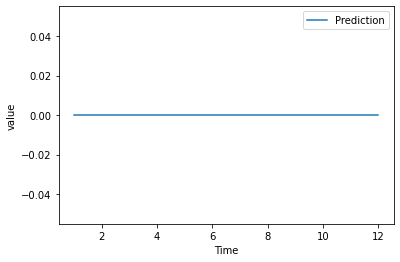

1202120


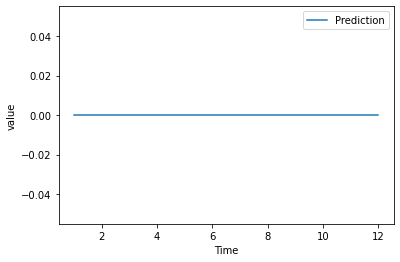

1202125


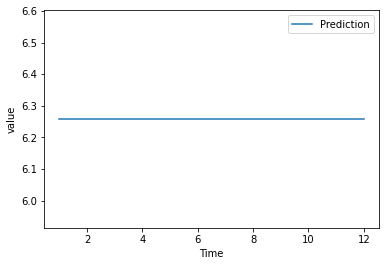

1202135


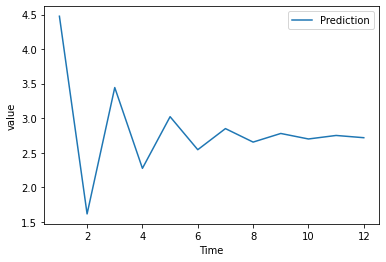

1202136


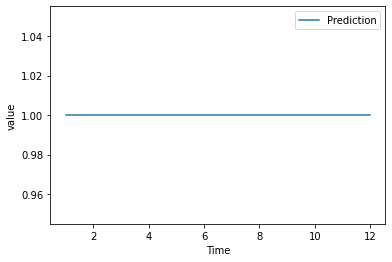

1202138


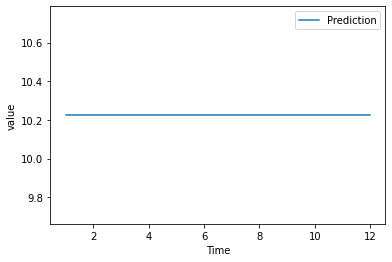

1202146


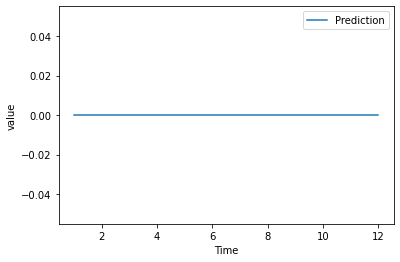

1202155


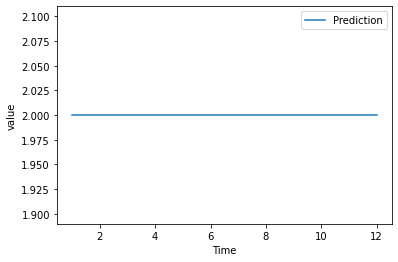

1202156


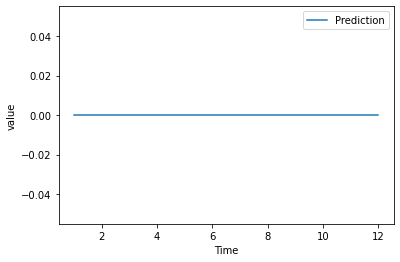

1202166


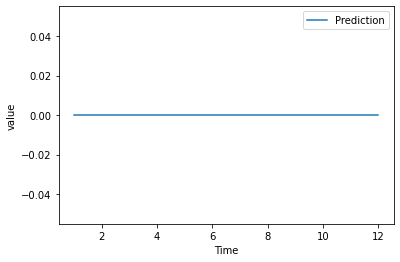

1202167


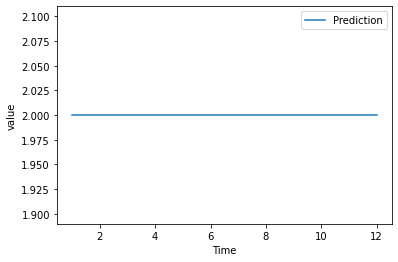

1220614


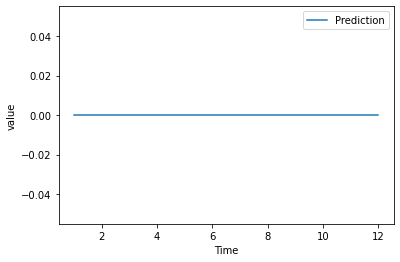

1220620


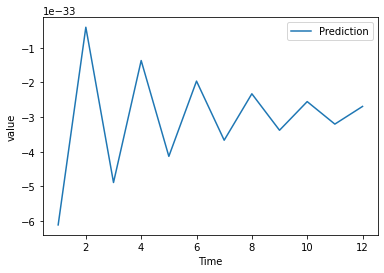

1220635


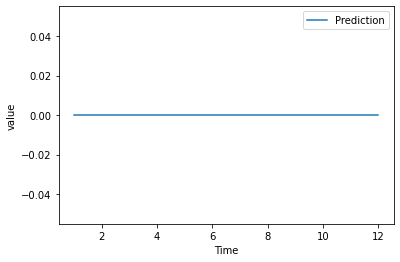

1220638


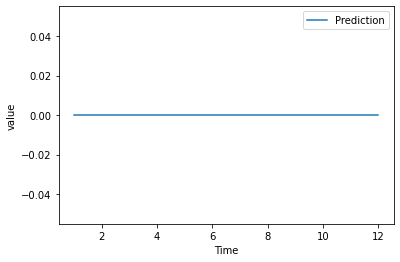

1240408


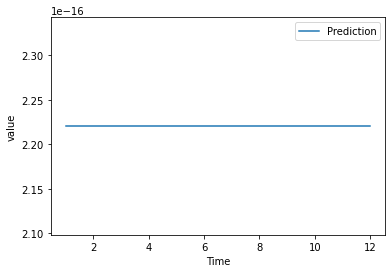

1240416


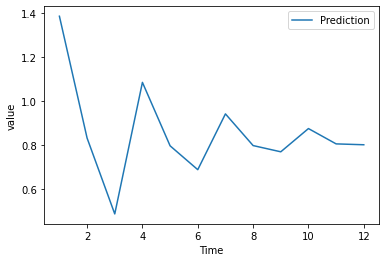

1240417


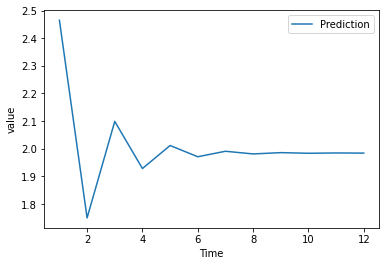

1240434


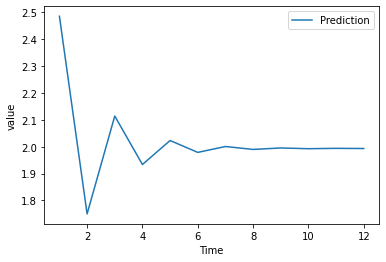

1240446


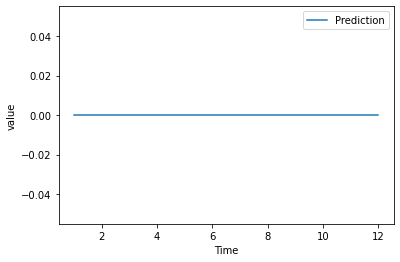

1240455


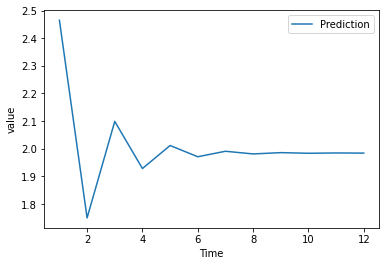

1240456


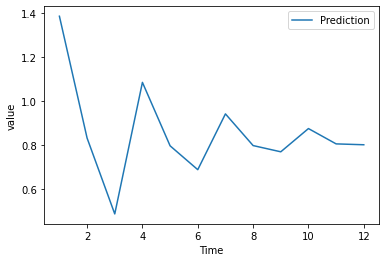

1240477


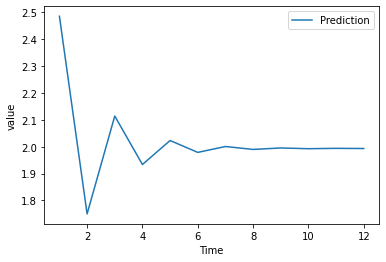

1310425


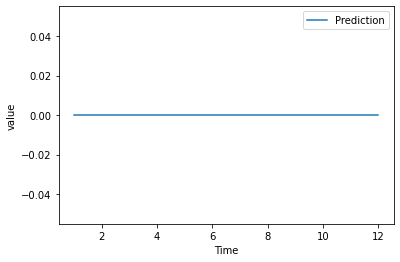

1310446


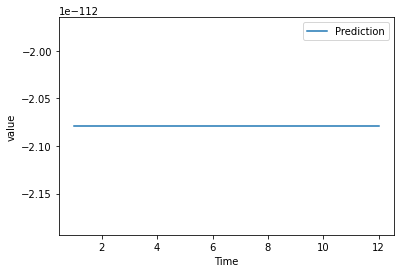

1310458


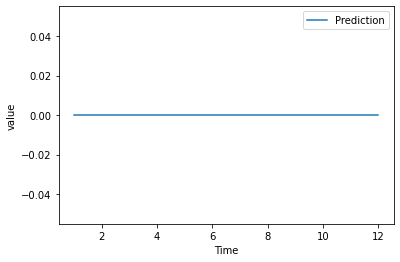

1310459


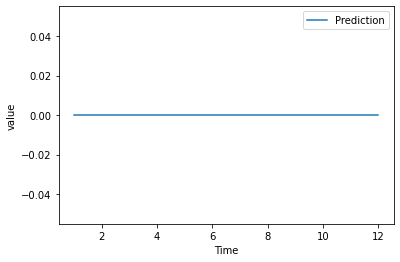

1310462


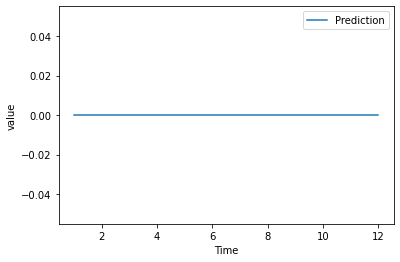

1310473


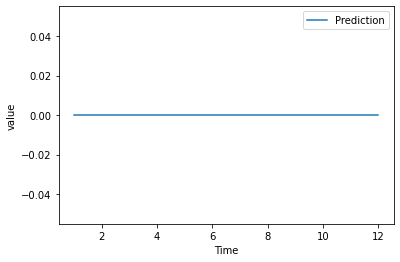

1310477


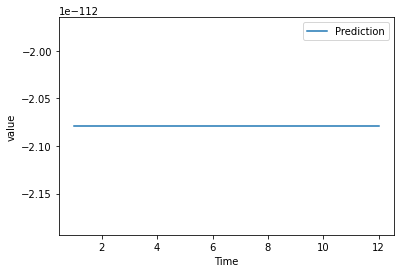

1330208


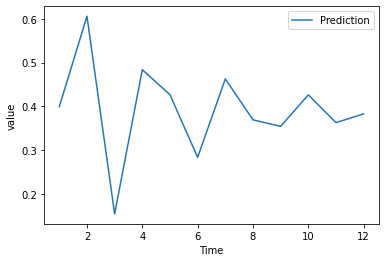

1330216


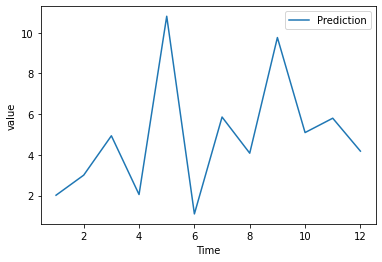

1330217


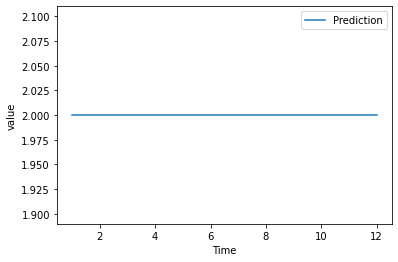

1330234


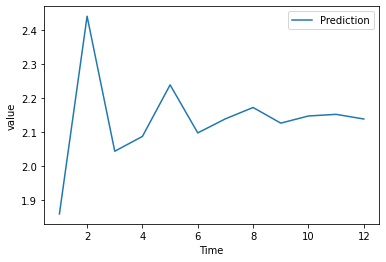

1330246


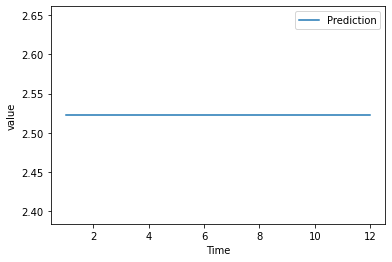

1330255


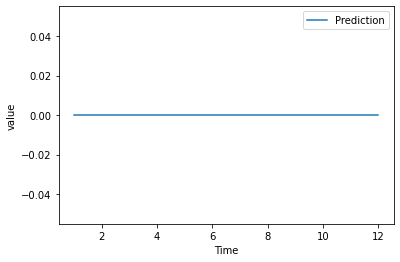

1330256


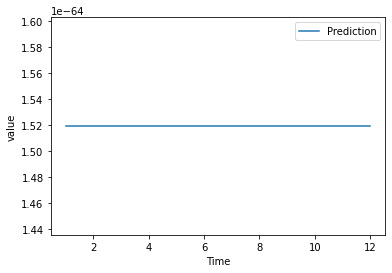

1330266


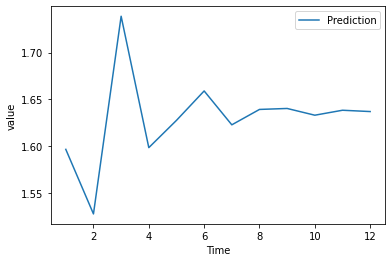

1330267


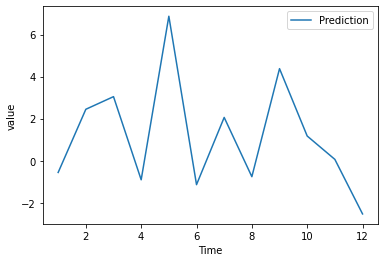

1330277


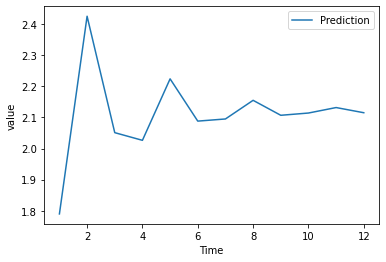

1340514


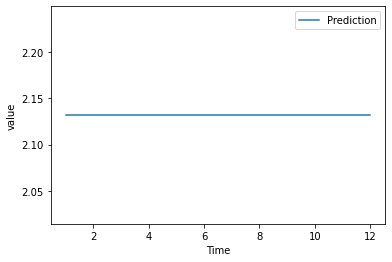

1340521


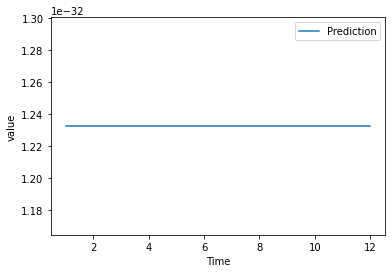

1340523


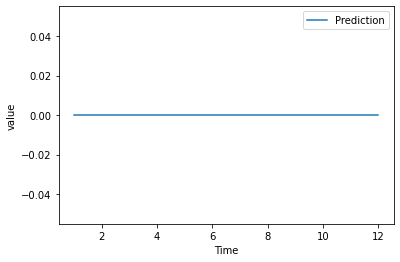

1340535


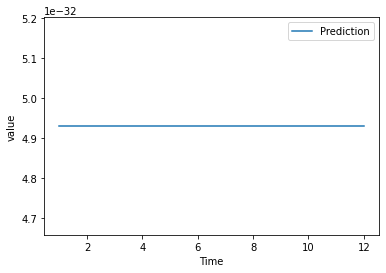

1340538


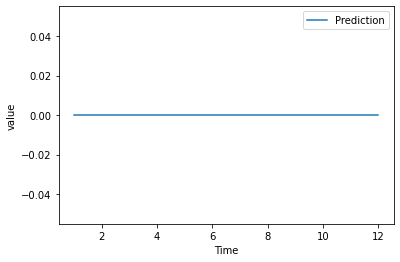

1390414


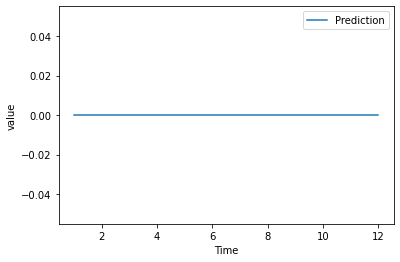

1390420


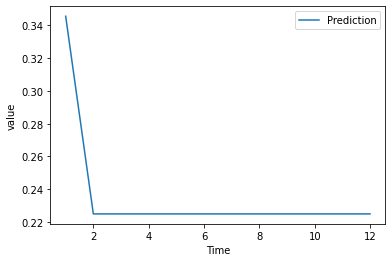

1390435


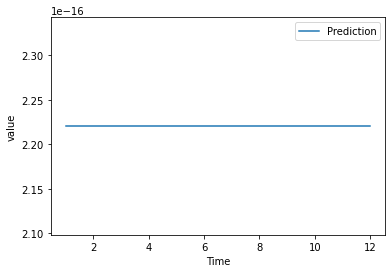

1390438


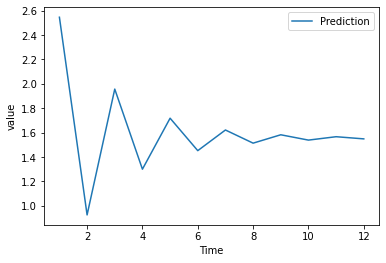

1390439


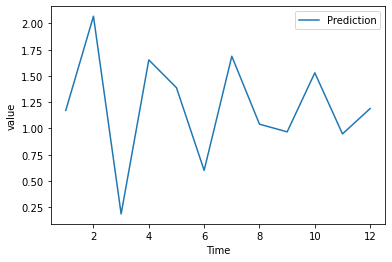

1470735


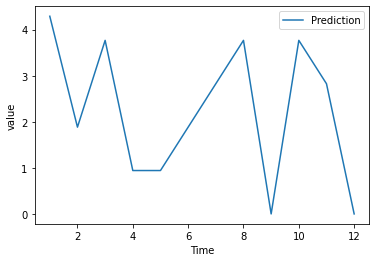

1470738


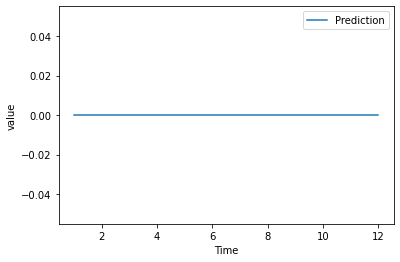

1510414


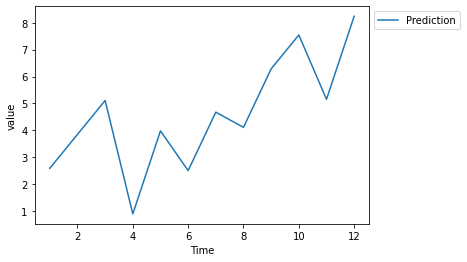

1510423


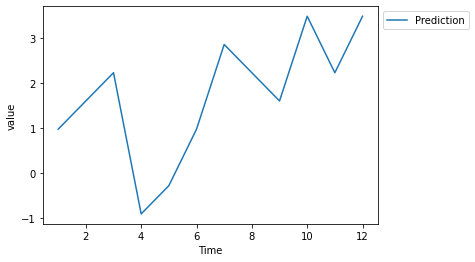

1510435


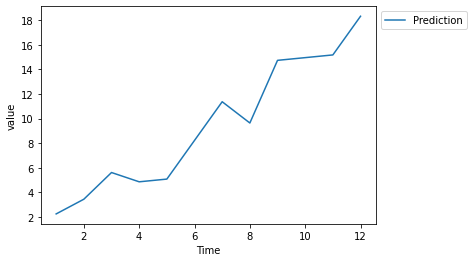

1510438


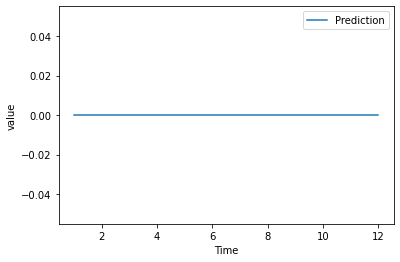

1580425


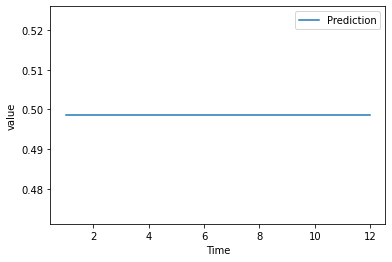

1580486


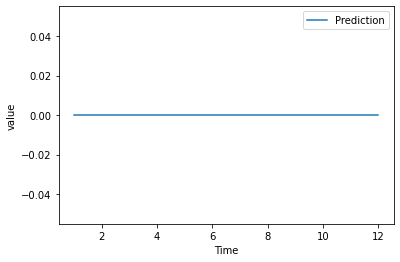

1580488


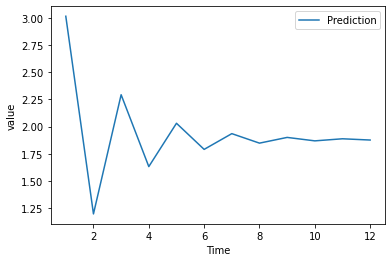

1620320


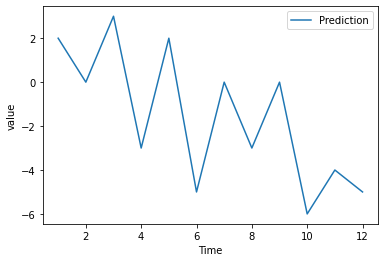

1620335


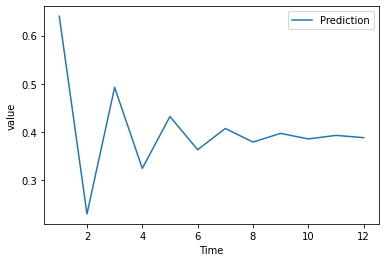

1620338


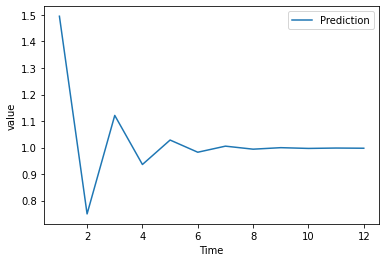

1660008


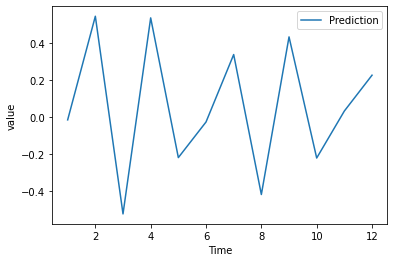

1660021


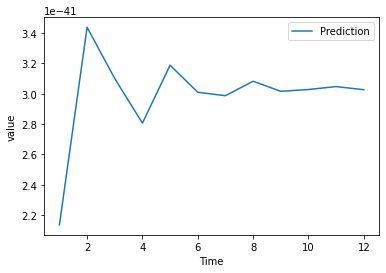

1660046


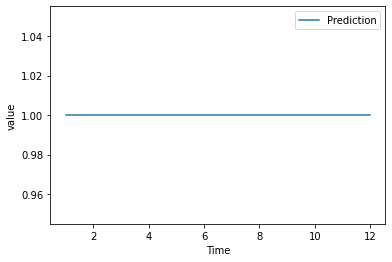

1660055


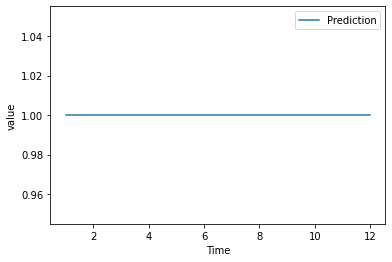

1660067


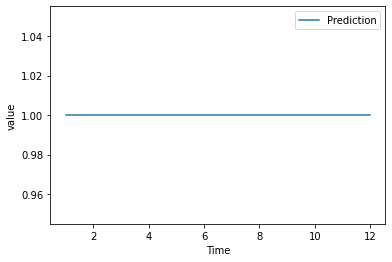

1660125


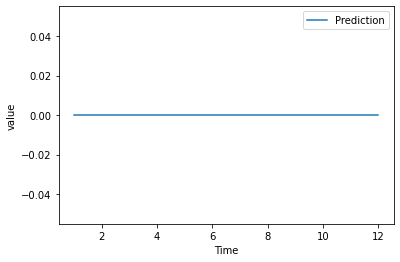

1660135


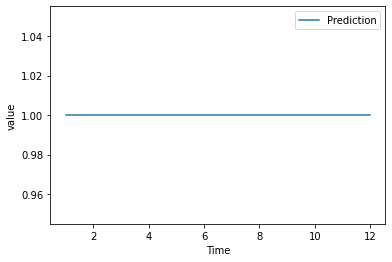

1660138


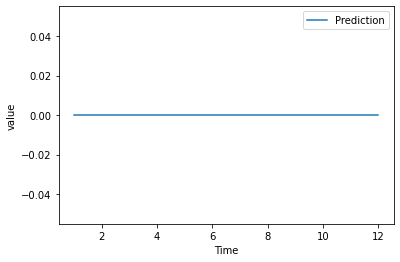

1660139


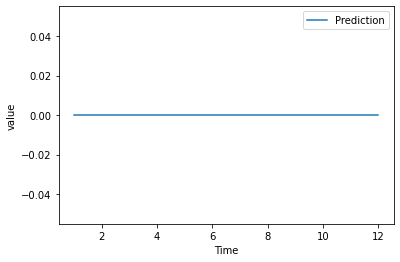

1660146


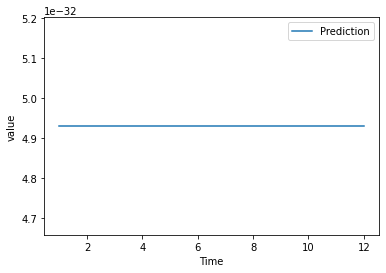

1660155


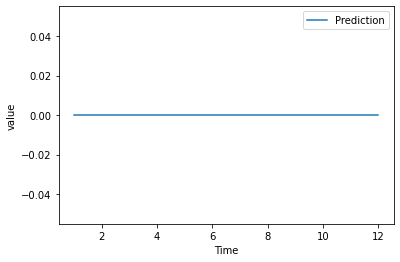

1660156


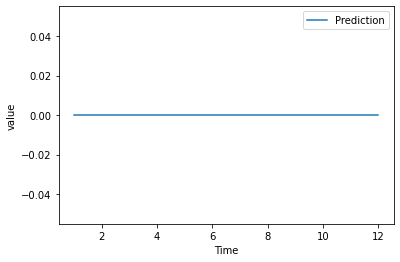

1660166


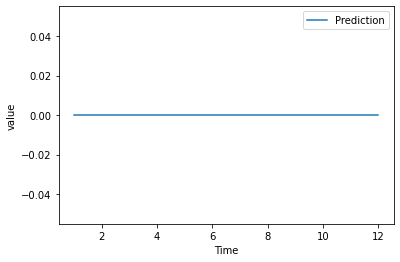

1660167


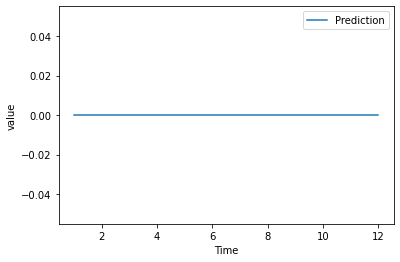

1770147


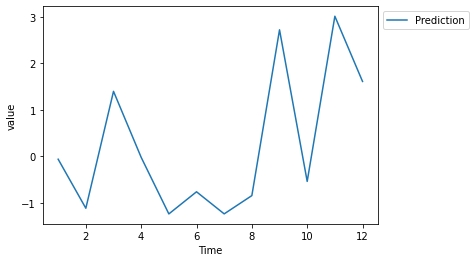

1770152


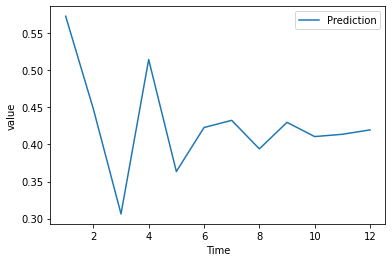

1770177


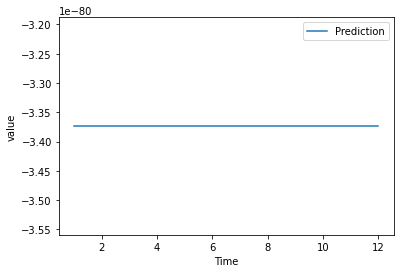

1770181


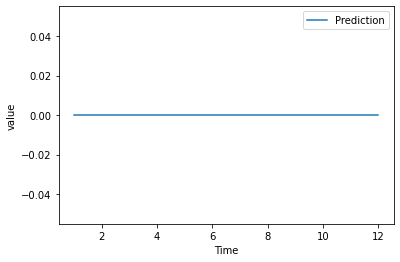

1770182


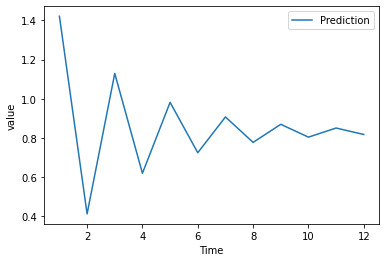

1770194


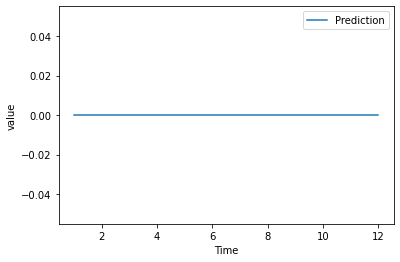

1770196


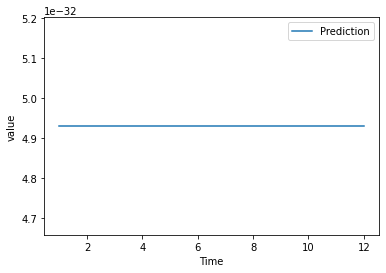

1780117


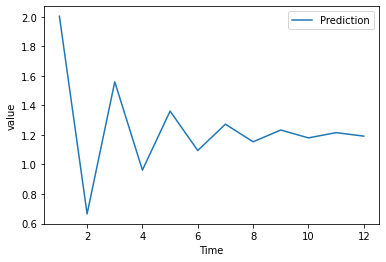

1780135


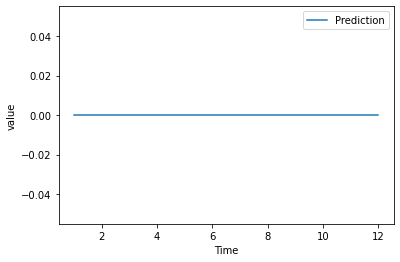

1780138


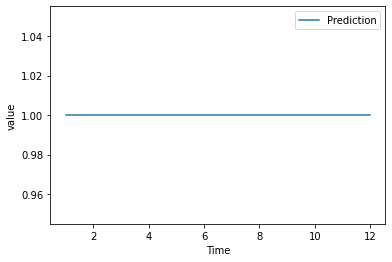

1780142


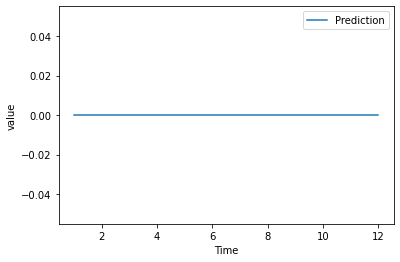

1810214


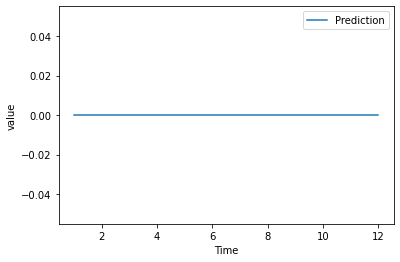

1810218


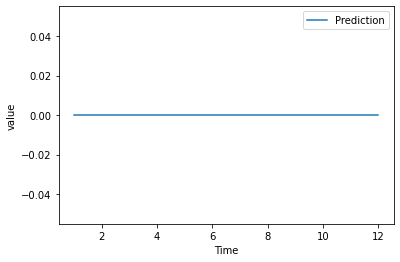

1810220


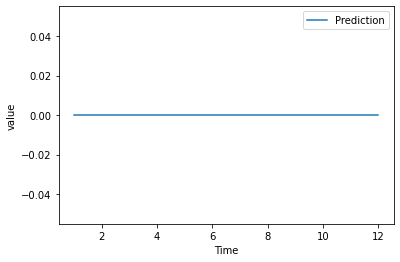

1810260


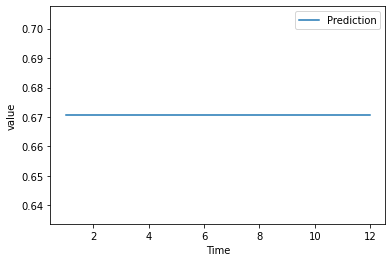

1810268


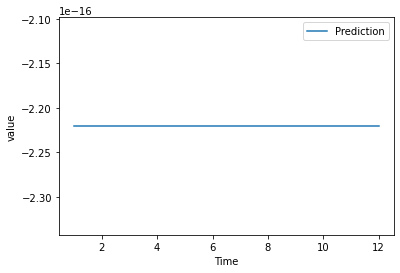

1900406


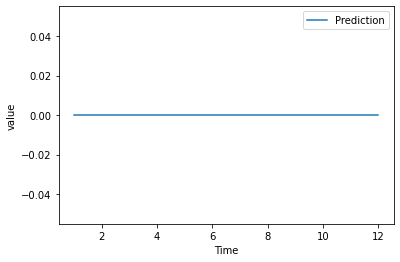

1910313


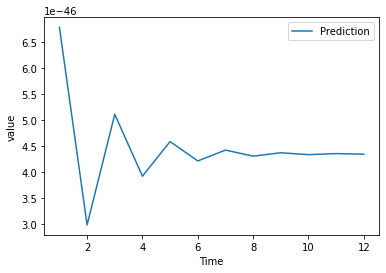

1910314


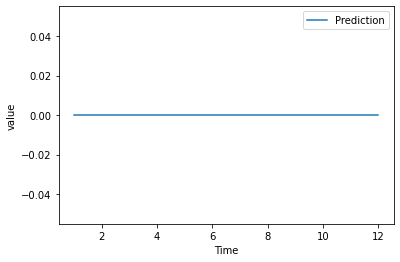

1910315


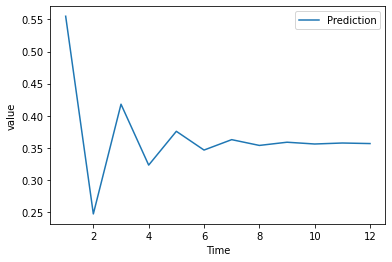

1920246


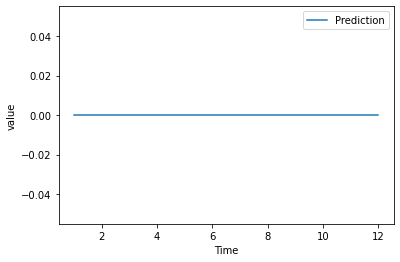

1920248


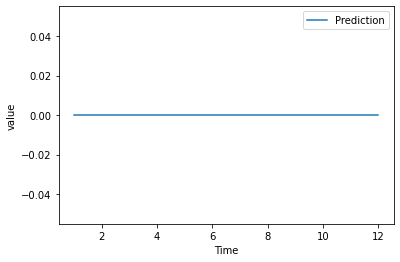

1920249


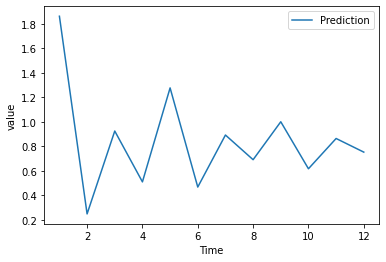

1920255


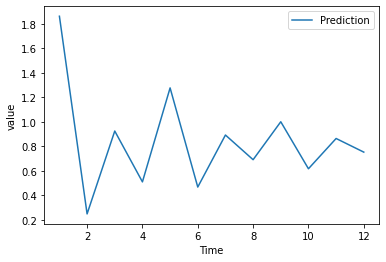

1920256


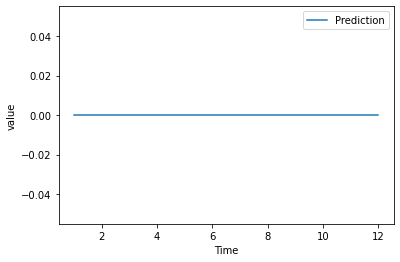

1960408


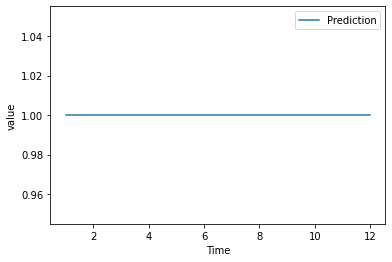

1960446


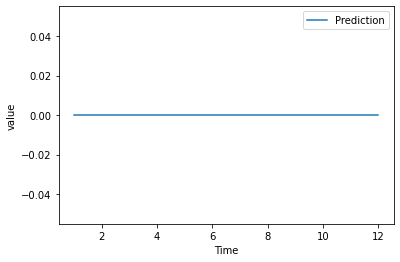

1960466


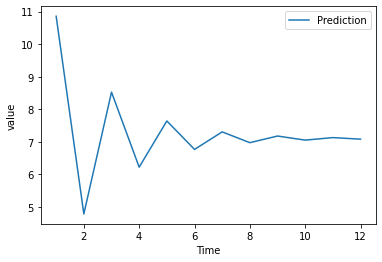

1960467


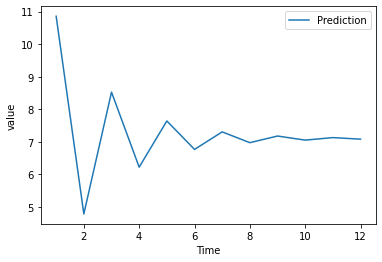

1960477


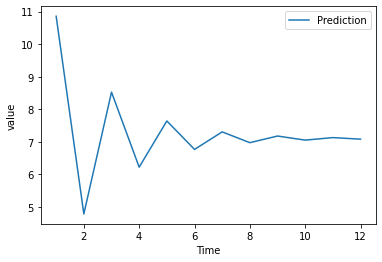

1980308


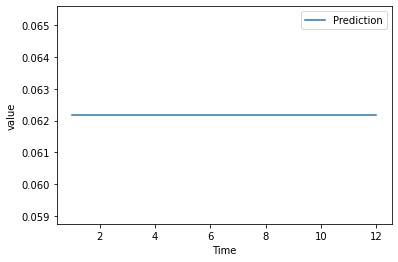

1980314


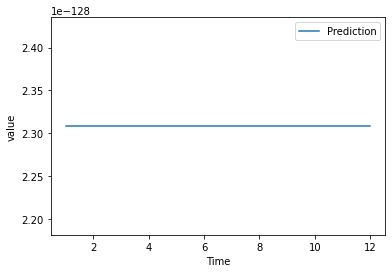

1980320


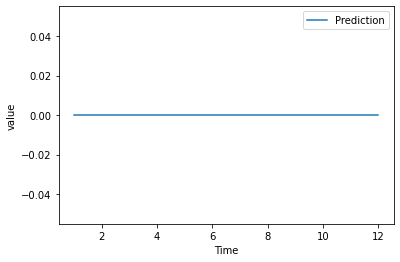

1980321


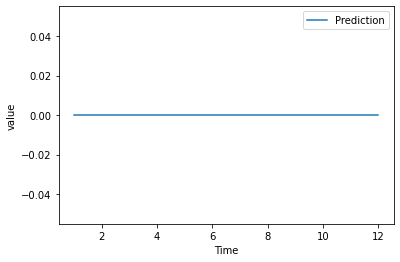

1980335


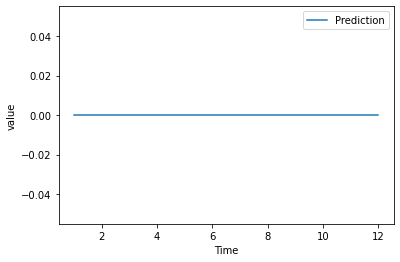

1980338


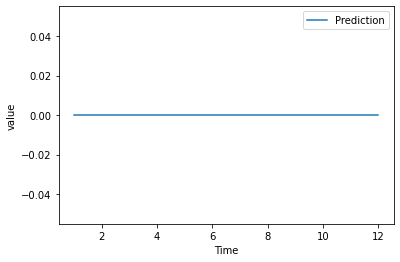

1990026


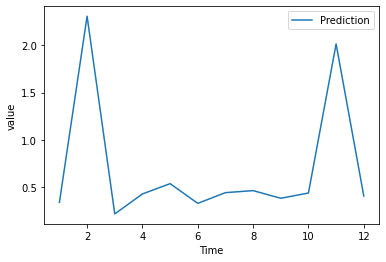

2010208


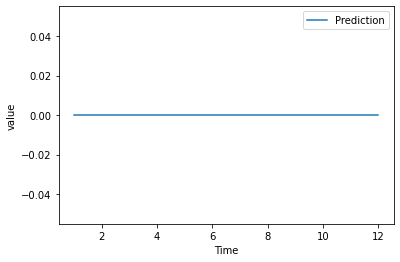

2010216


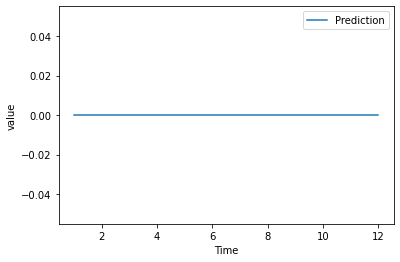

2010217


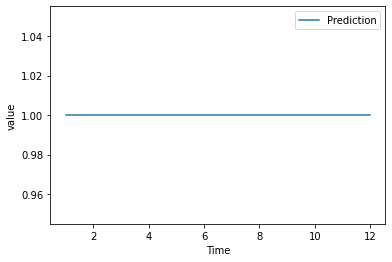

2010225


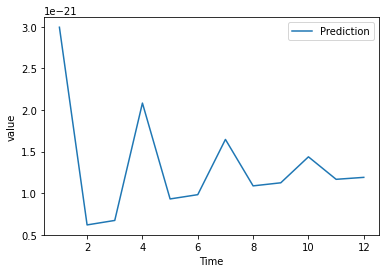

2010235


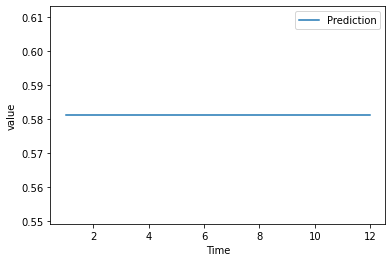

2010238


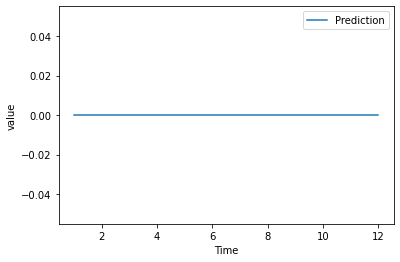

2010266


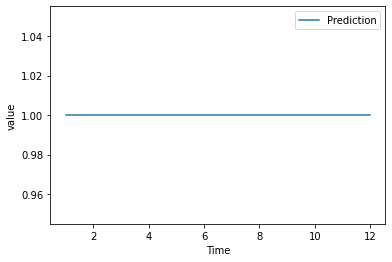

2010267


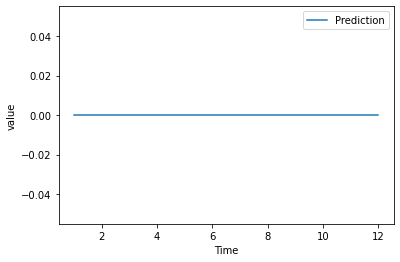

2070235


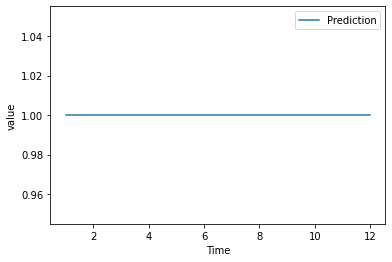

2070238


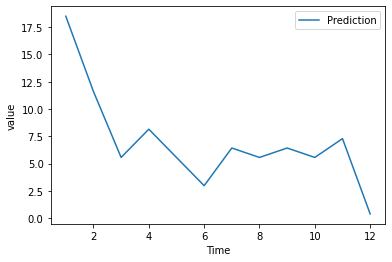

2070239


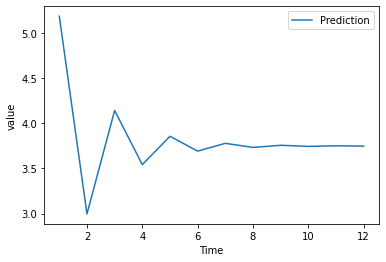

2070260


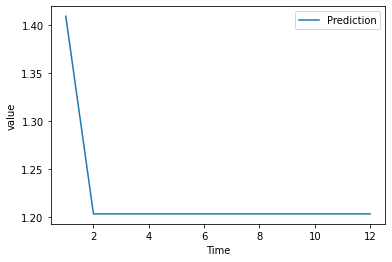

2080112


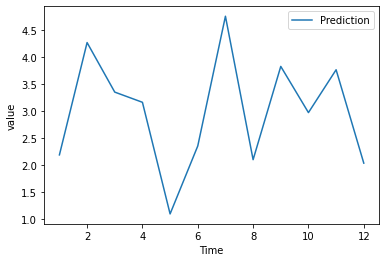

2100114


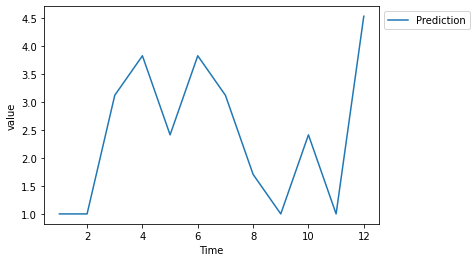

2100123


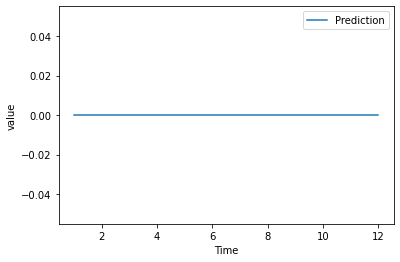

2100135


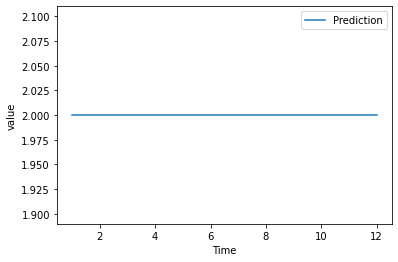

2100138


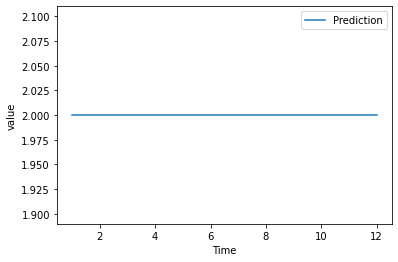

2100139


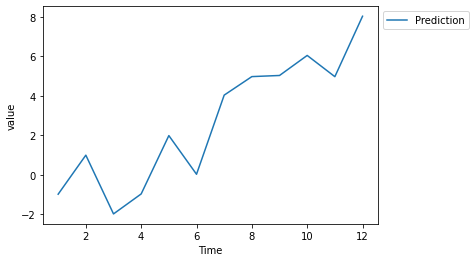

2150613


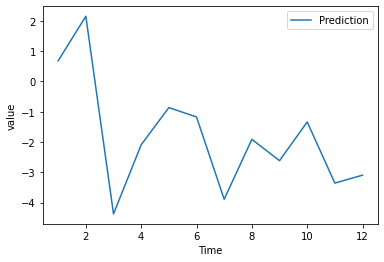

2150713


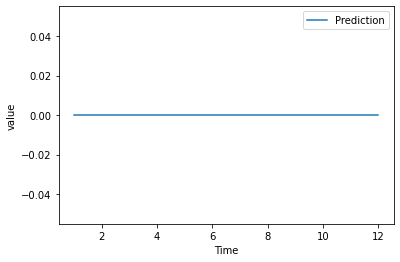

2160412


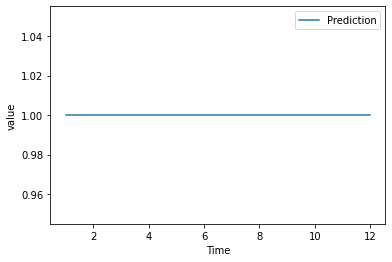

2200313


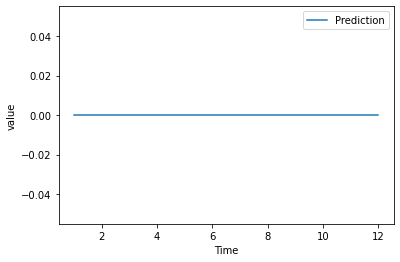

2230214


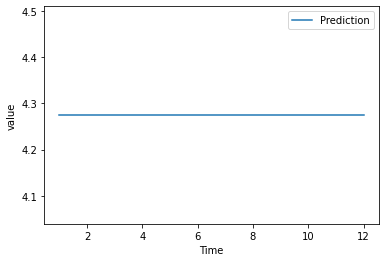

2230223


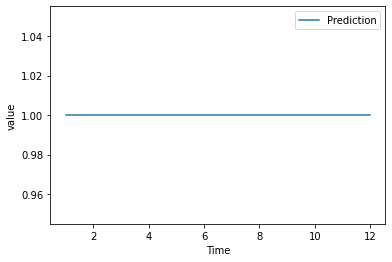

2230235


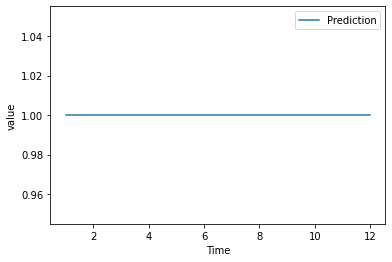

2230238


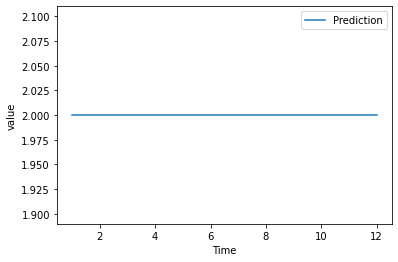

2420261


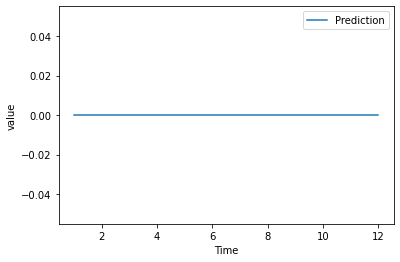

2440108


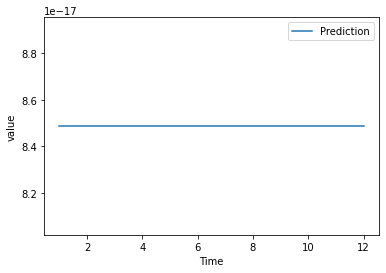

2440138


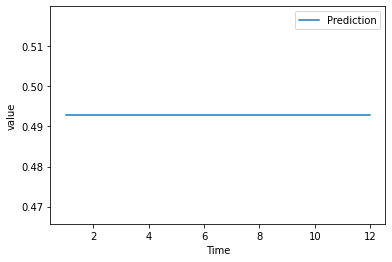

2440208


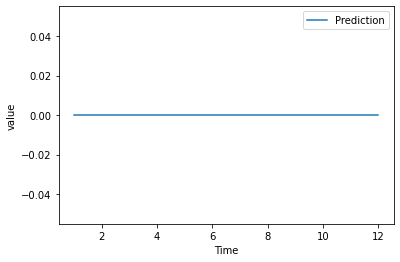

2440238


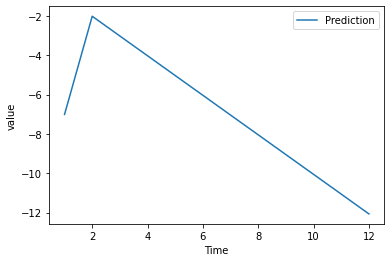

2440308


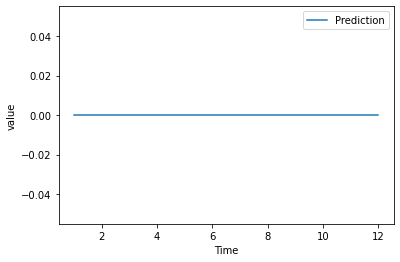

2440338


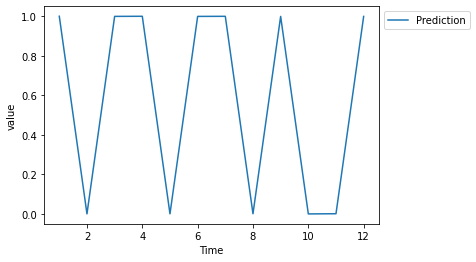

2450513


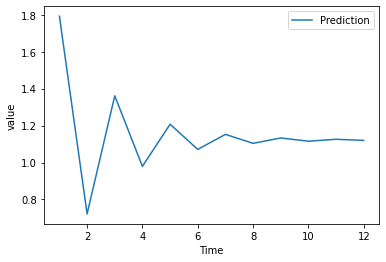

2450515


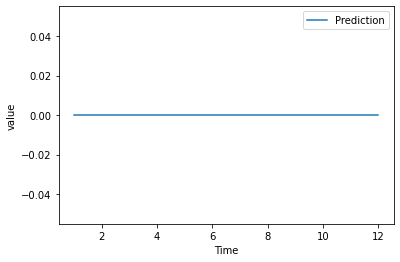

2450518


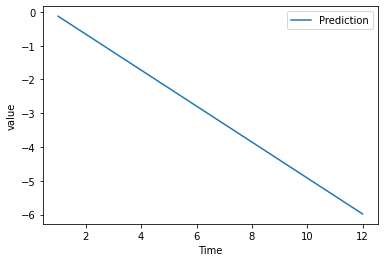

2500308


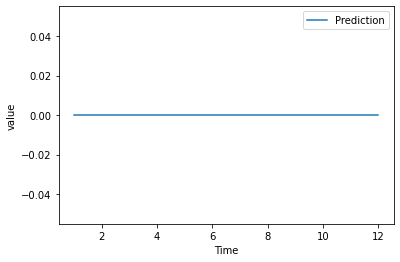

2500316


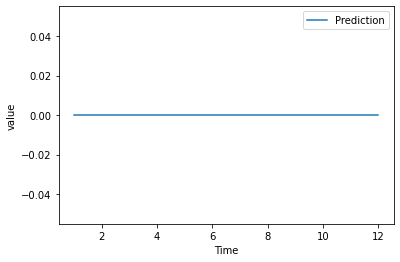

2500317


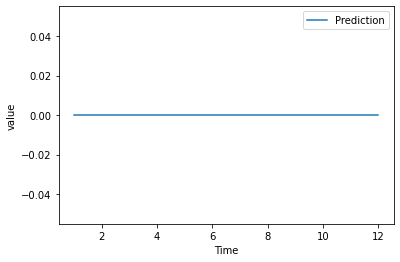

2500366


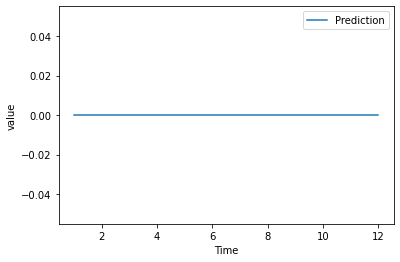

2500367


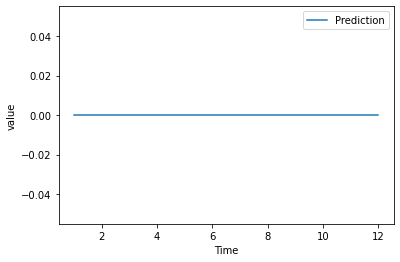

2580108


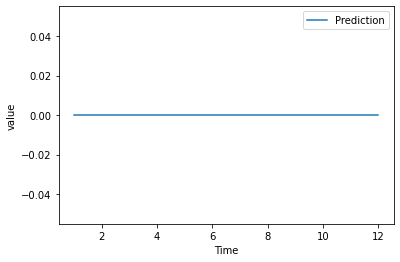

2580146


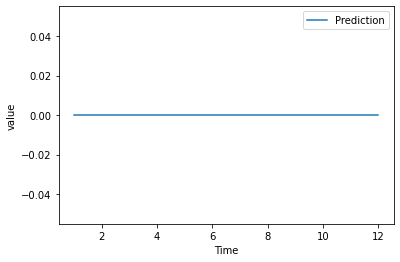

2580164


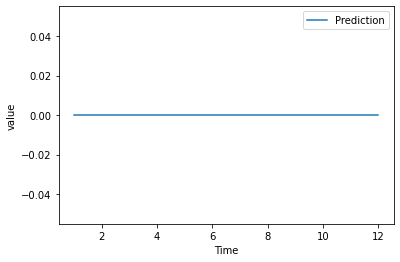

2580165


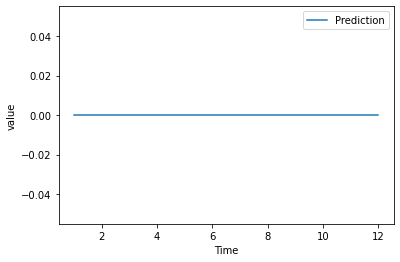

2580177


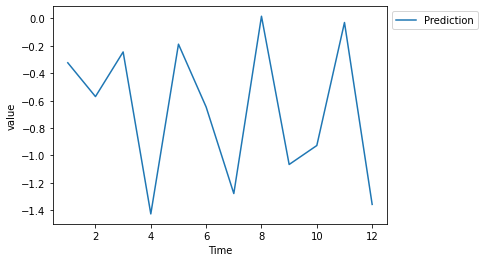

2720211


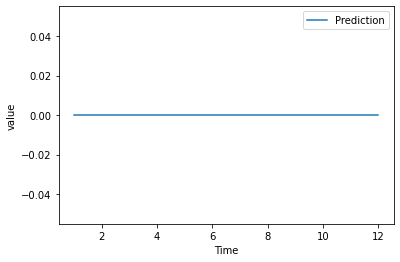

2720267


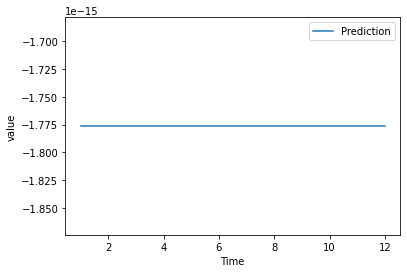

2740321


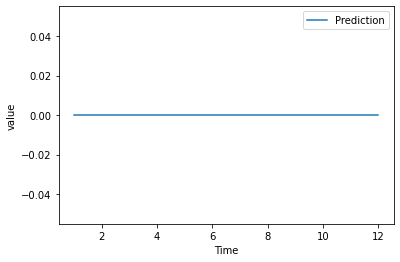

2760216


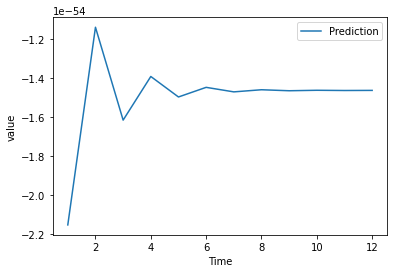

2760217


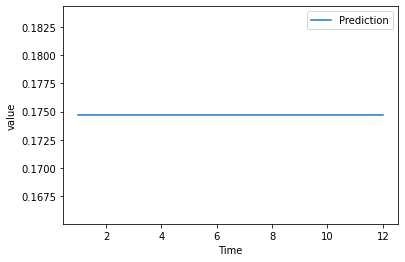

2760266


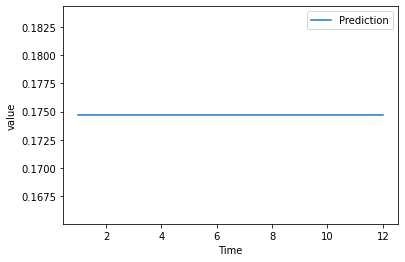

2760267


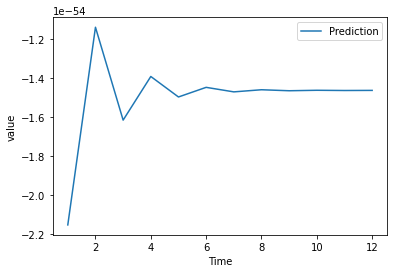

2780125


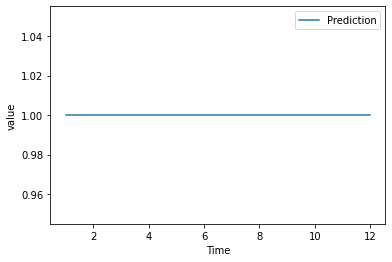

2780148


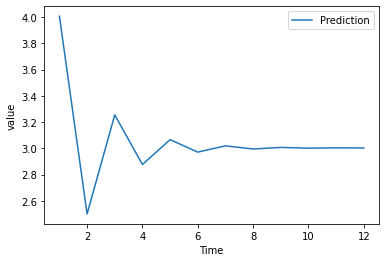

2780149


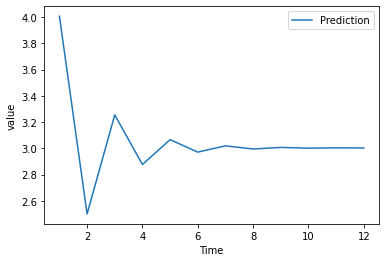

2780225


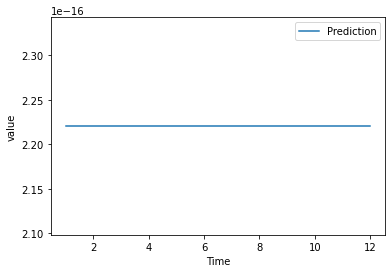

2780248


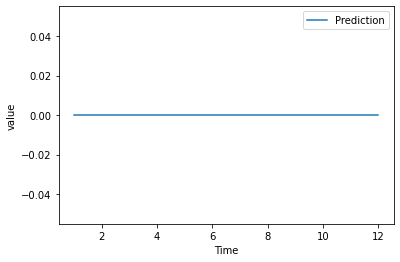

2780249


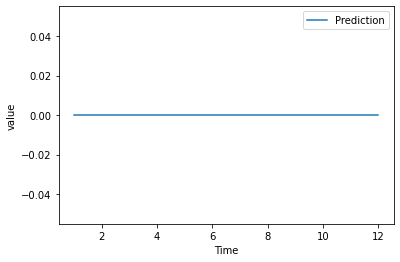

2910125


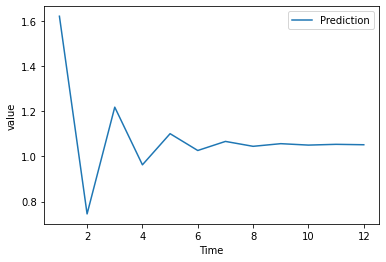

2910188


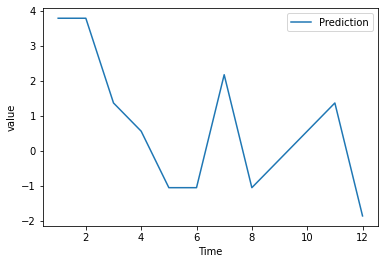

2910194


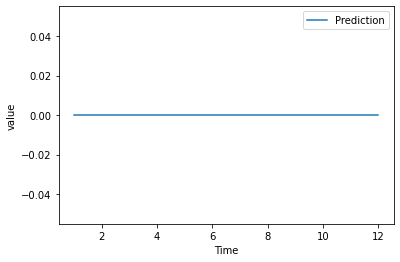

2910225


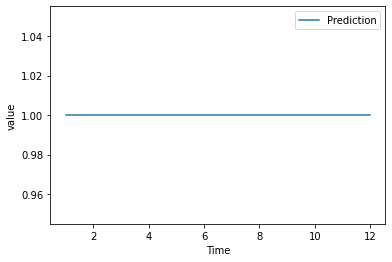

2910288


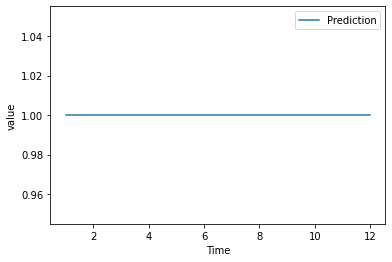

2910294


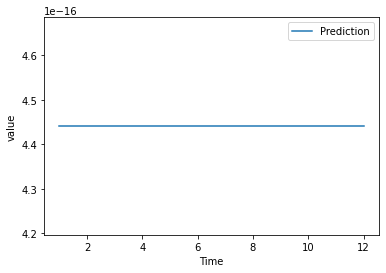

2960314


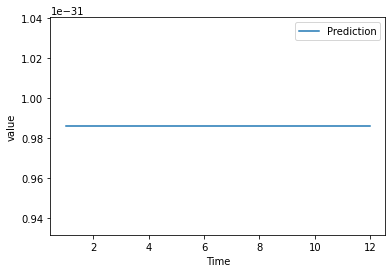

2960323


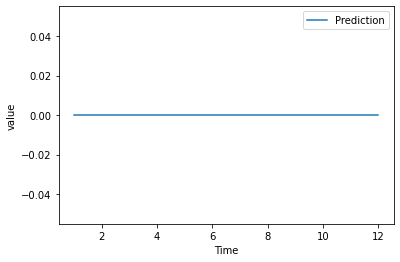

2960335


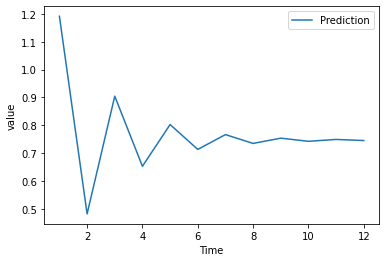

2960338


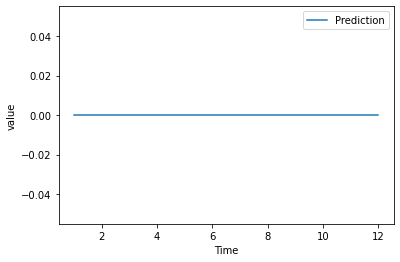

2980108


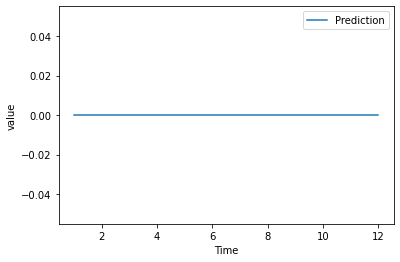

2980146


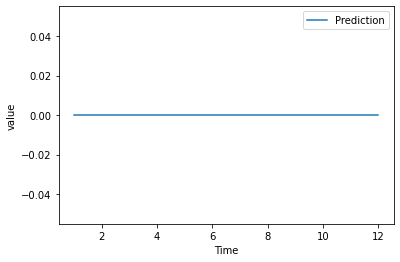

2980164


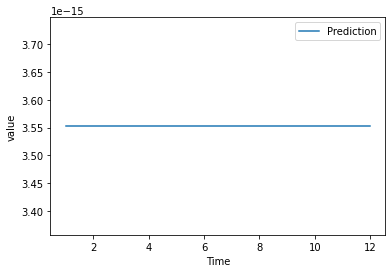

2980165


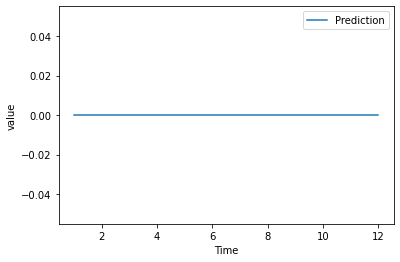

2980177


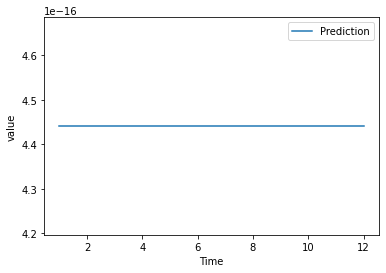

3000413


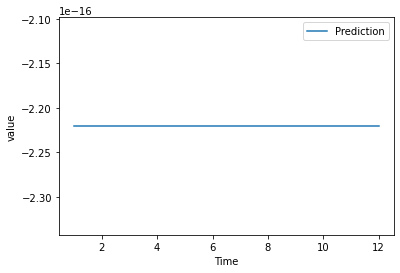

3000415


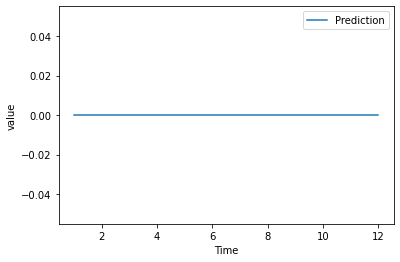

3000418


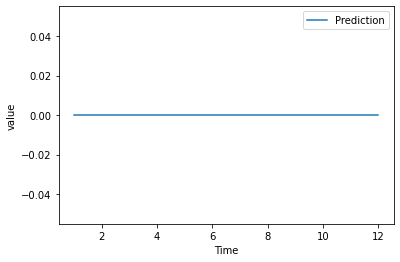

3080308


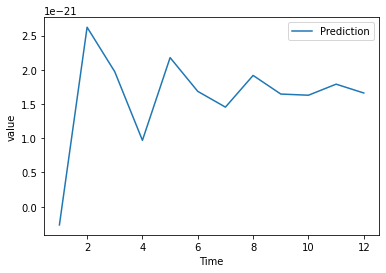

3080314


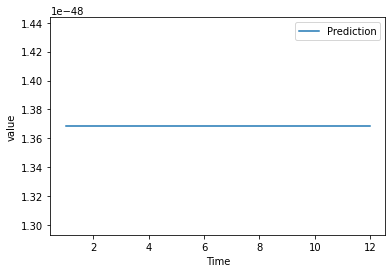

3080323


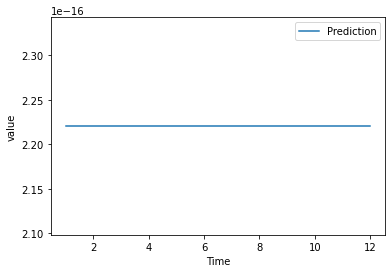

3080335


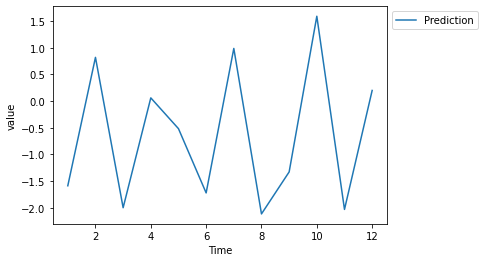

3080338


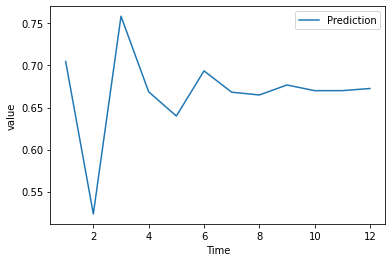

3080342


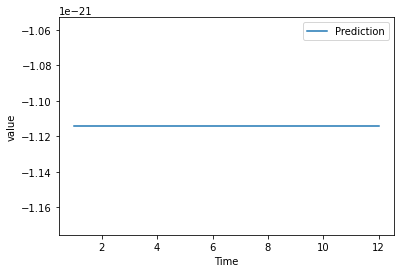

3110208


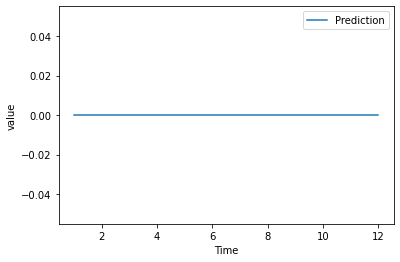

3110246


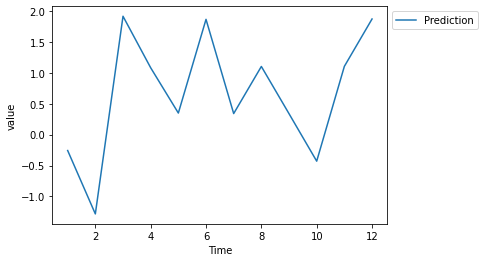

3110264


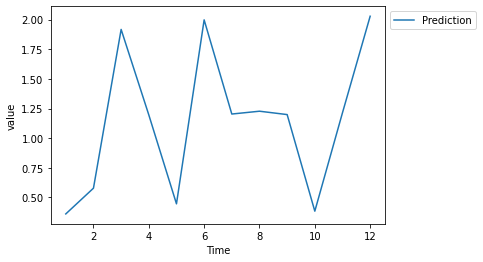

3110265


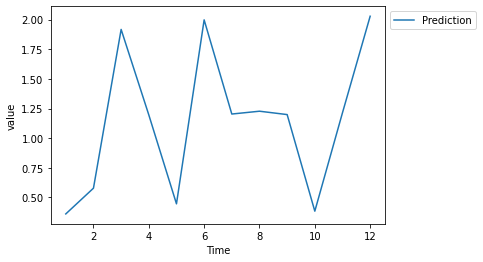

3110277


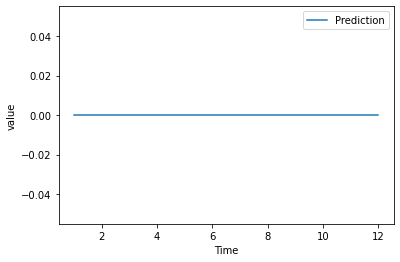

3110408


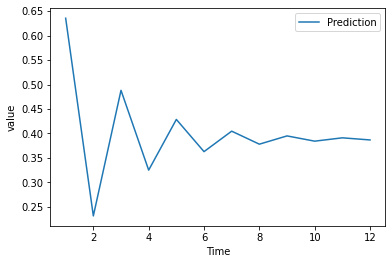

3110446


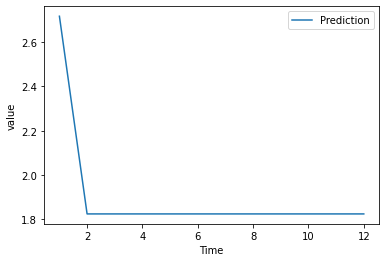

3110464


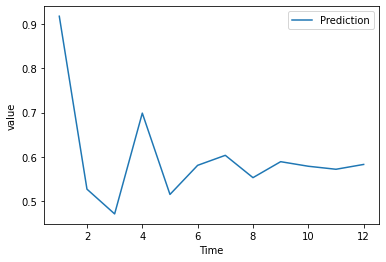

3110465


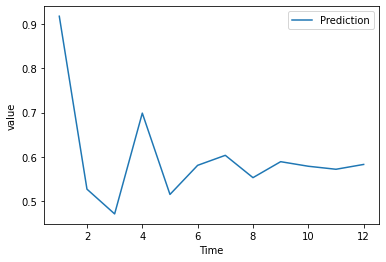

3110477


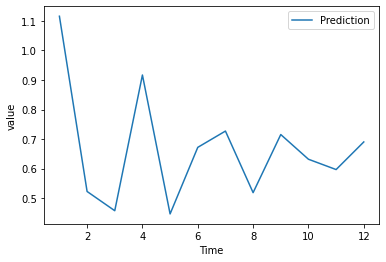

3120114


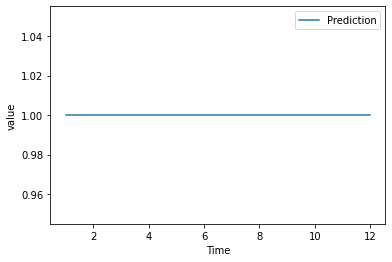

3120123


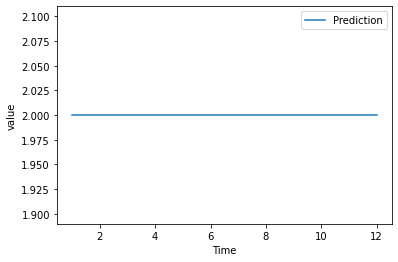

3120135


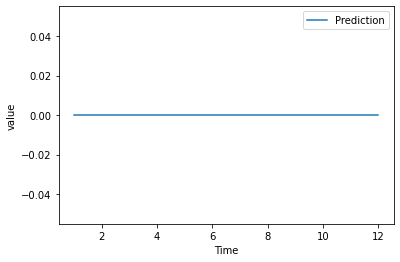

3120138


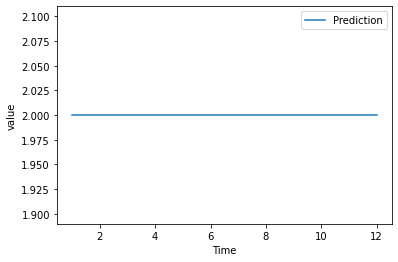

3150223


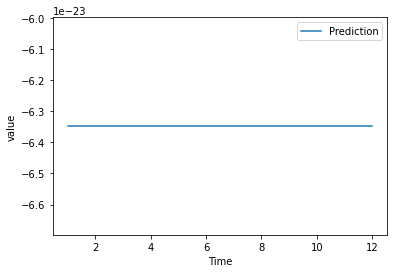

3150235


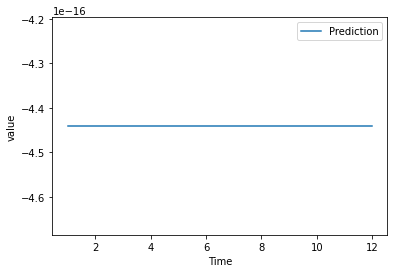

3150238


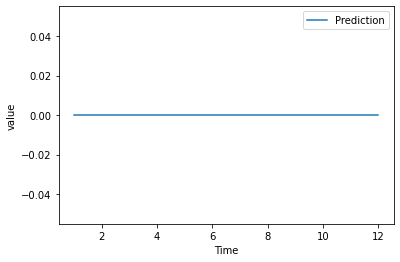

3190125


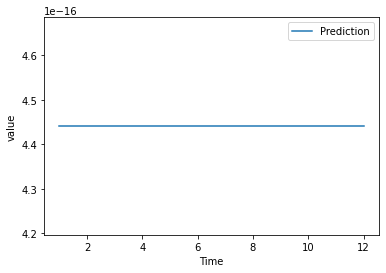

3190135


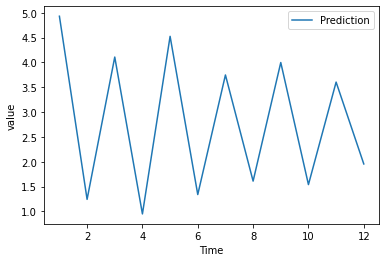

3190138


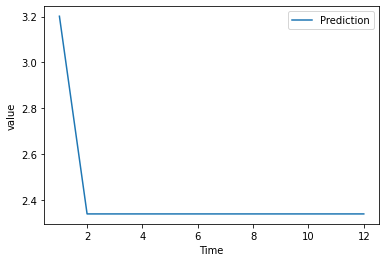

3190139


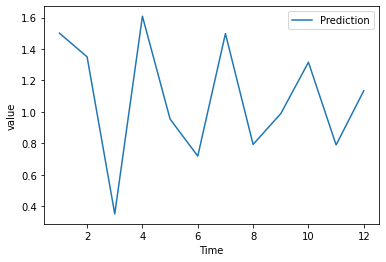

3290214


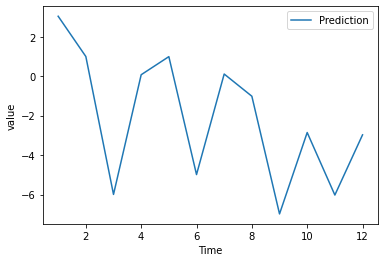

3290220


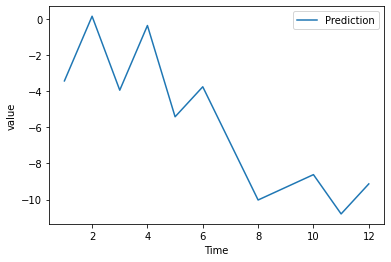

3290235


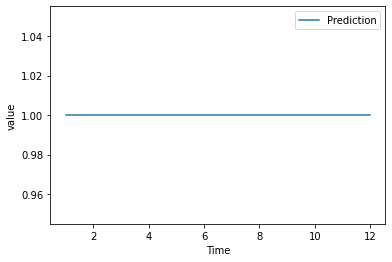

3290238


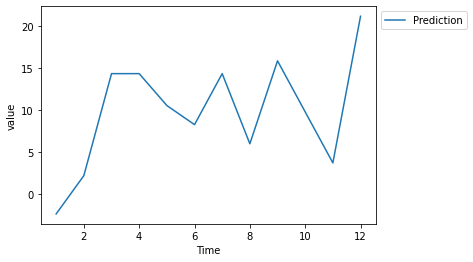

8070234


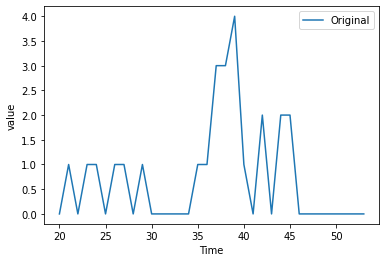

8070266


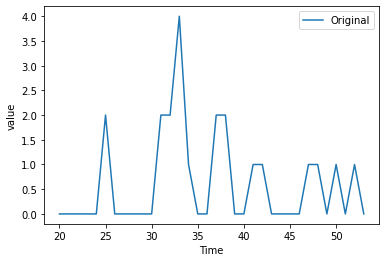

8070267


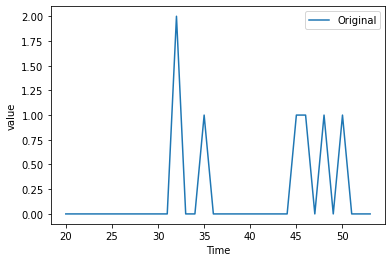

8070308


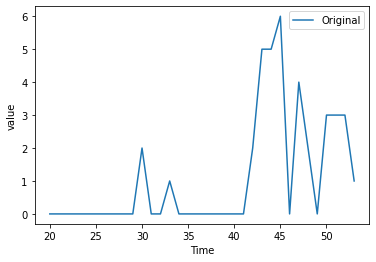

8070316


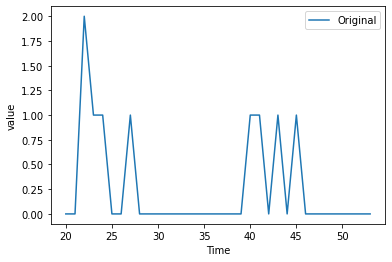

8070317


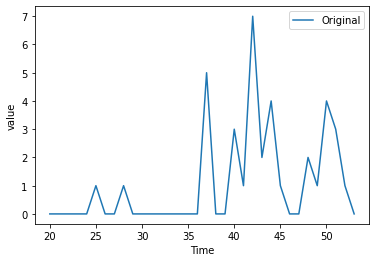

8070325


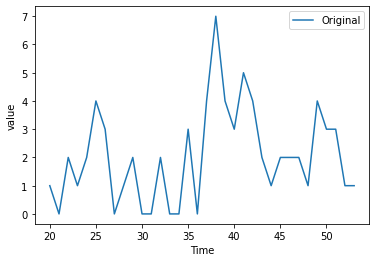

8070334


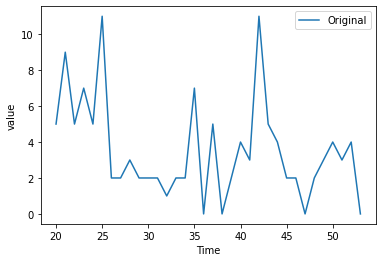

8070366


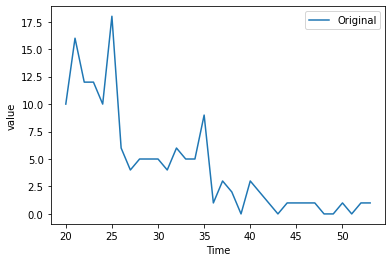

8070367


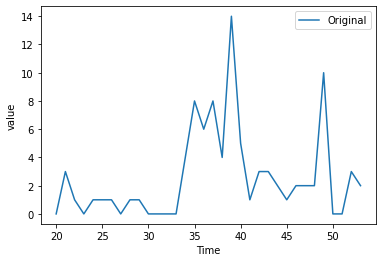

8110325


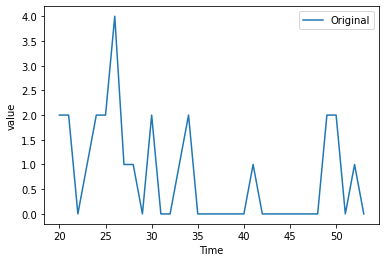

8110425


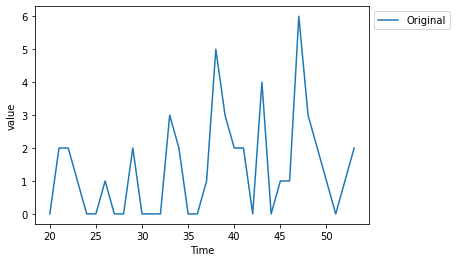

8110498


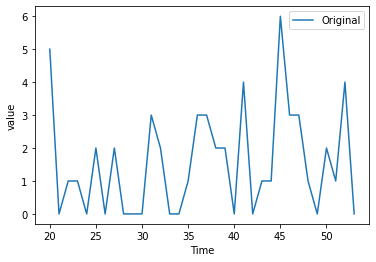

8110525


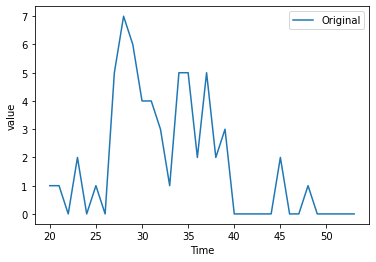

8110598


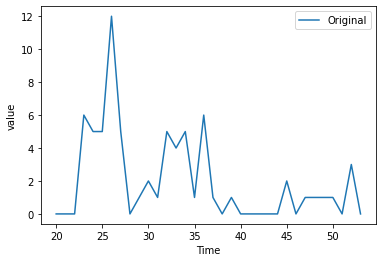

8120208


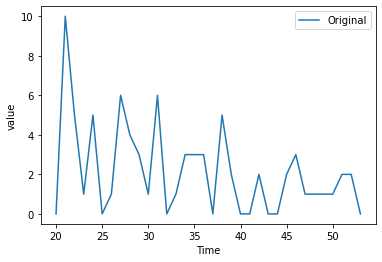

8120216


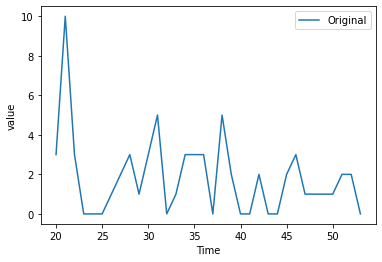

8120217


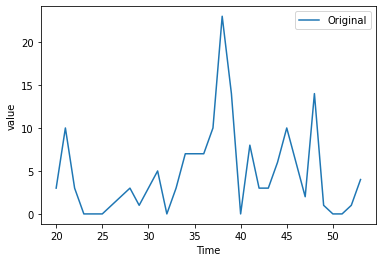

8120234


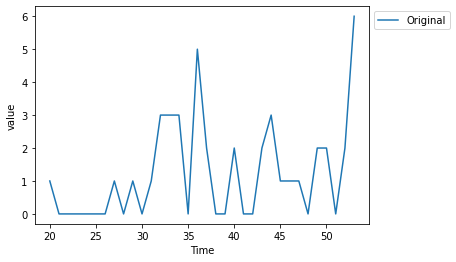

8120246


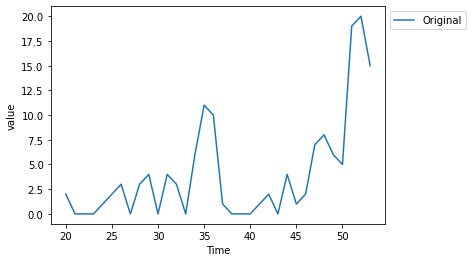

8120248


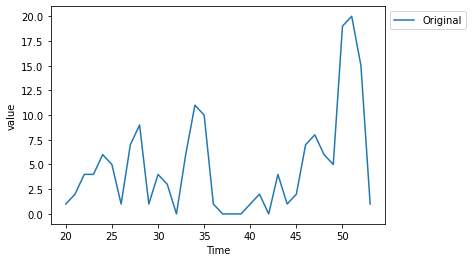

8120249


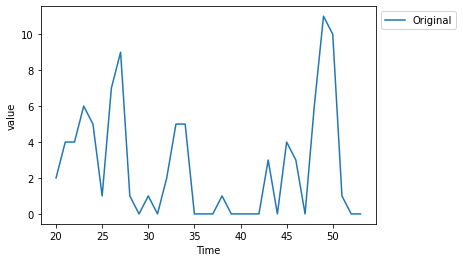

8200215


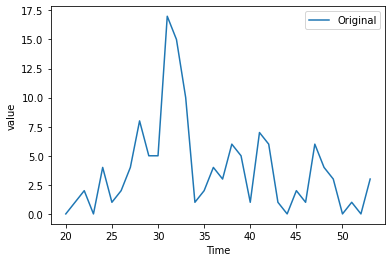

8200218


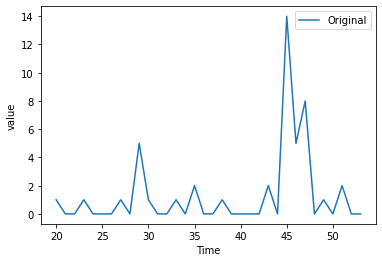

8210525


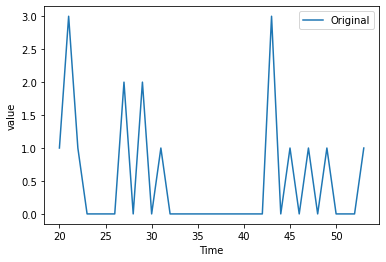

8210588


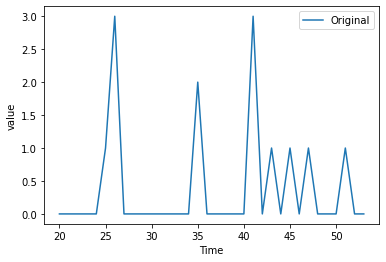

8210594


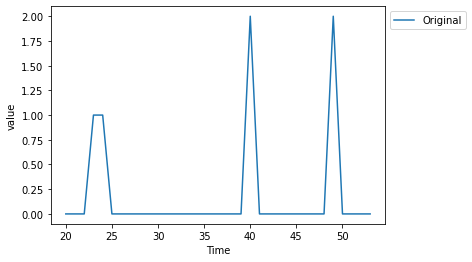

8230425


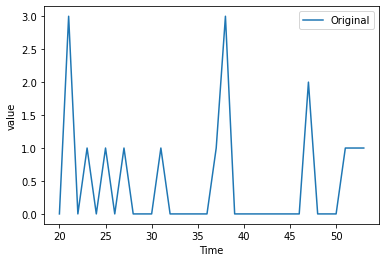

8230489


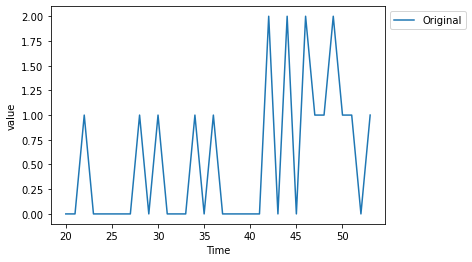

8230494


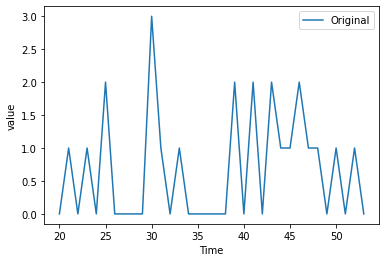

8240435


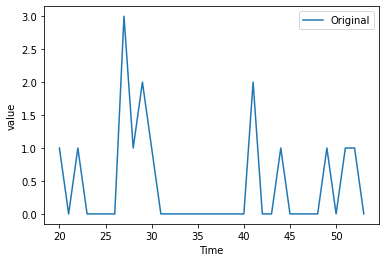

8240438


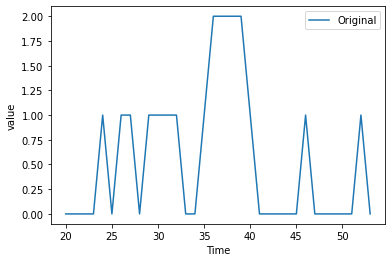

8240446


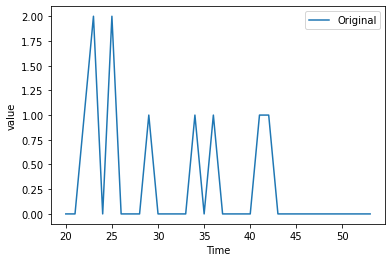

8240477


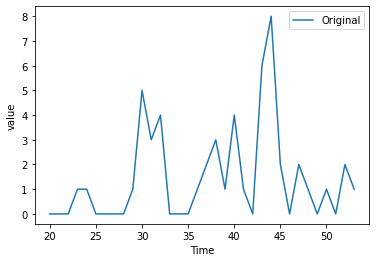

8240535


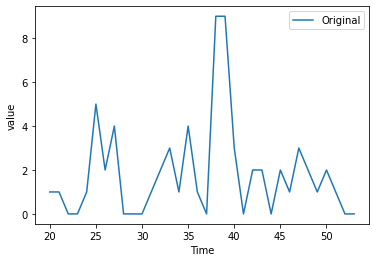

8240538


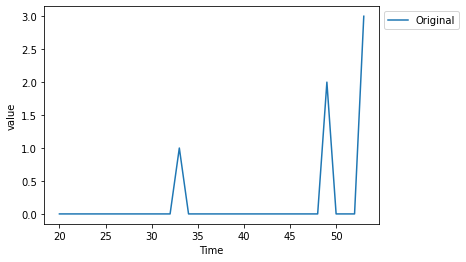

8260435


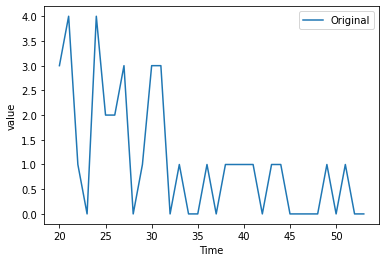

8260438A


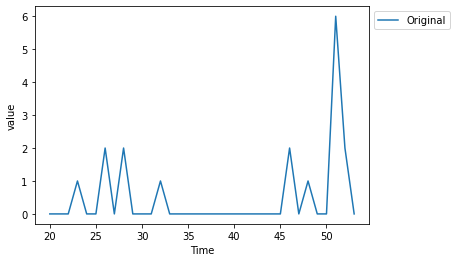

8260438B


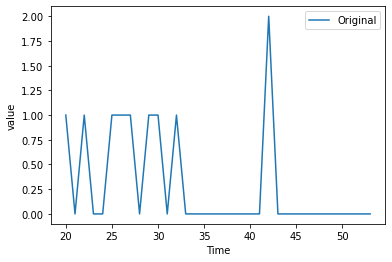

8390408


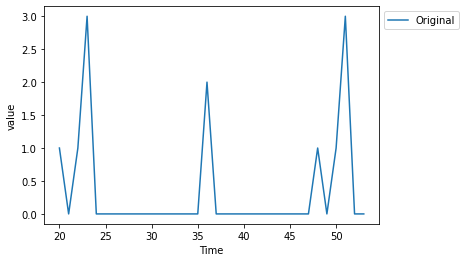

8390414


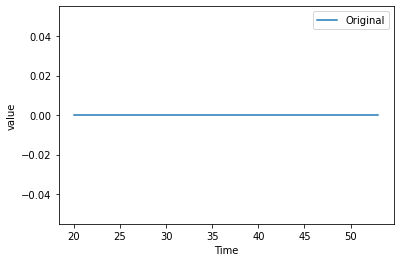

8390416


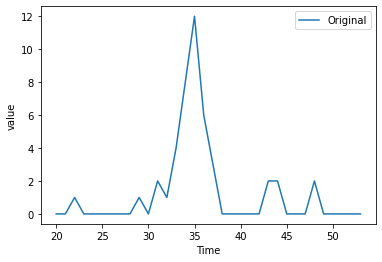

8390417


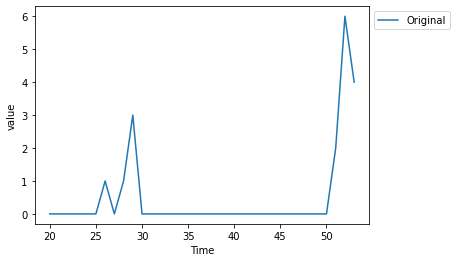

8390420


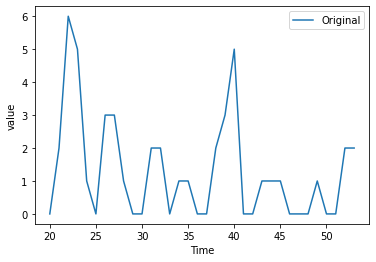

8390435


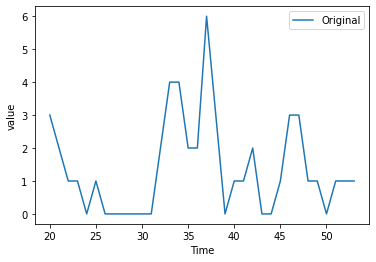

8390438


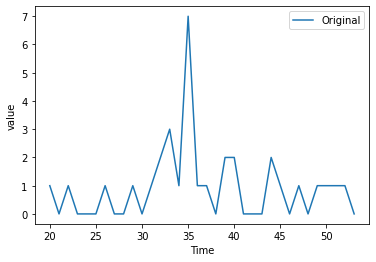

8390439


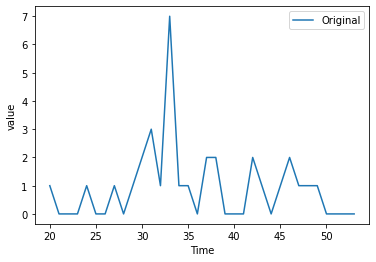

8390466


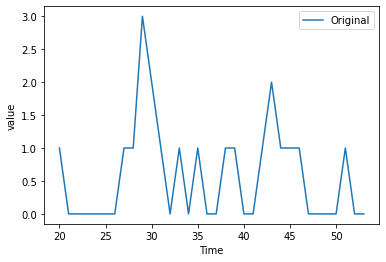

8390467


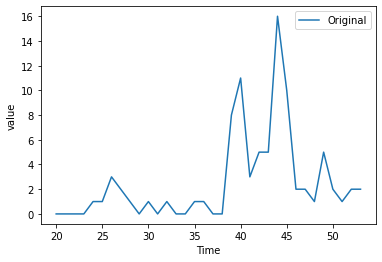

8390469


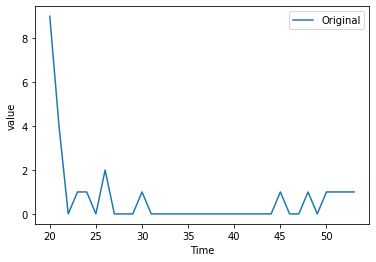

8390470


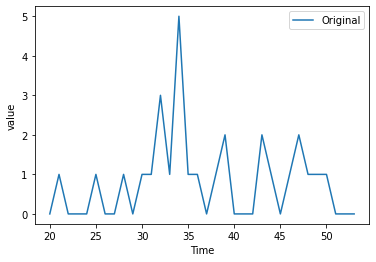

8390508


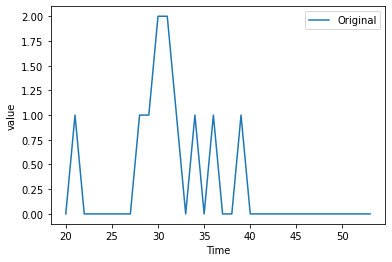

8390514


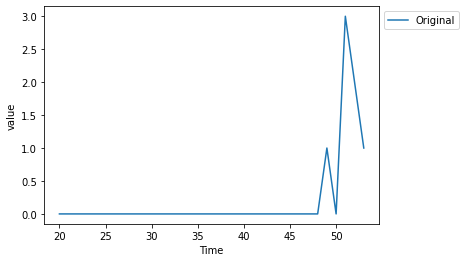

8390516


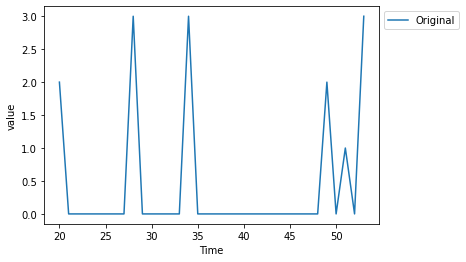

8390517


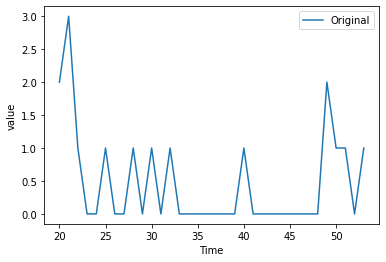

8390520


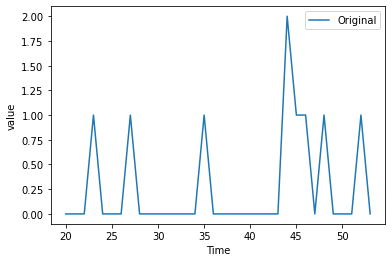

8390535


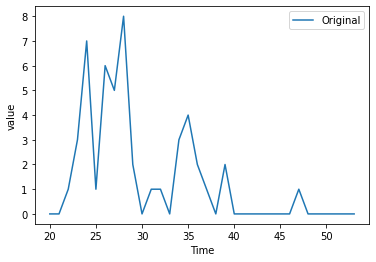

8390538


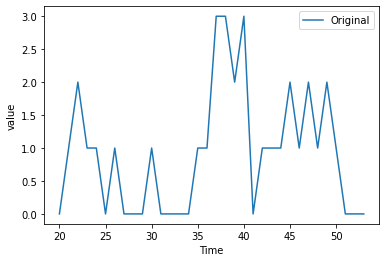

8390539


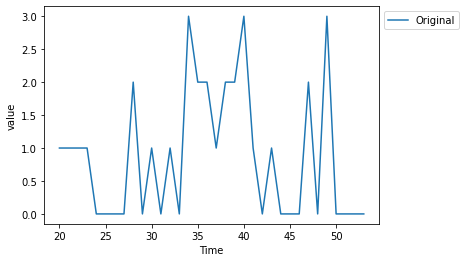

8390566


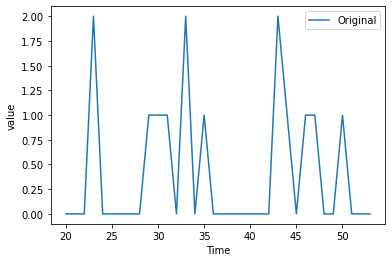

8390567


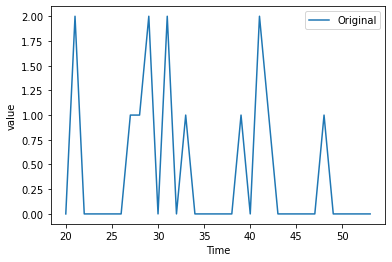

8390569


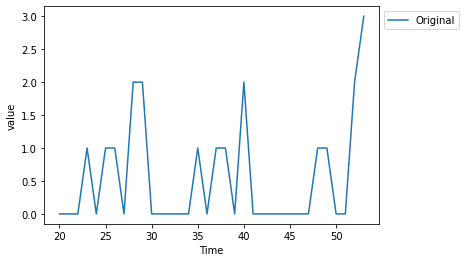

8390570


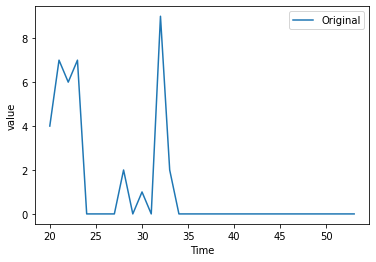

8500113


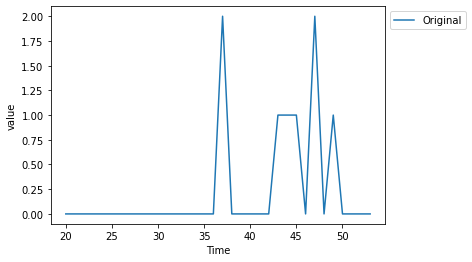

8500115


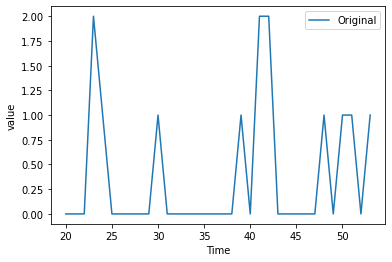

8500118


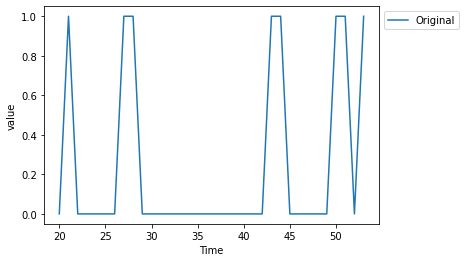

8530512


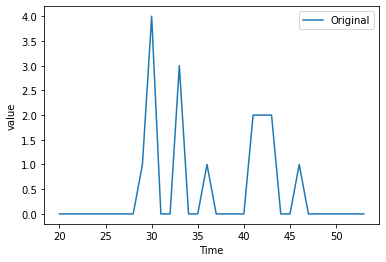

8530612


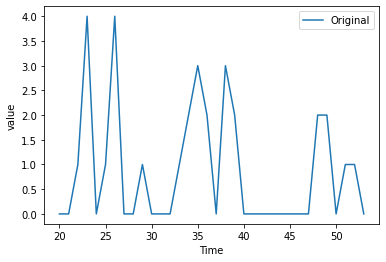

8540746


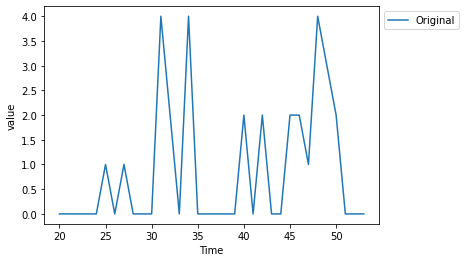

9650238


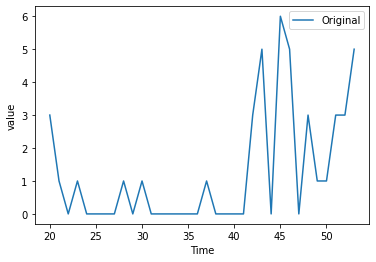

9760112


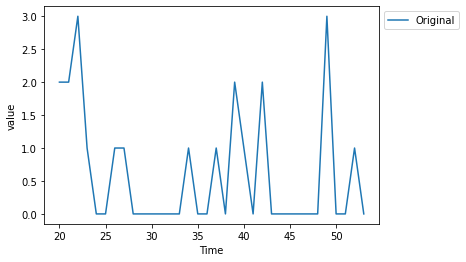

9760212


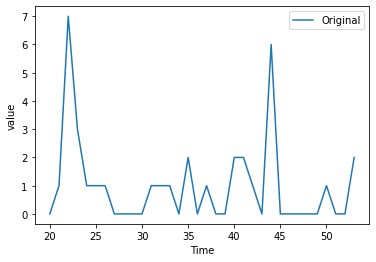

9770435


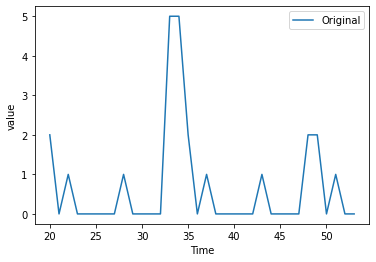

9770438


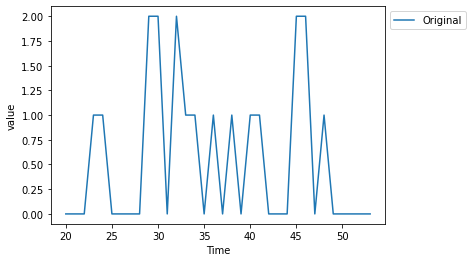

9770439


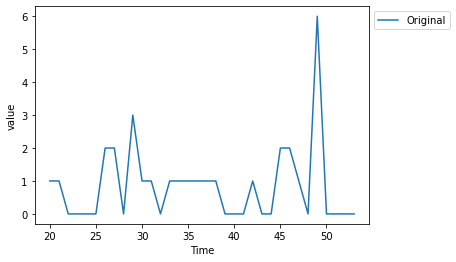

9770442


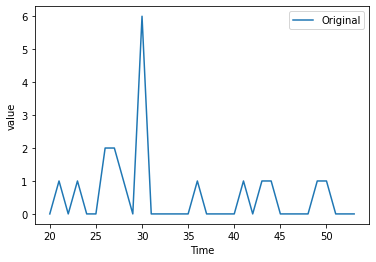

9831035


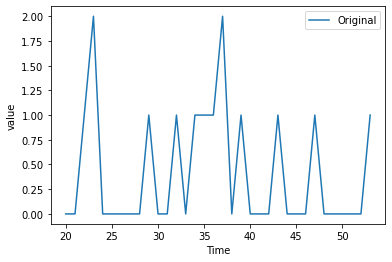

9831038


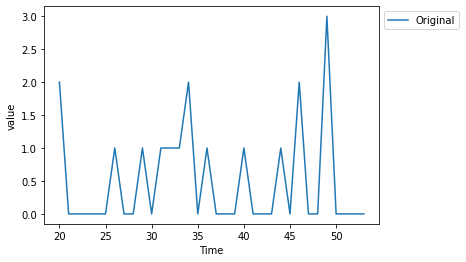

9831039


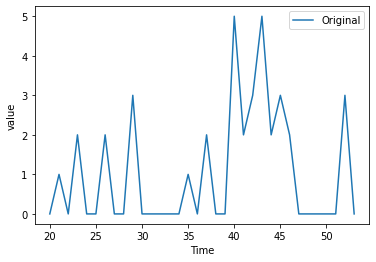

9831042


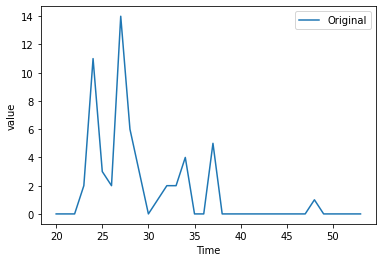

9860425


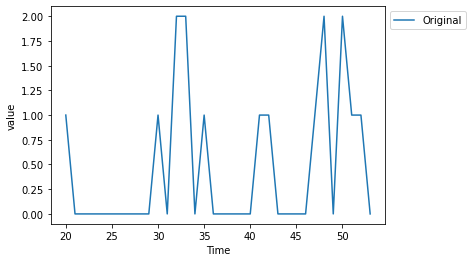

9860486


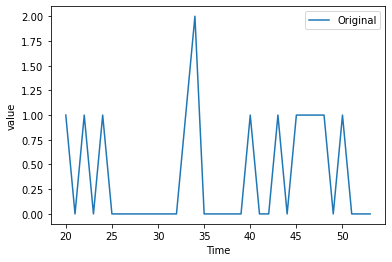

9860488


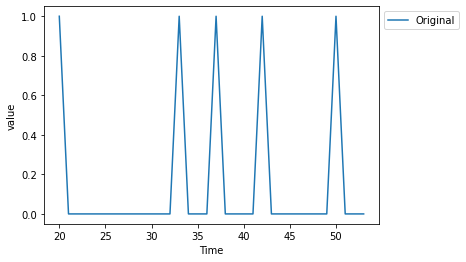

9860525


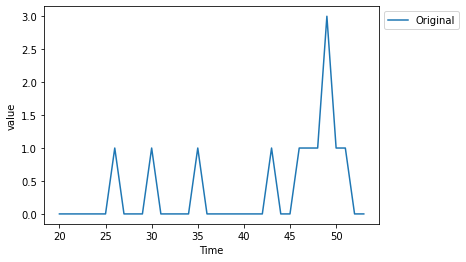

9860586


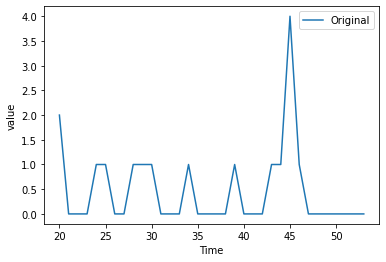

9860588


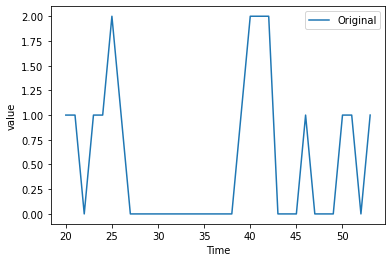

9860625


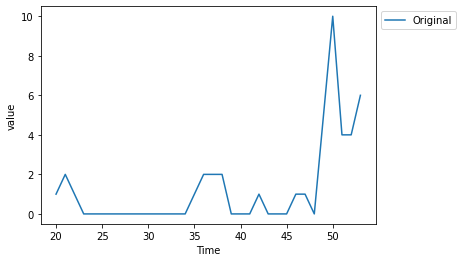

9860686


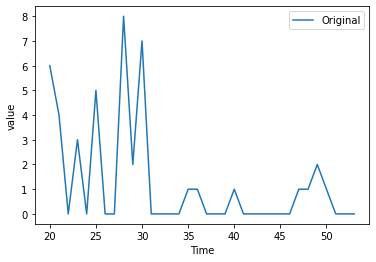

9860688


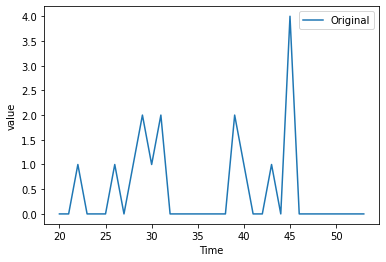

9870711


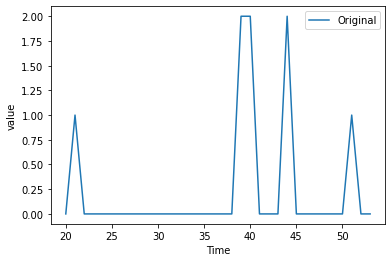

9870746


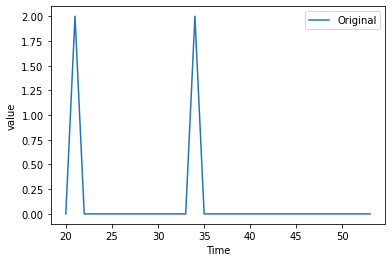

9870757


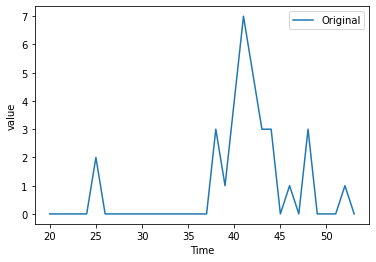

9870777


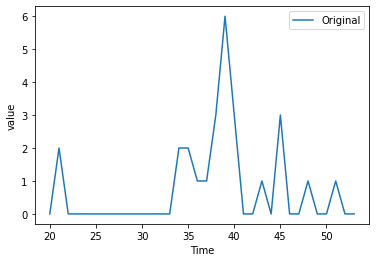

9890935


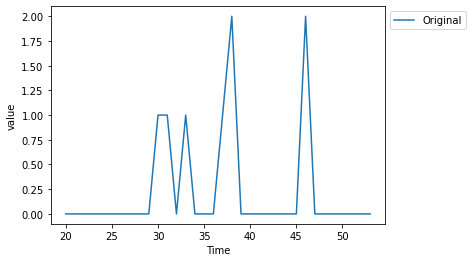

9890938


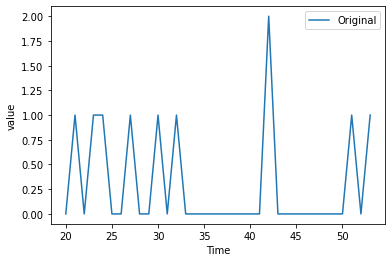

9890942


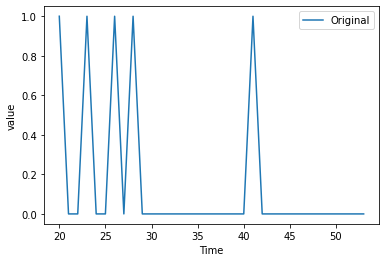

9900414


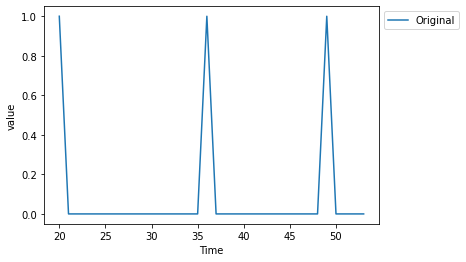

9900423


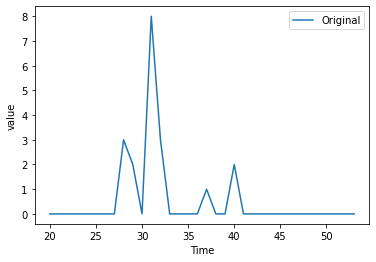

9900435


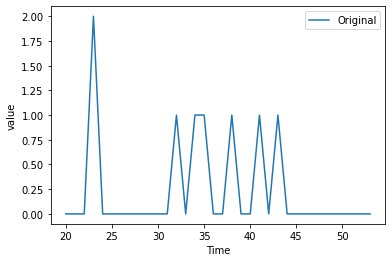

9900438


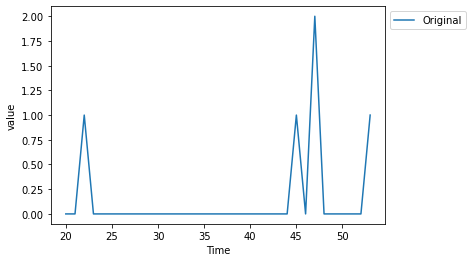

9900439


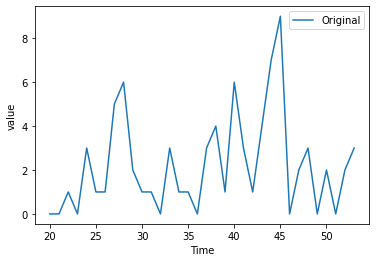

9910115


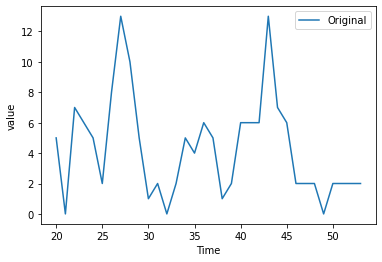

9910135


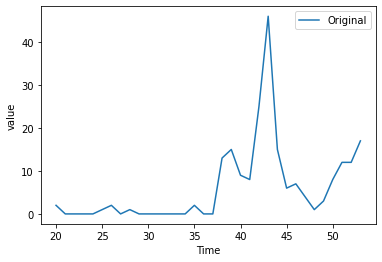

9910136


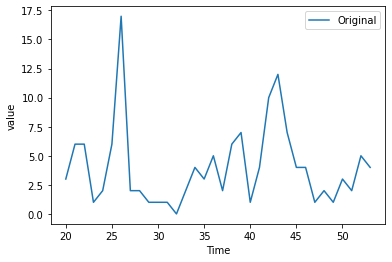

9910138


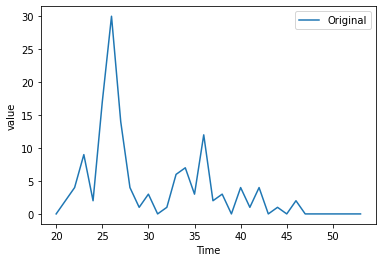

9910160


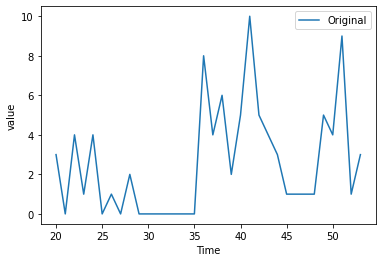

A1000042T


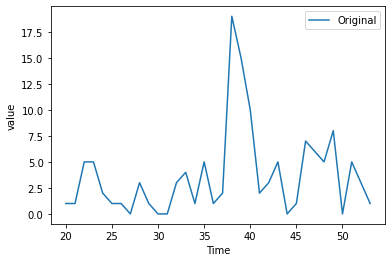

A1000226P


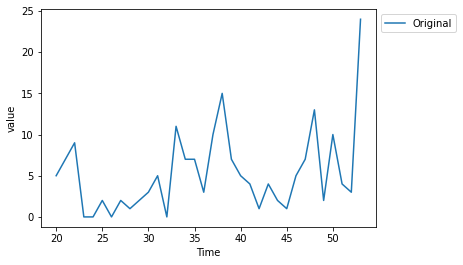

A1000324


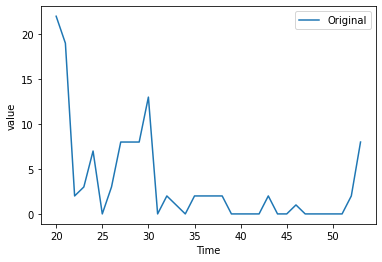

A1000356P


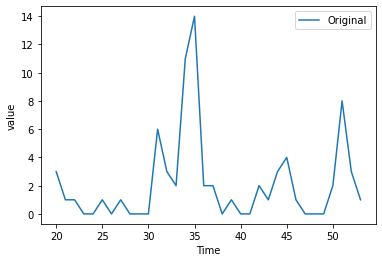

A1000388


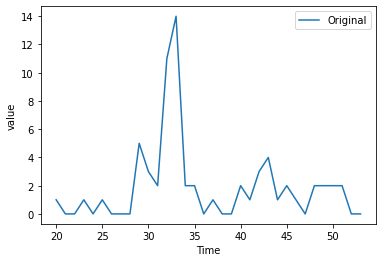

A1000390


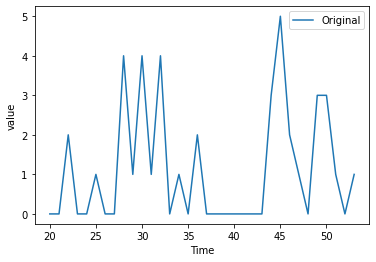

A1000420


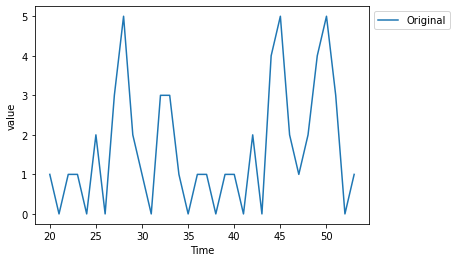

A1000422


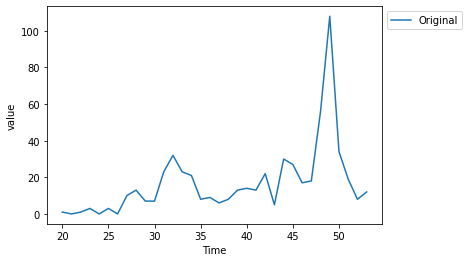

A1000445


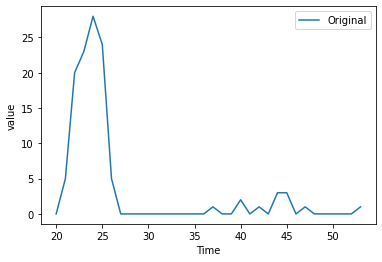

A1000454P


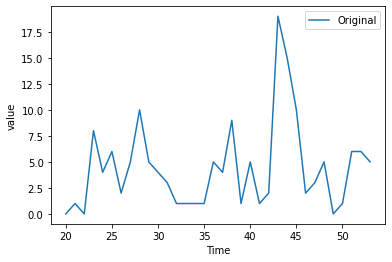

A1000474


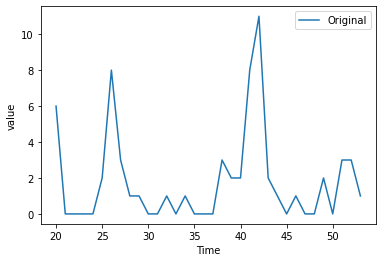

A1000479P


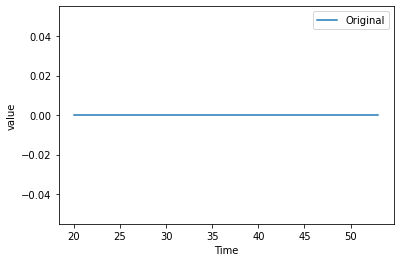

A1000480P


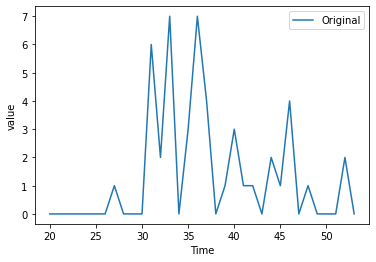

A1000485P


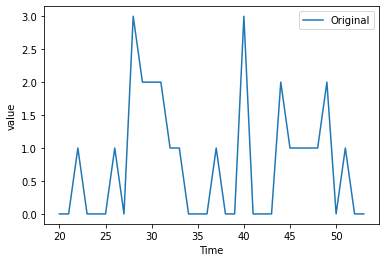

A1000486T


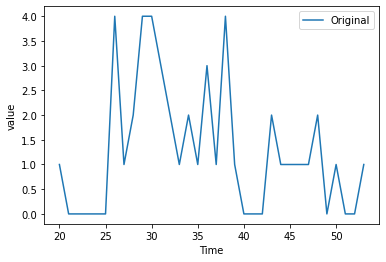

A1000531


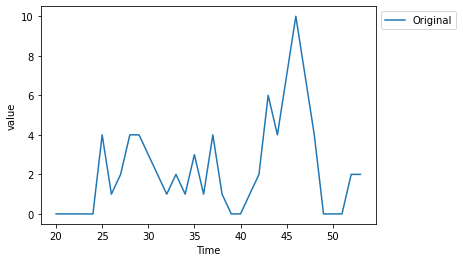

A1000540P


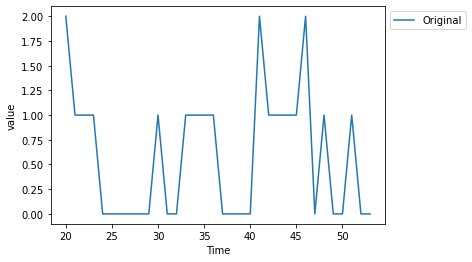

A1000550


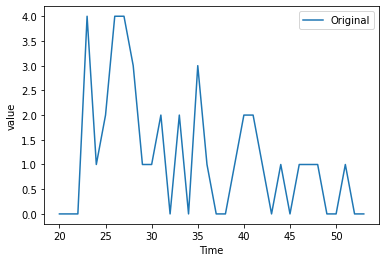

A1000552T


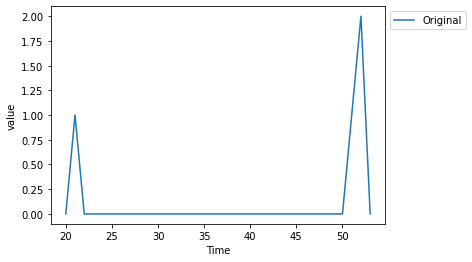

A1000554P


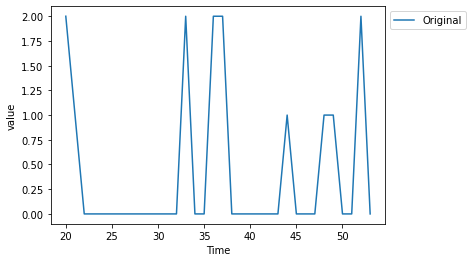

A1000558


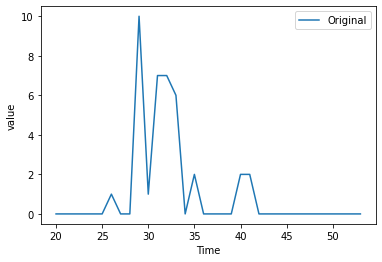

A1000560P


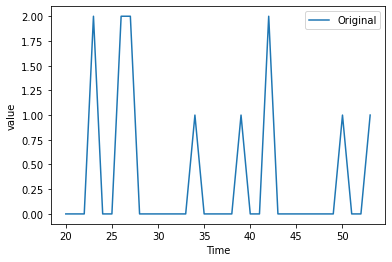

A1000573P


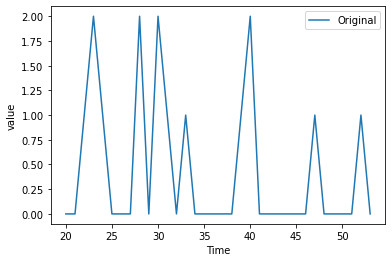

A1000586T


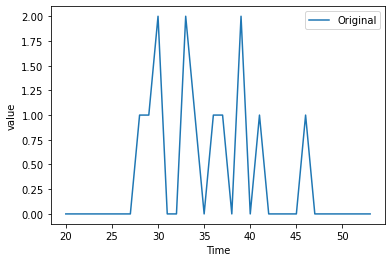

A1000592P


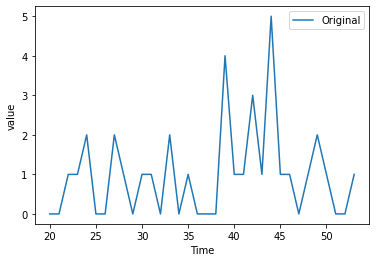

A1000607T


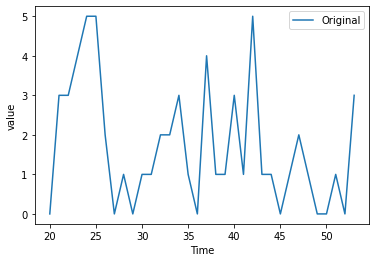

A1000608T


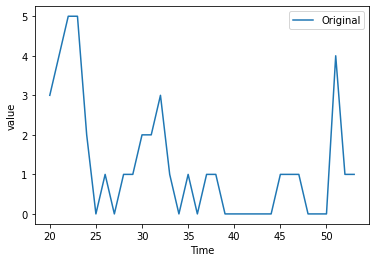

A1000614T


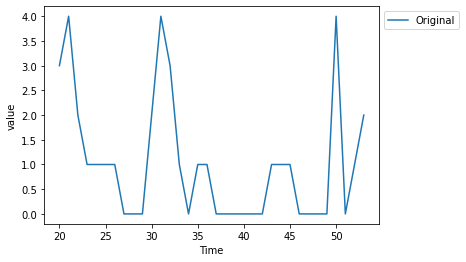

A1000616T


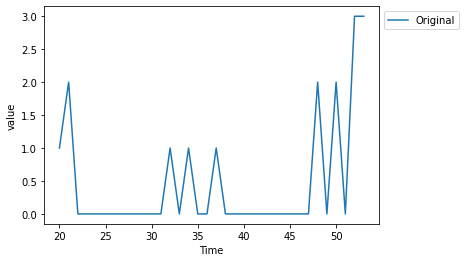

A1000674


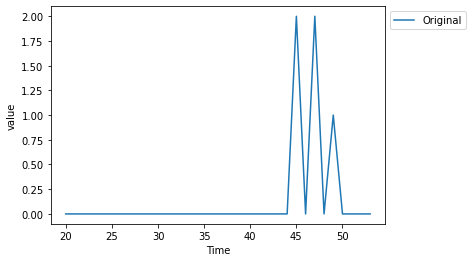

A1000675


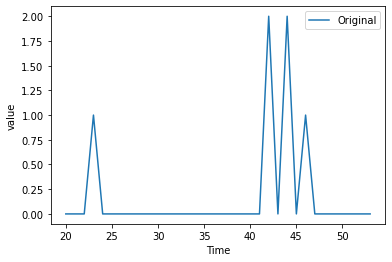

A1000737T


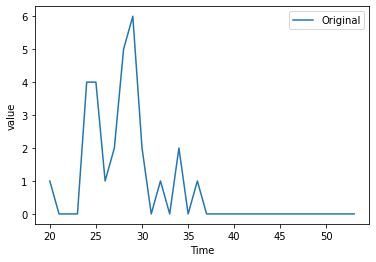

A1000738T


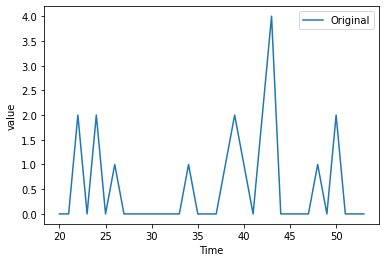

A1000740T


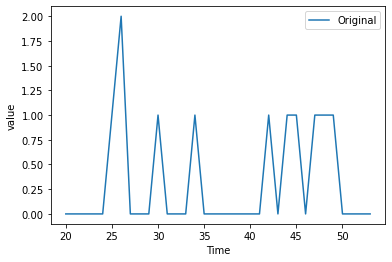

A1000753T


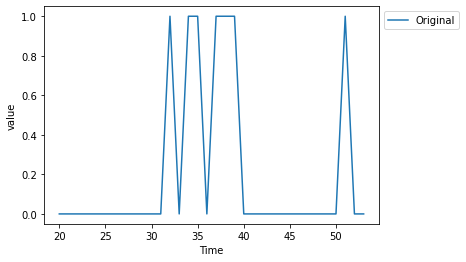

A1000757T


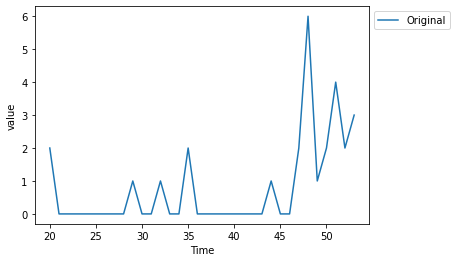

A1000768T


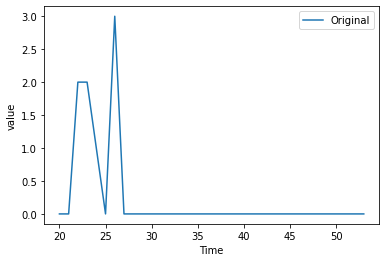

A1000769T


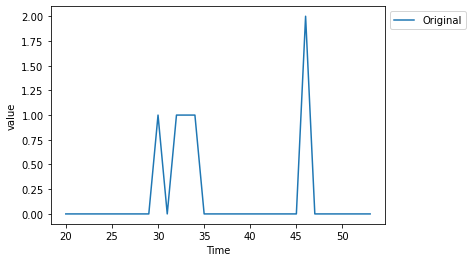

A1000796P


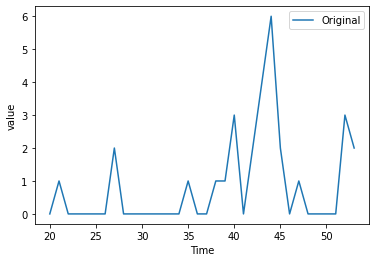

A1000797


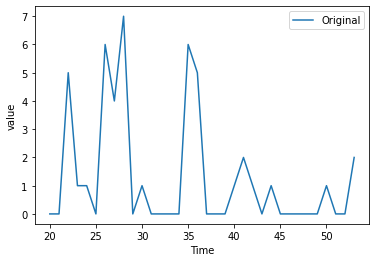

A1000798


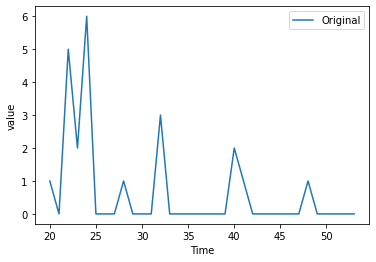

A1000804P


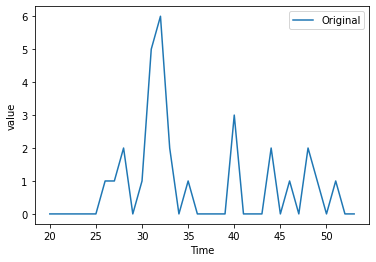

A1000806P


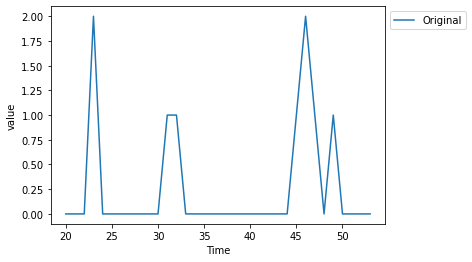

A1000807P


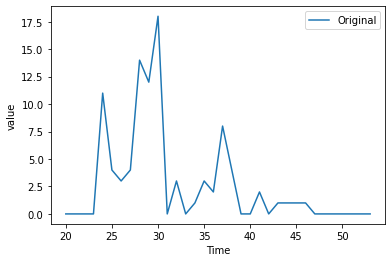

A1000808P


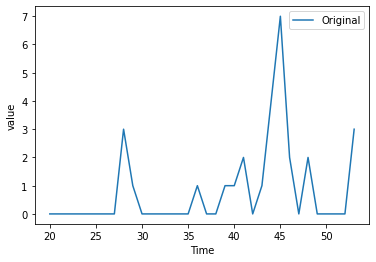

A1000809


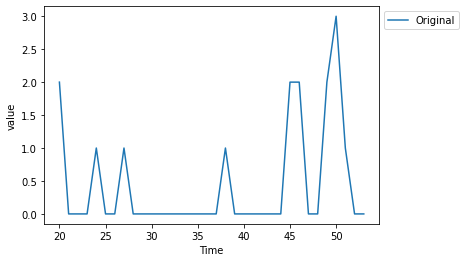

A1000810


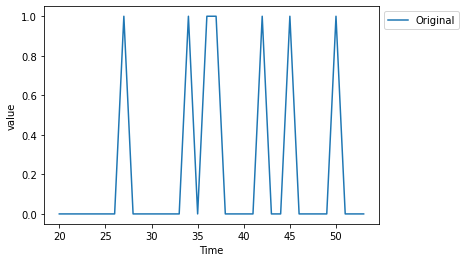

A1000812P


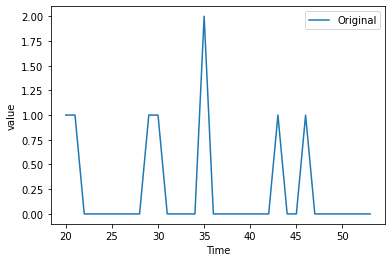

A1000816P


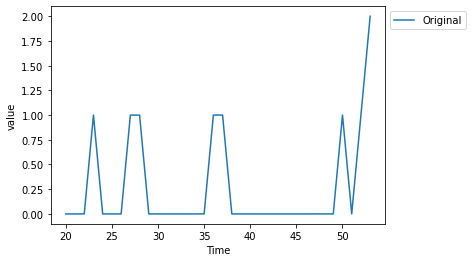

A1000819P


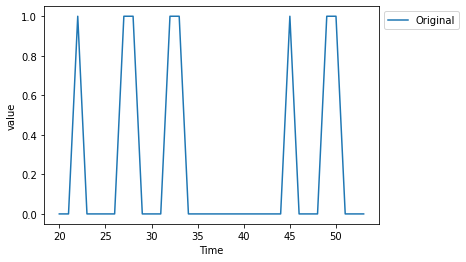

A1000824


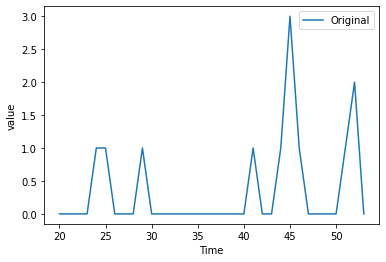

A1000826


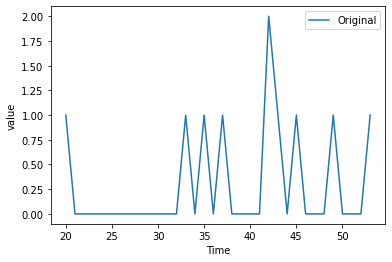

A1000830


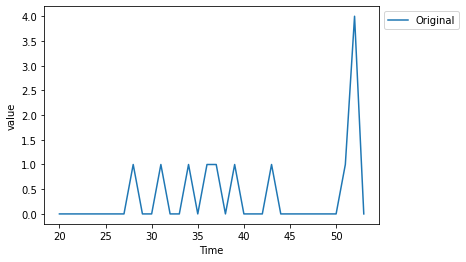

A1000831


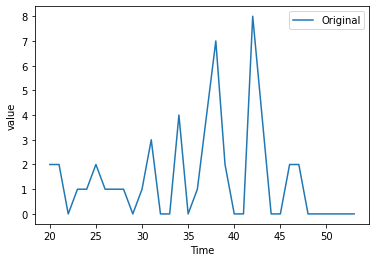

A1000836P


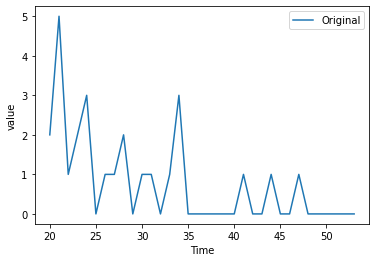

A1000837P


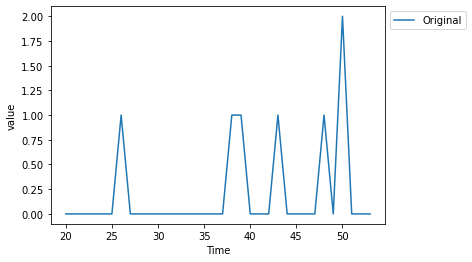

A1000838P


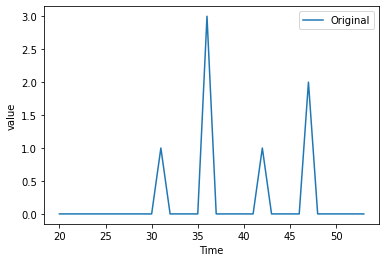

A1000839P


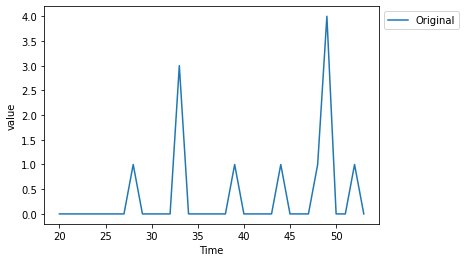

A1000841P


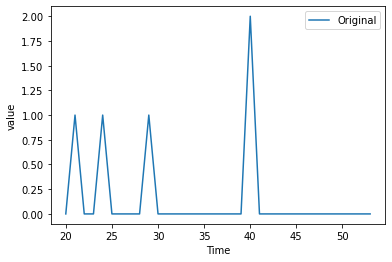

A1000855P


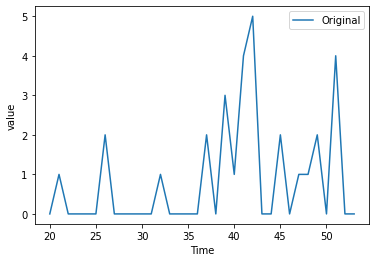

A1000856T


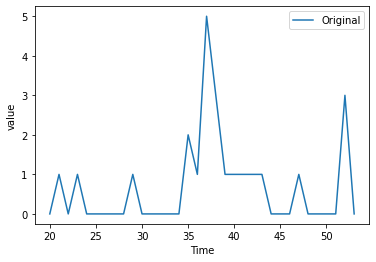

A1000861P


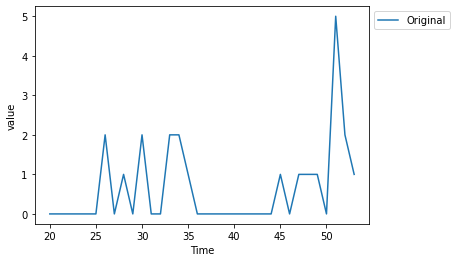

A1000869P


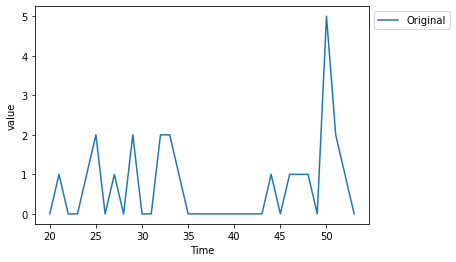

A1000873P


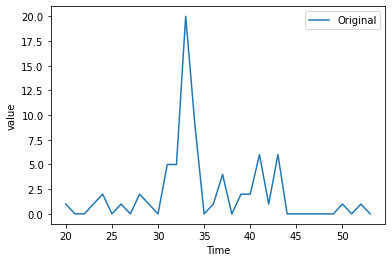

A1000875P


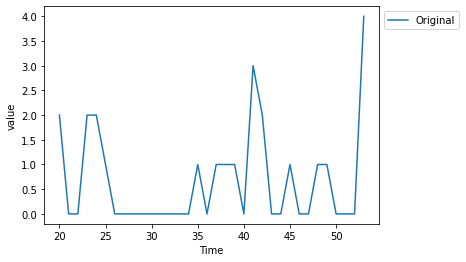

A1000880P


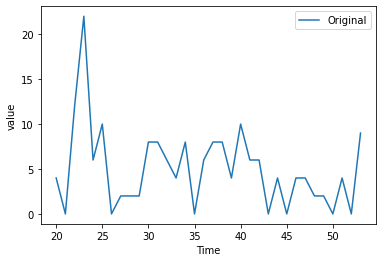

A1000881P


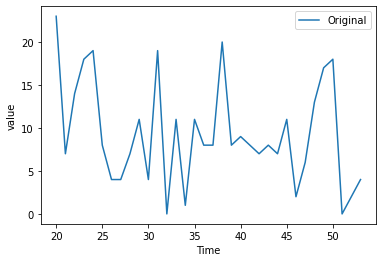

A1000886P


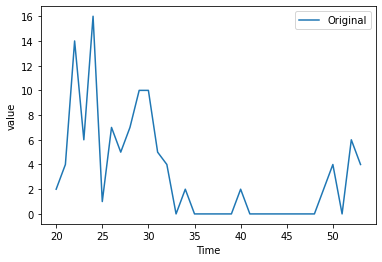

A1000888P


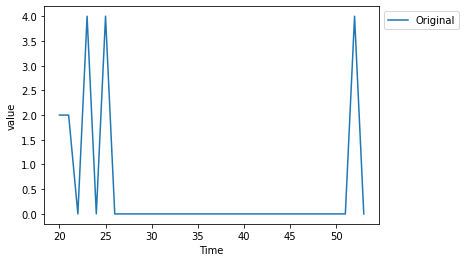

A1000890P


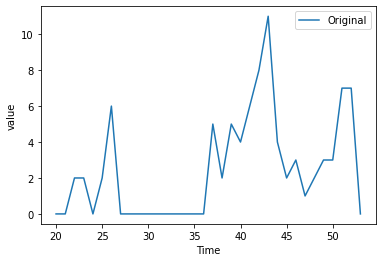

A1000900P


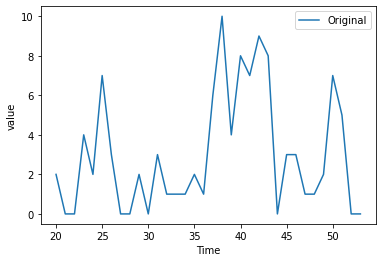

A1000901P


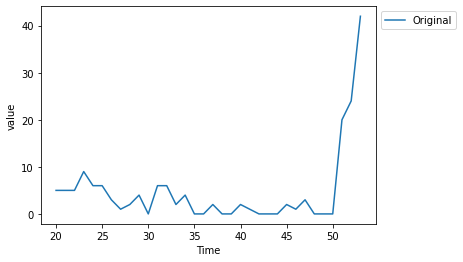

A1000907


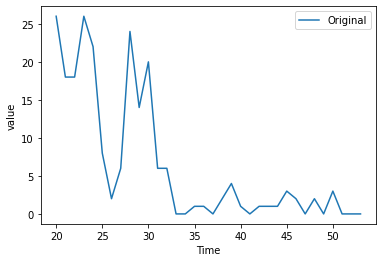

A1000908


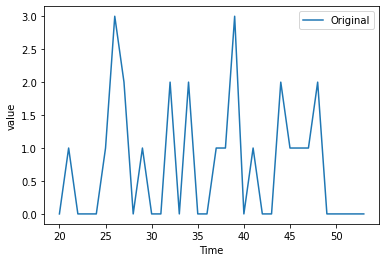

A1000924P


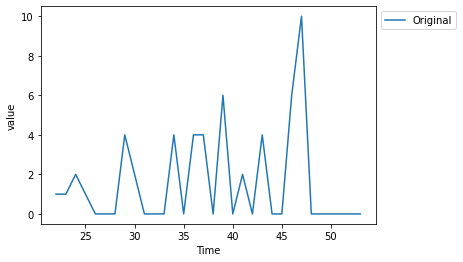

A1000934P


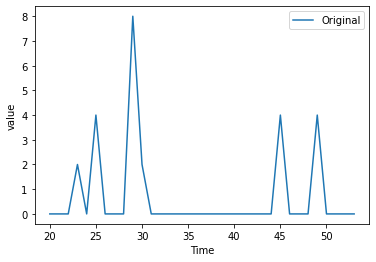

A1000943P


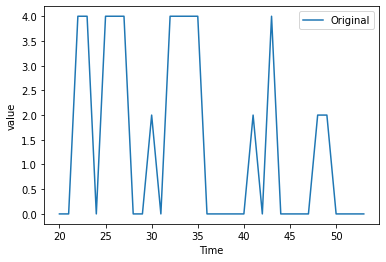

A1000952P


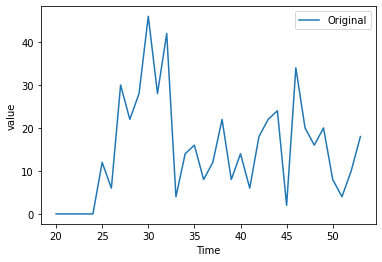

A1000953P


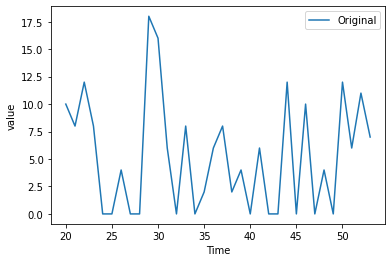

A1000970P


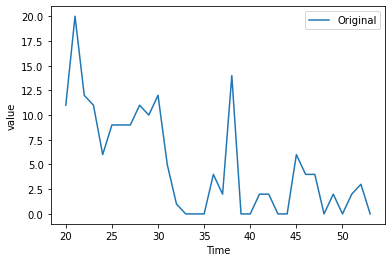

A1000978P


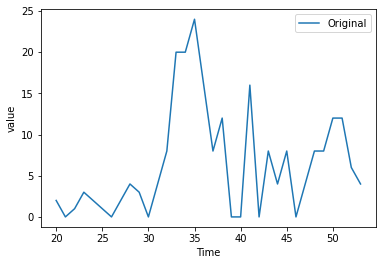

A1000980


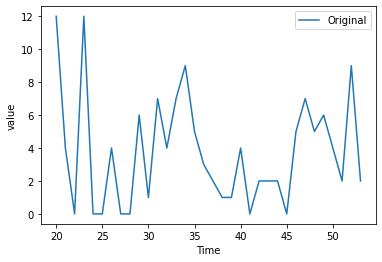

A1000984P


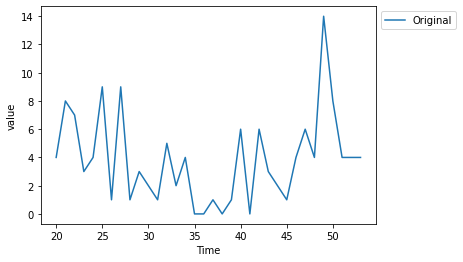

A1000986P


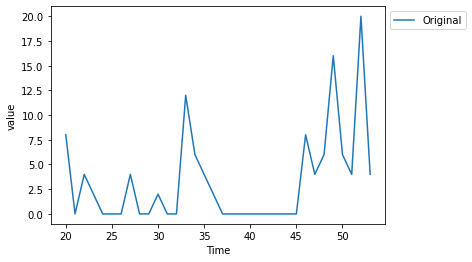

A1000988P


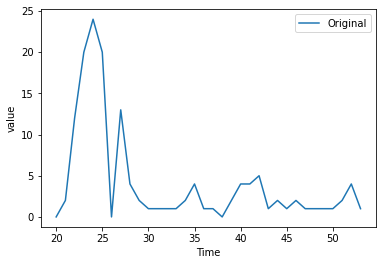

A1000990P


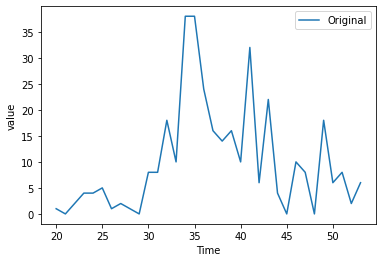

A2000094


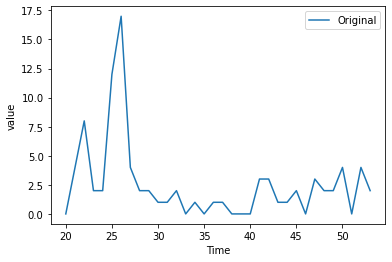

A2000095


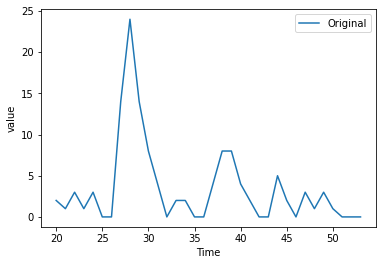

A2000097


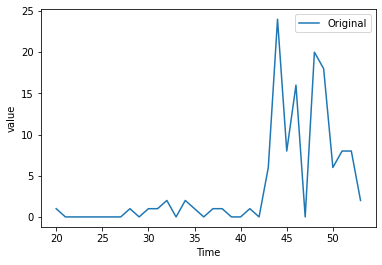

A2000108


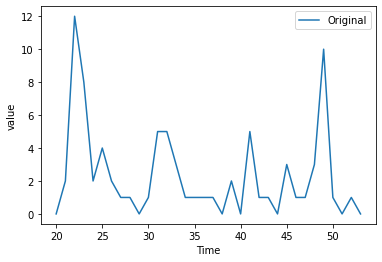

A2000109


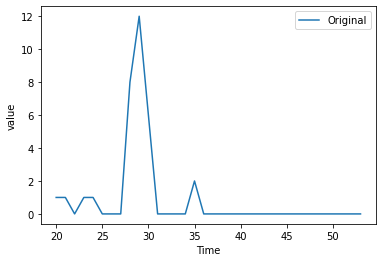

A2000110


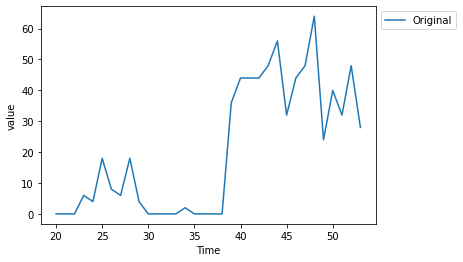

A2000125


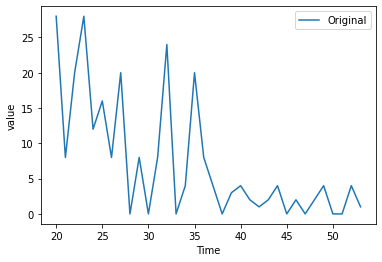

A2000127


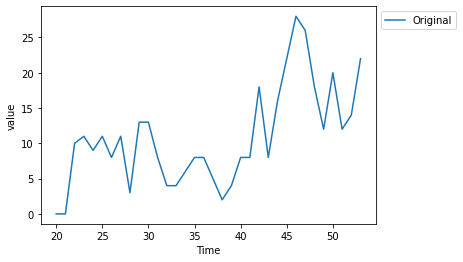

A2000130


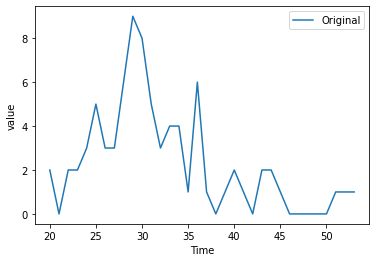

A2000132


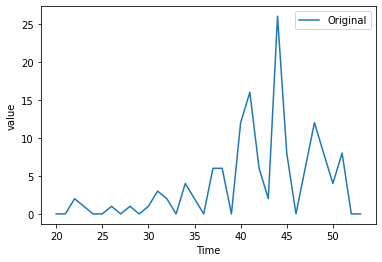

A2000133


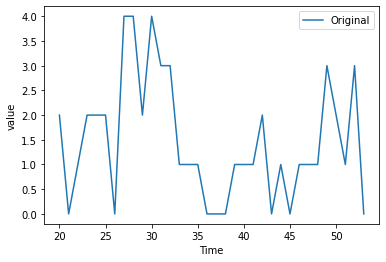

A2000134


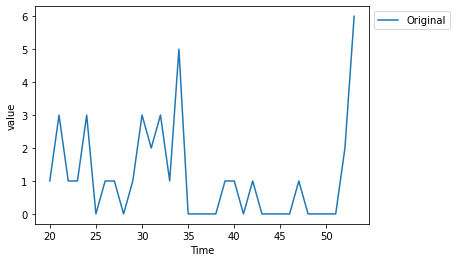

A2000135


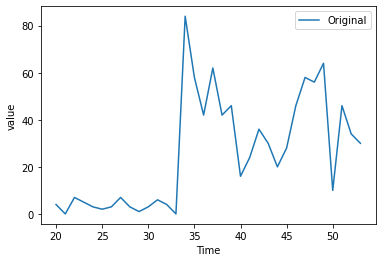

A2000136


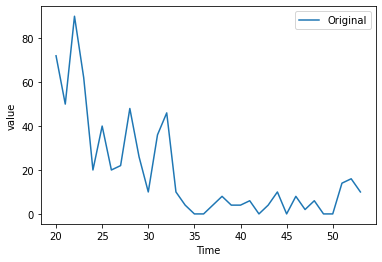

A2000137


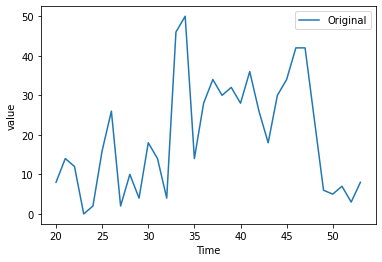

A2000210


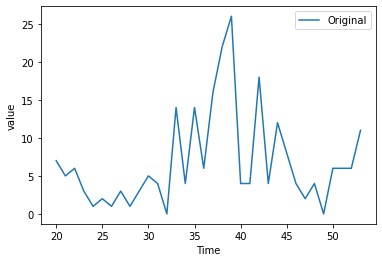

A2000223


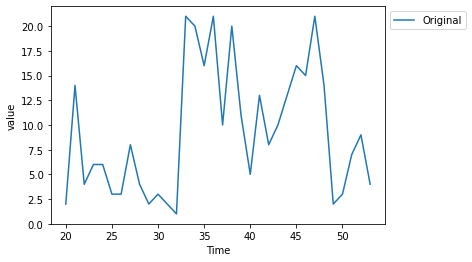

A2000246


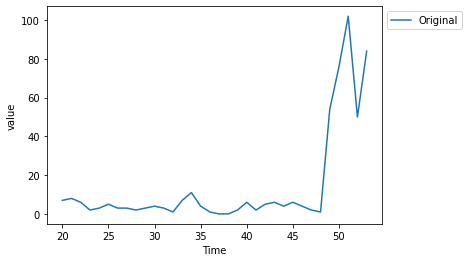

A2000249


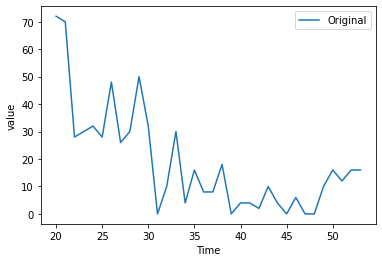

A2000254


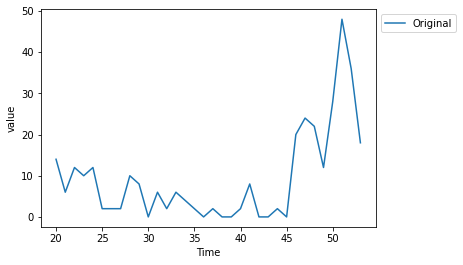

A2000255


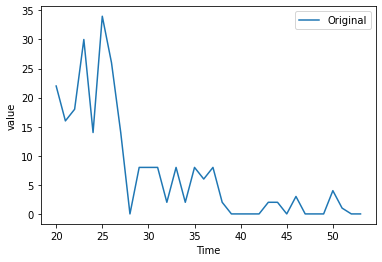

A2000256


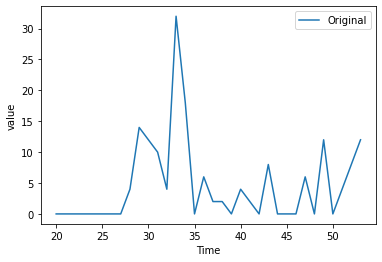

A2000296


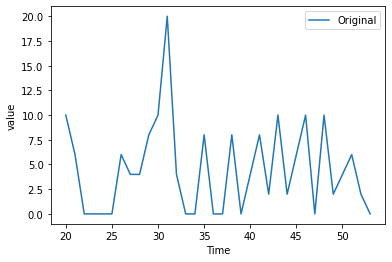

A2000314


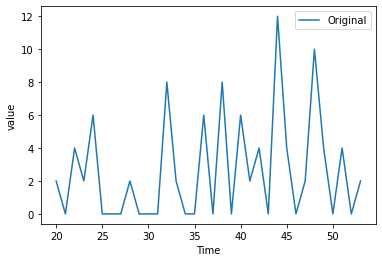

A2000315


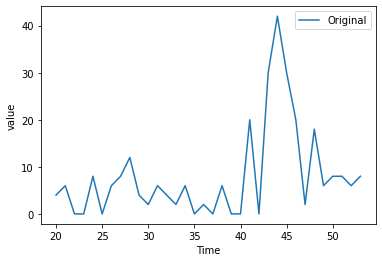

A2000317


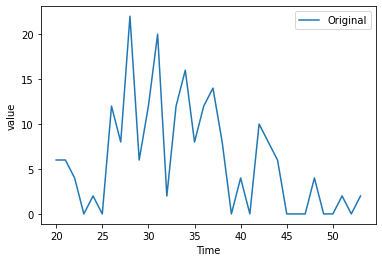

A2000322


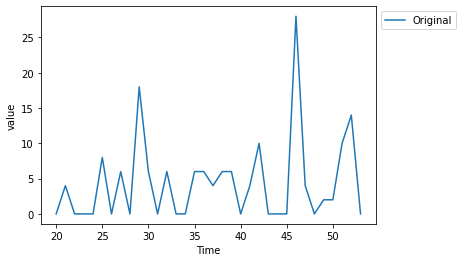

A2000323


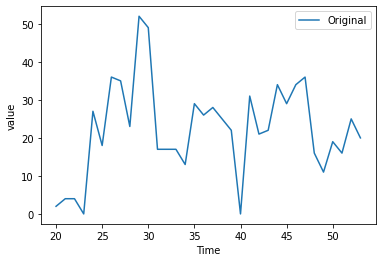

A2000329


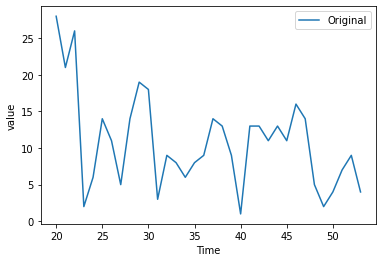

A2000345


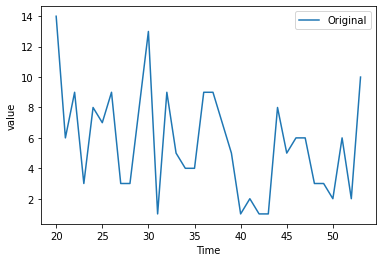

A2000346


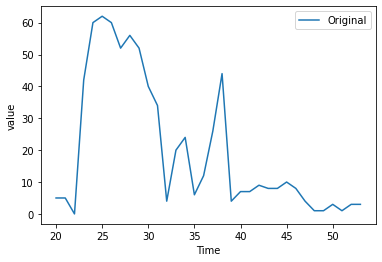

A2000348V


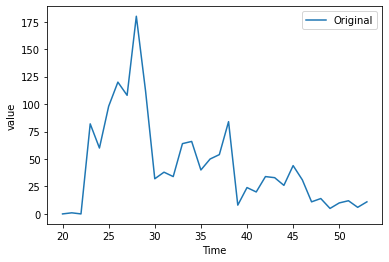

A2000352


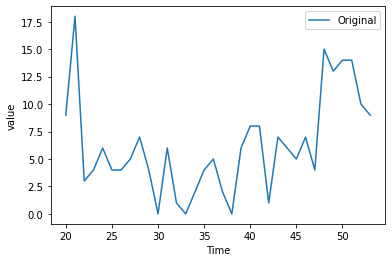

A2000354


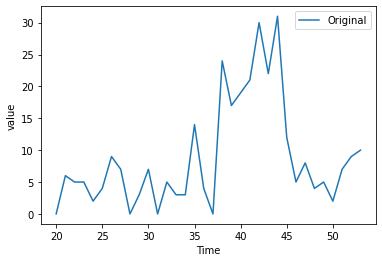

A2000355


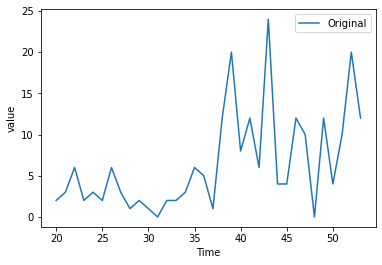

A2000362


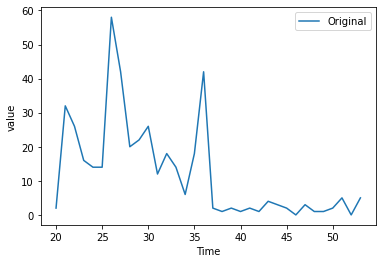

A2000364


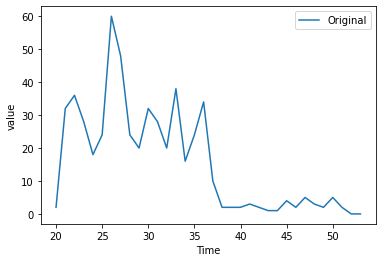

A2000366


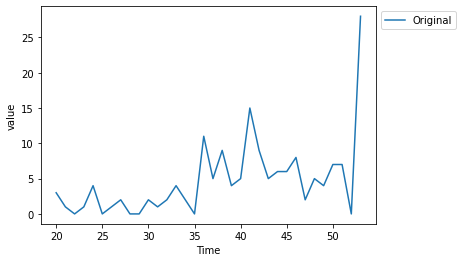

A2000368


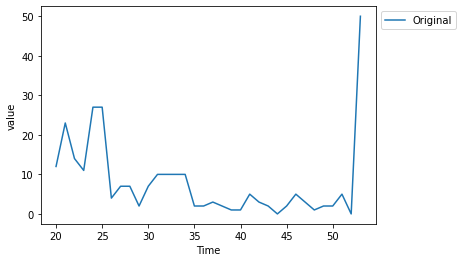

A2000370


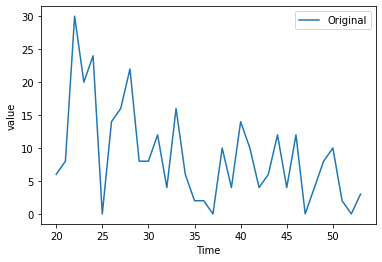

A2000373


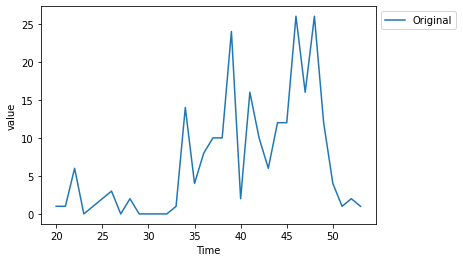

A2000378


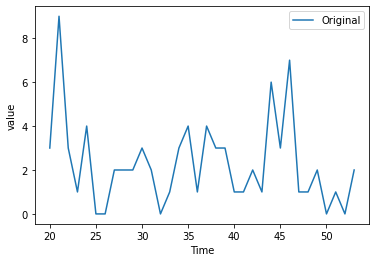

A2000381


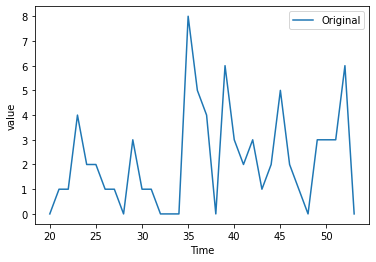

A2000388


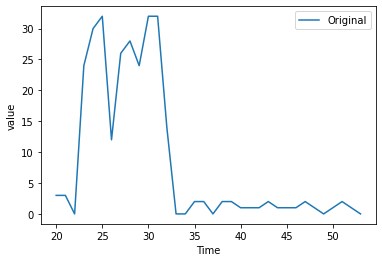

A2000391


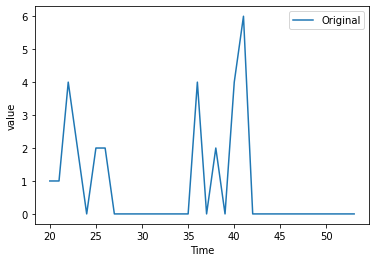

A2000392


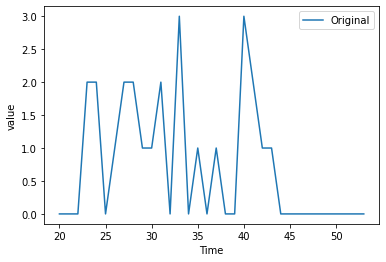

A2000398


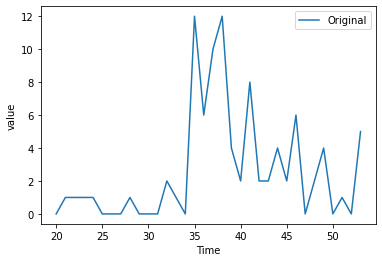

A2000400


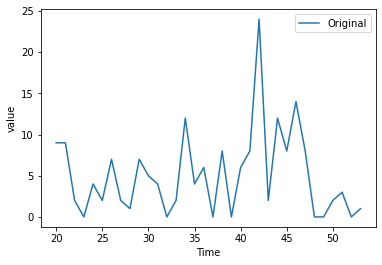

A2000405


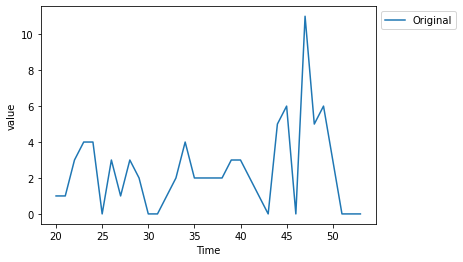

A2000406


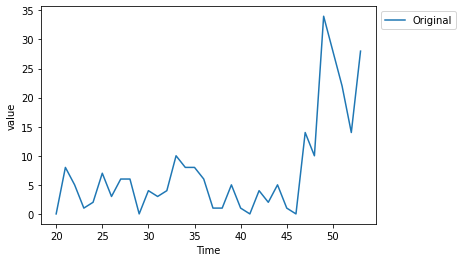

A2000407


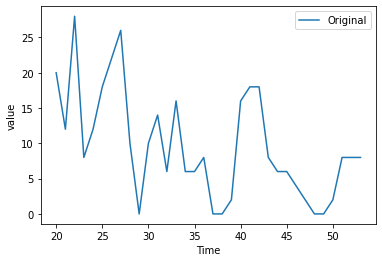

A2000410


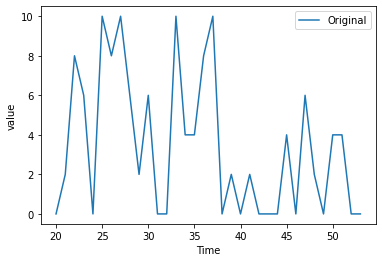

A2000411


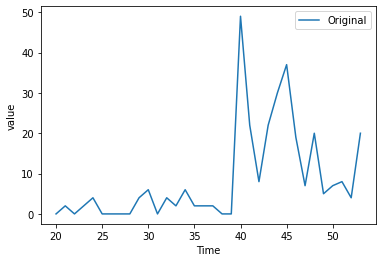

A2000412


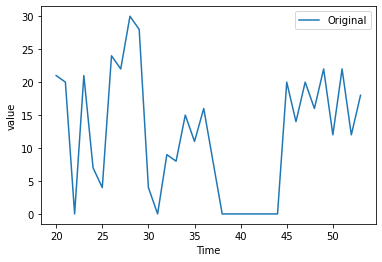

A2000413


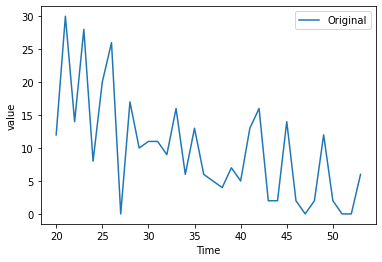

A2000414


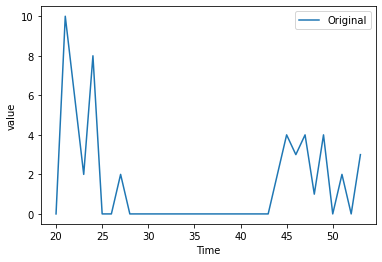

A2000415


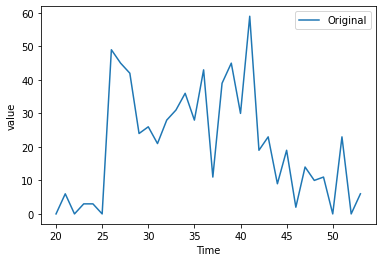

A2000416


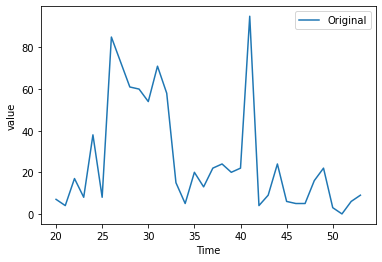

A2000417


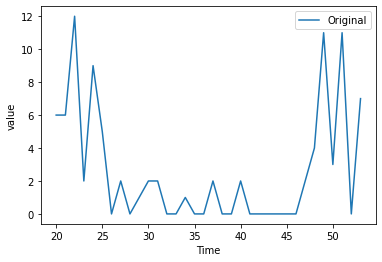

A2000424


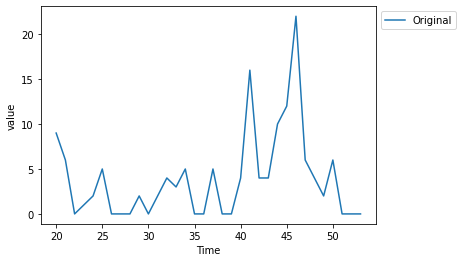

A2000434


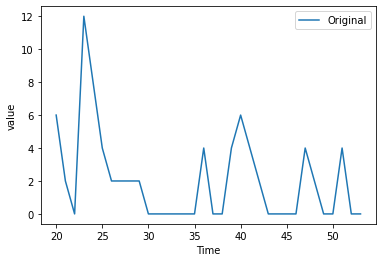

A2000435


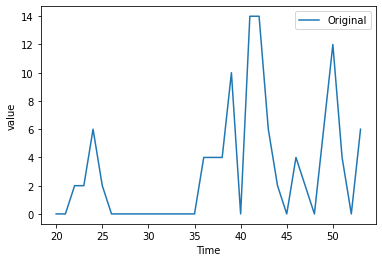

A2000436


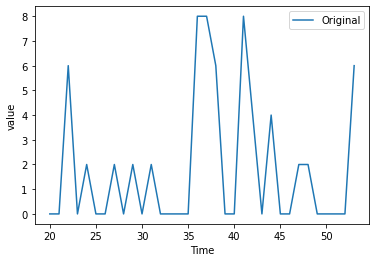

A2000438


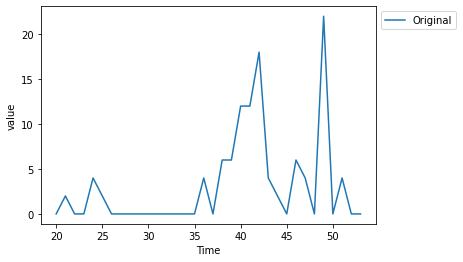

A2000442


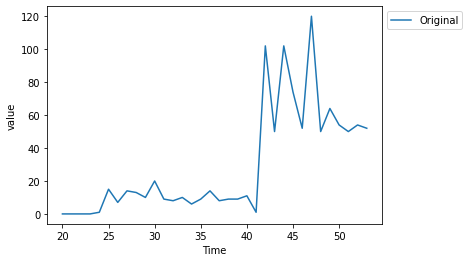

A2000443


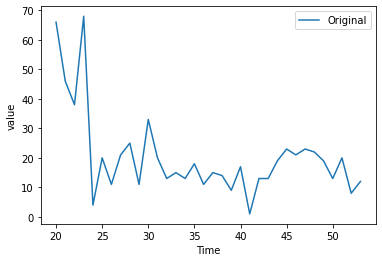

A2000445


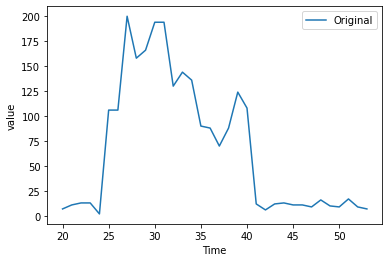

A2000446


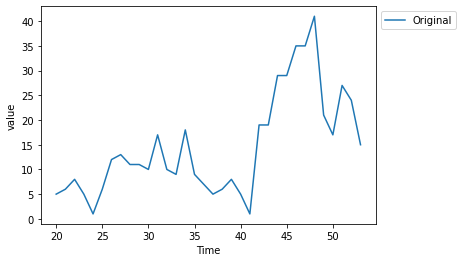

A2000456


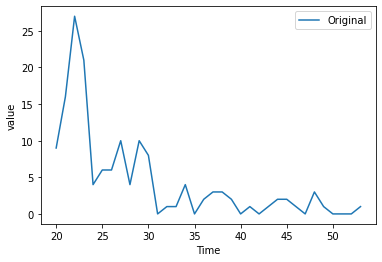

A2000460


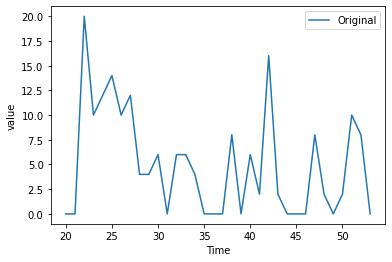

A2000463


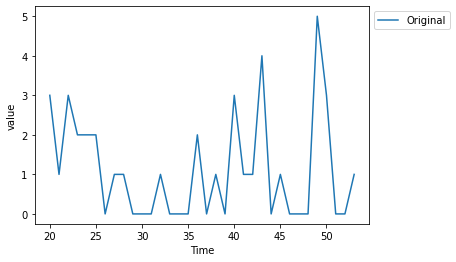

A2C00052


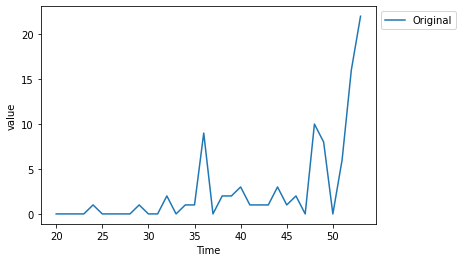

A2C00054


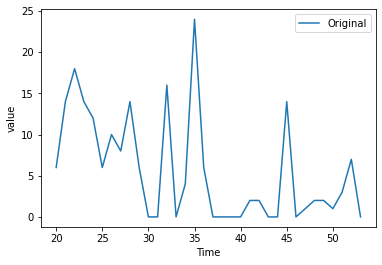

A2C00088


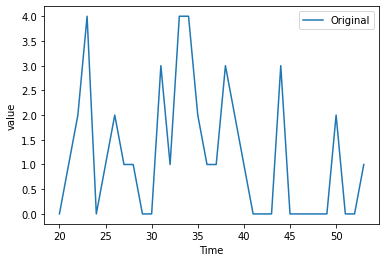

A2C00117


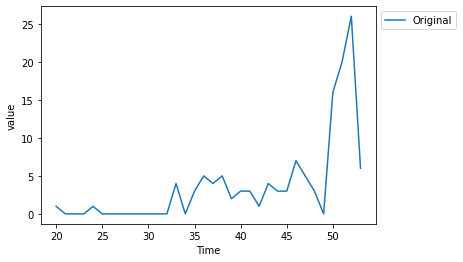

A2C00125


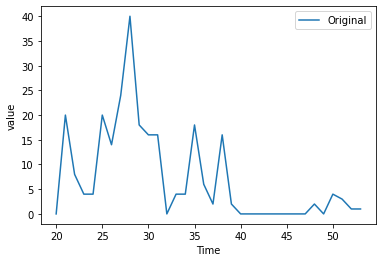

A2C00130


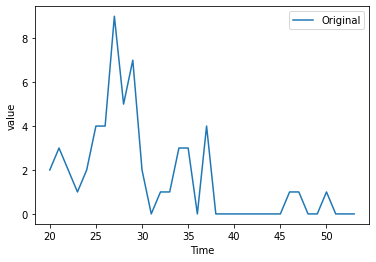

A3000002


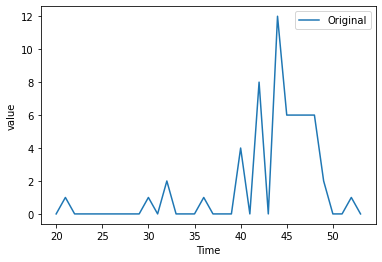

A3000003


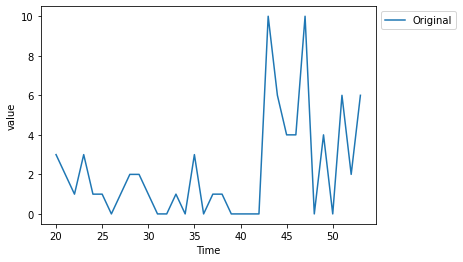

A3000006


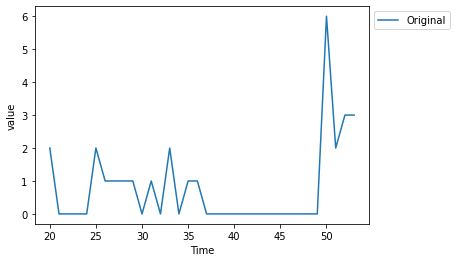

A3000008


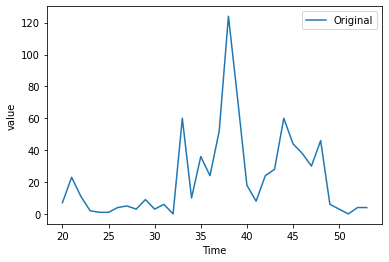

A3000012


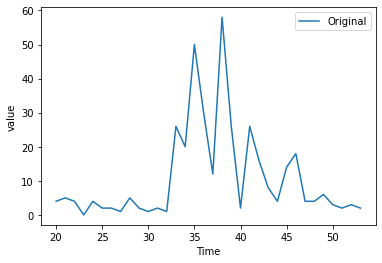

A3000013


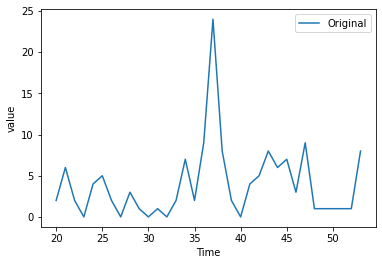

A3000014


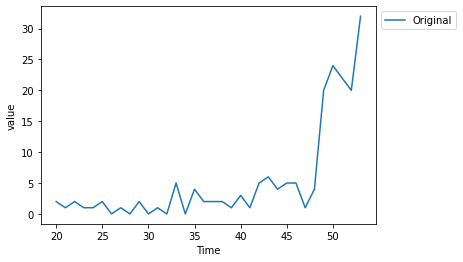

A3000029


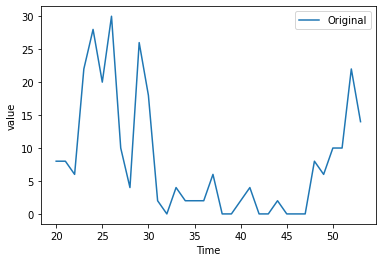

A3000030


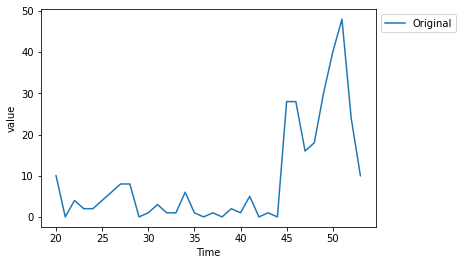

A3000031


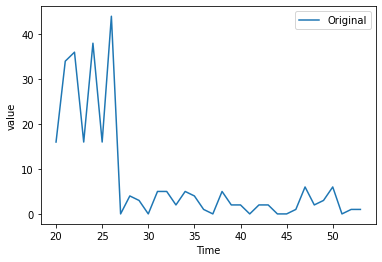

A3000040


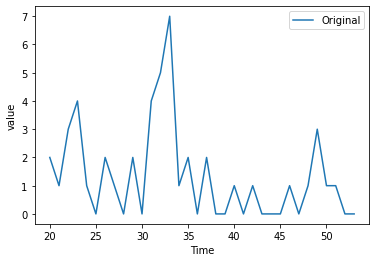

A3000044


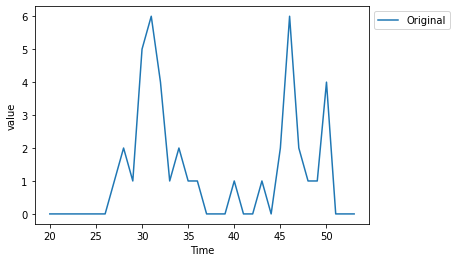

A3000045


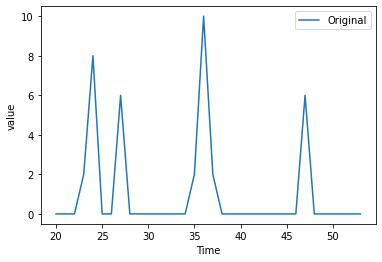

A3000051


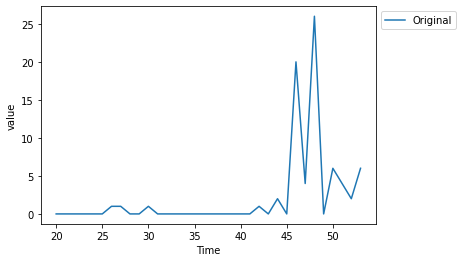

A3000052


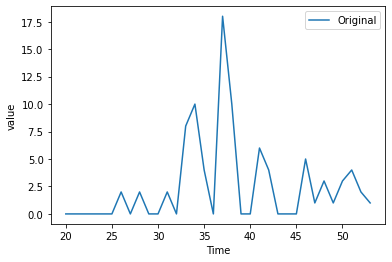

A3000053


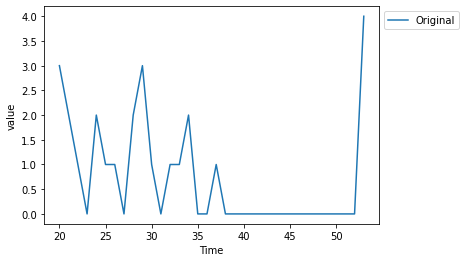

A3000054


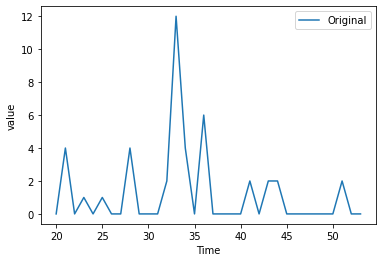

A3000063


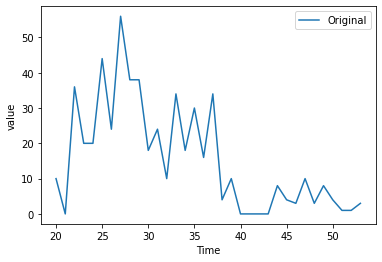

A3000064


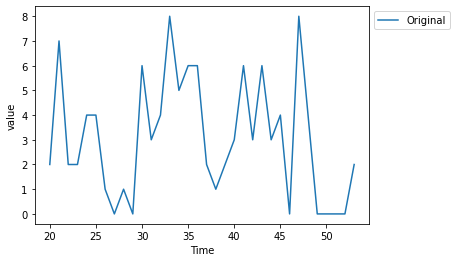

A3000066


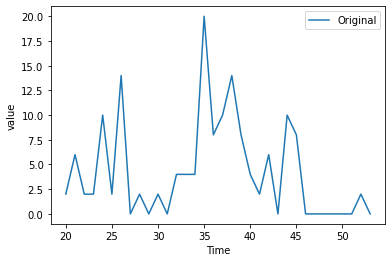

A3000069


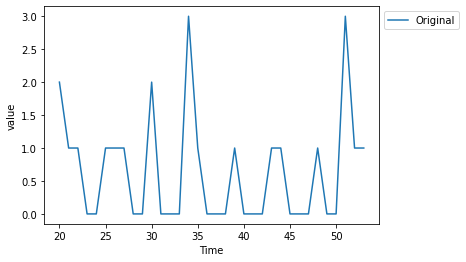

A3000074


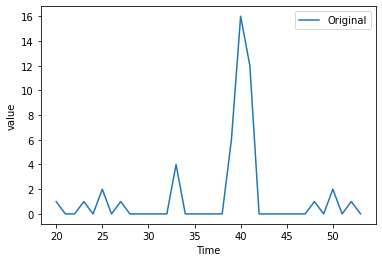

A3000075


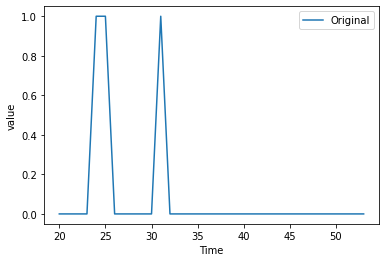

A3000077


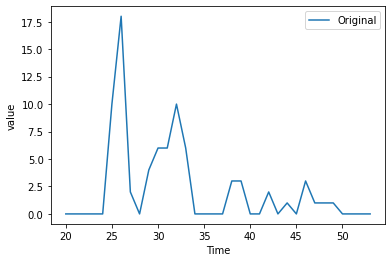

A3000079


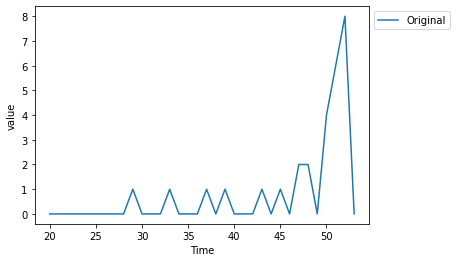

A3000081


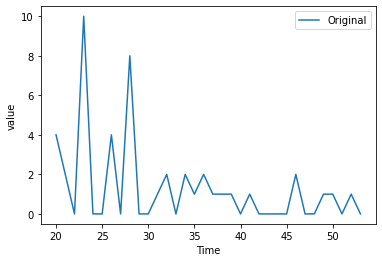

A3000109


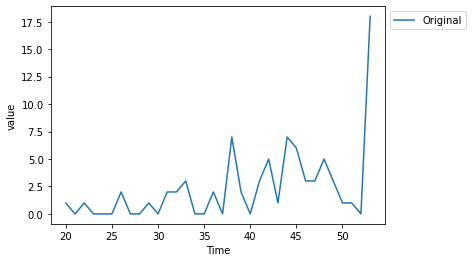

A3000111


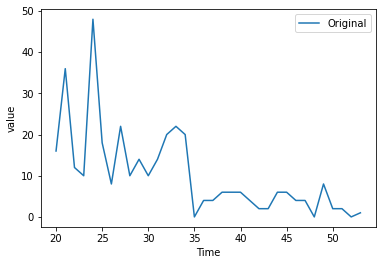

A3000112


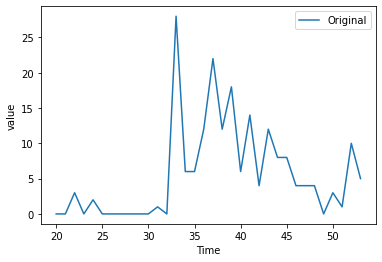

A3000116


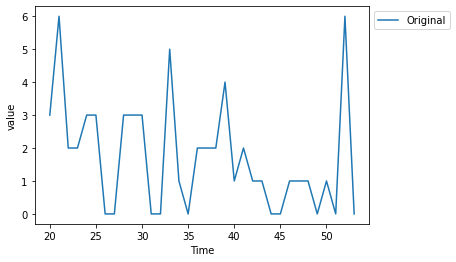

A3000117


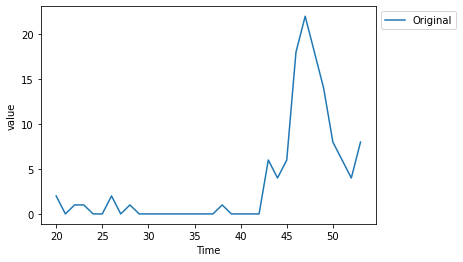

A3000123


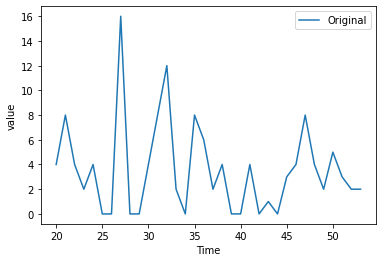

A3000124


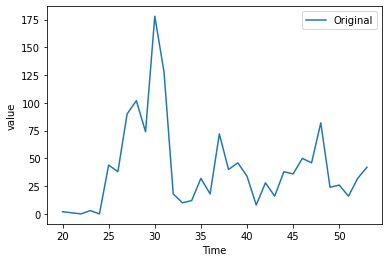

A3000125


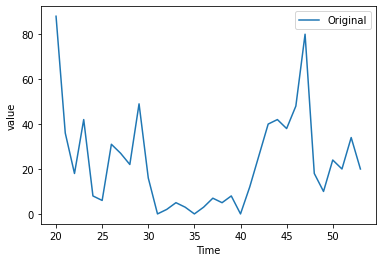

A3000126


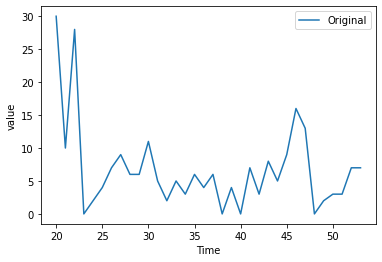

A3000134


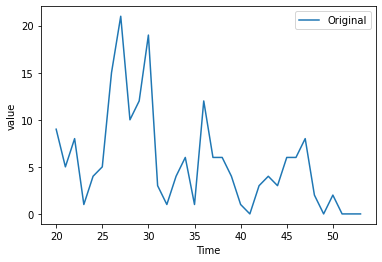

A3000135


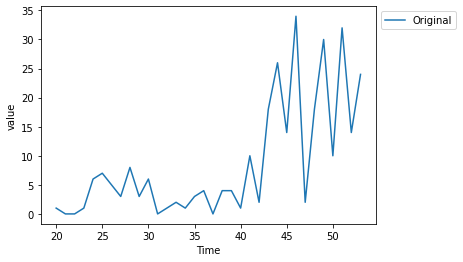

A3000138


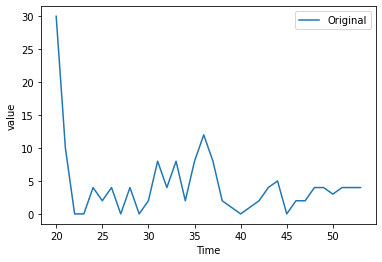

A3000139


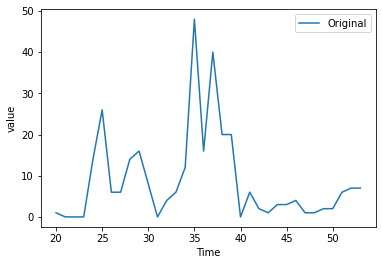

A3000140


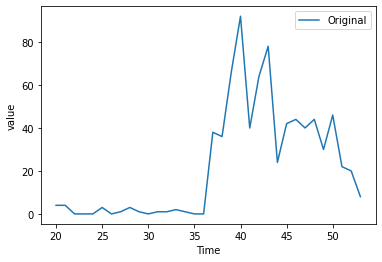

A3000141


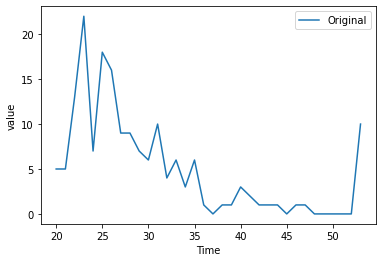

A3000142


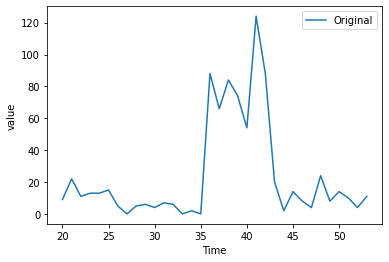

A3000144


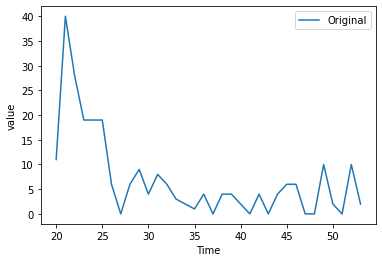

A3000146


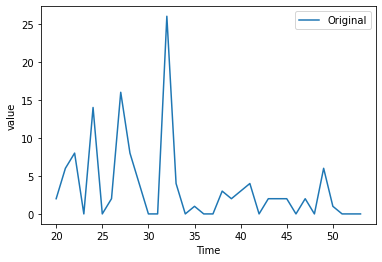

A3000153


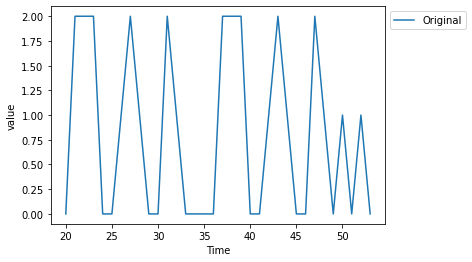

A3000157


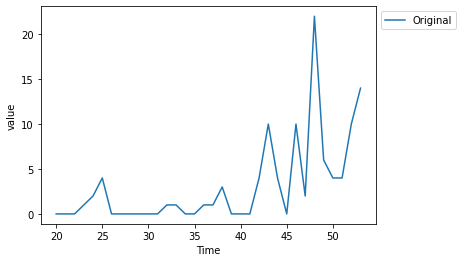

A3000159


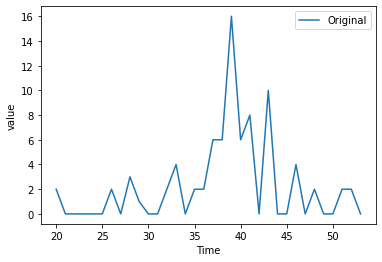

A3000160


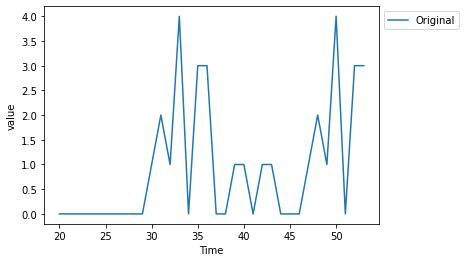

A3000171


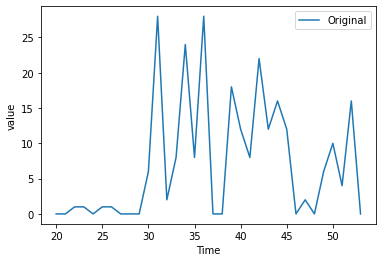

A3000173


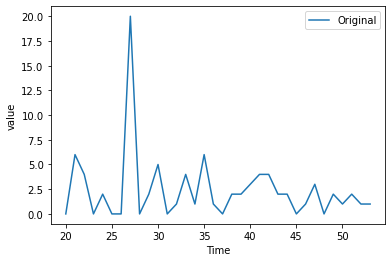

A3000174


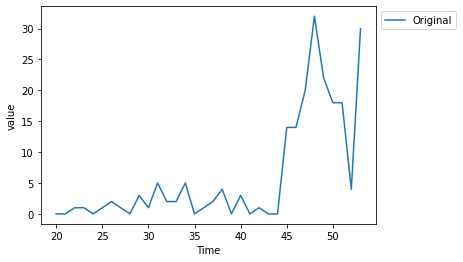

A3000183


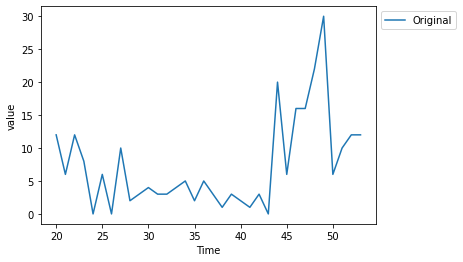

A3000185


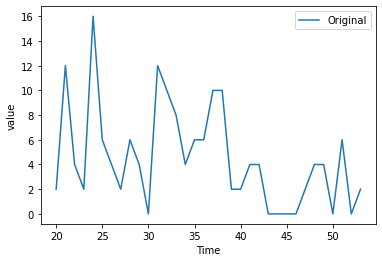

A3000187


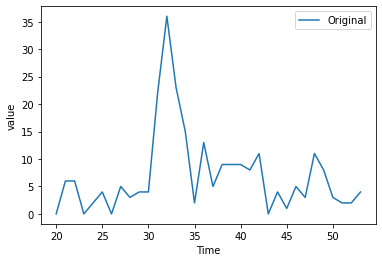

A3000190


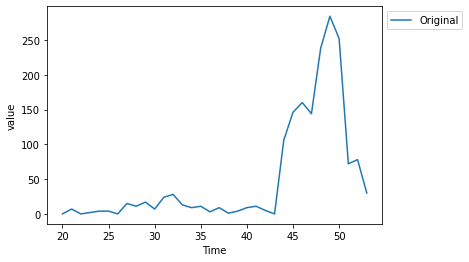

A3000192


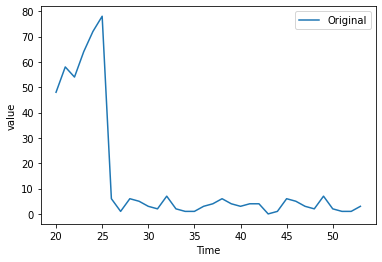

A3000193


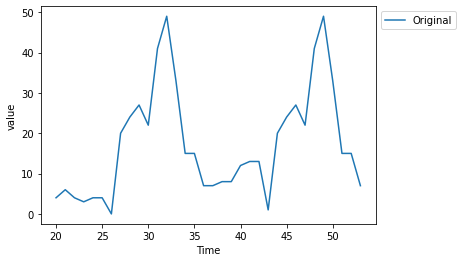

A3000196


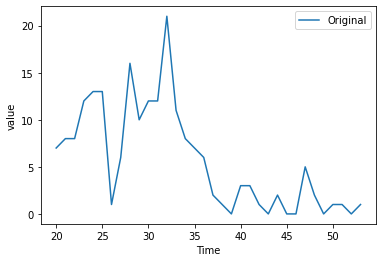

A3000198


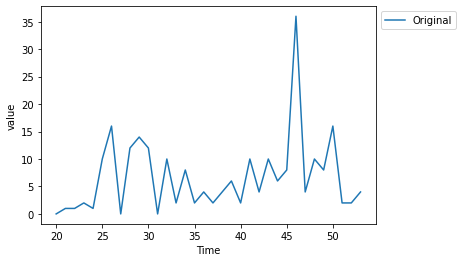

A3000200


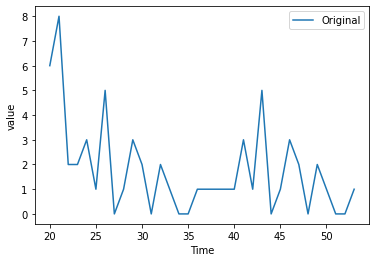

A3000202


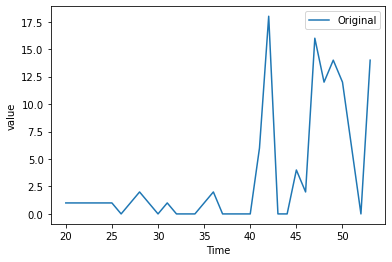

A3000204


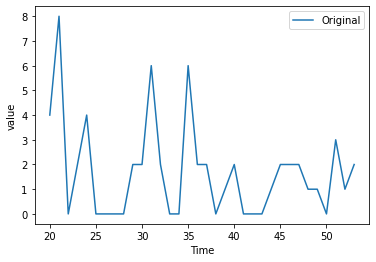

A3000206


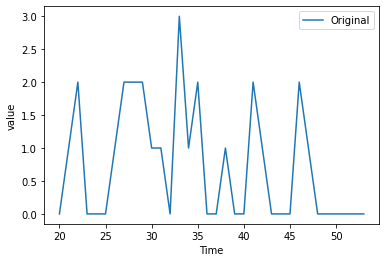

A3000207


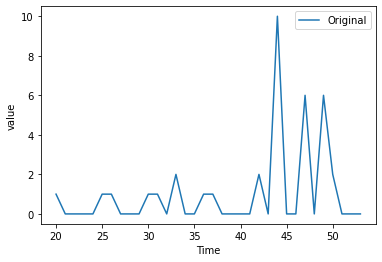

A3000209


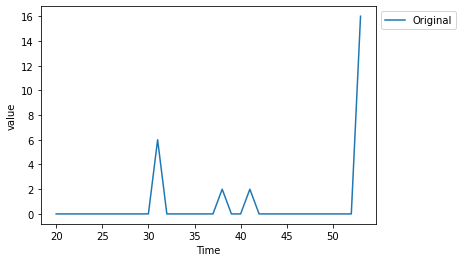

A3000213


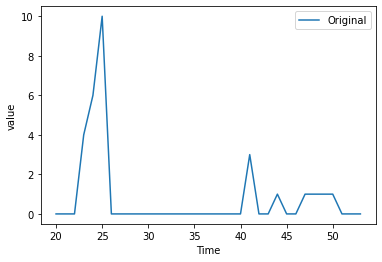

A3000215


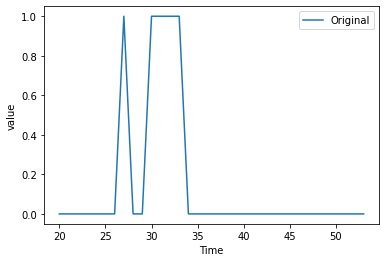

A3000216


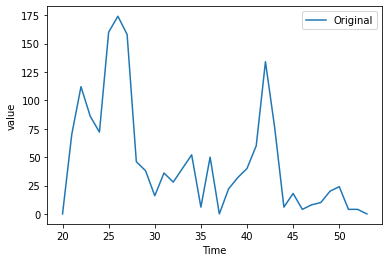

A3000224


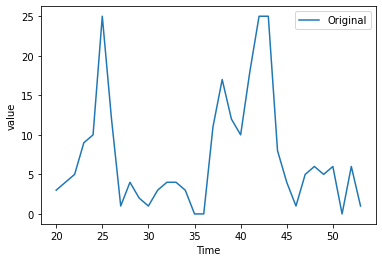

A3000226


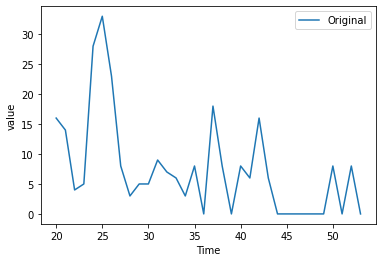

A3000227


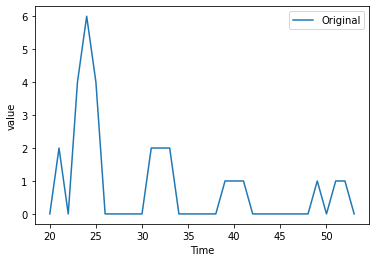

A3000228


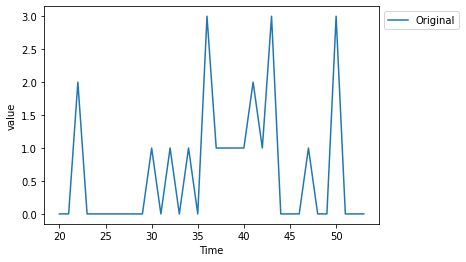

A3000229


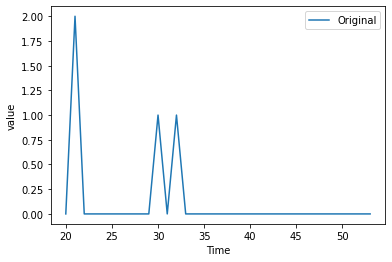

A3000230


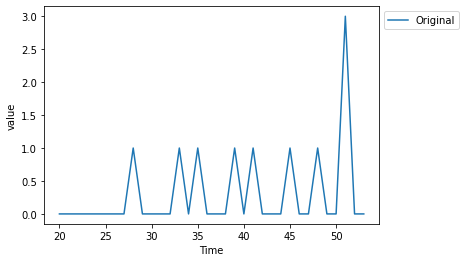

A3000231


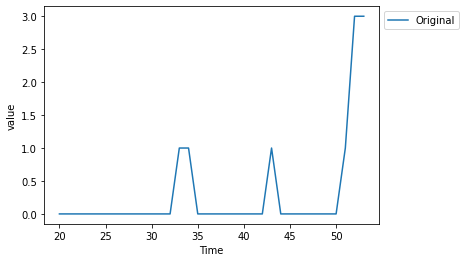

A3000233


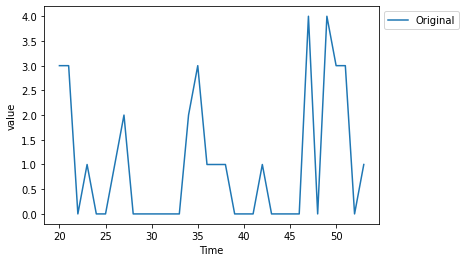

A3000235


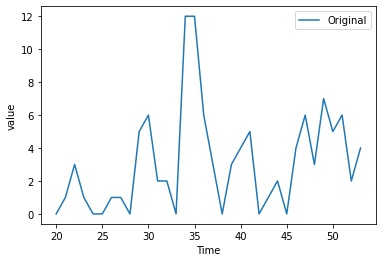

A3000236


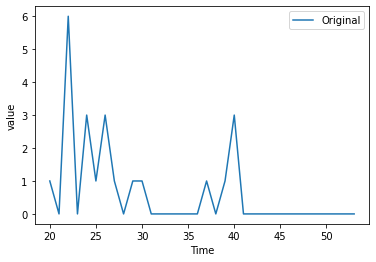

A3000237


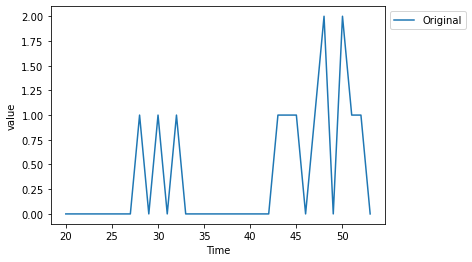

A3000241


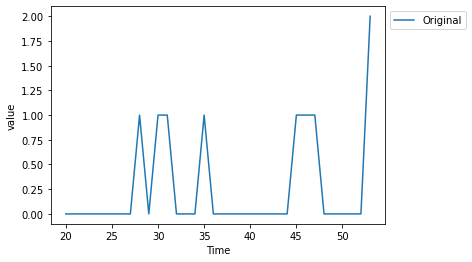

A3000243


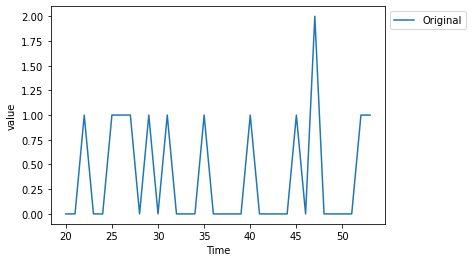

A3000244


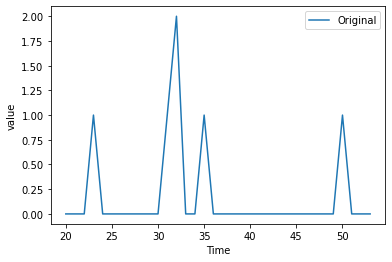

A3000245


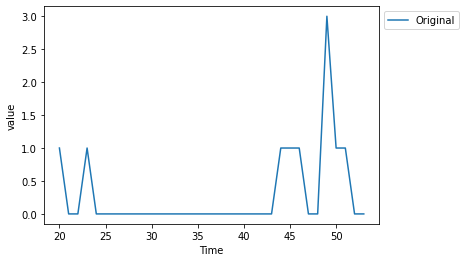

A3000246


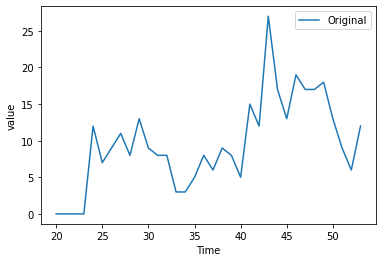

A3000247


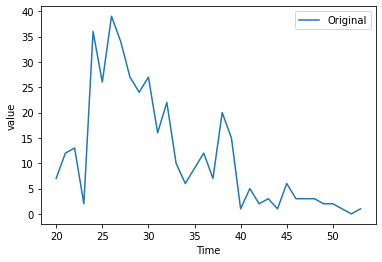

A3000248


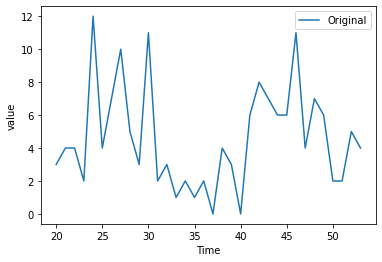

A3000250


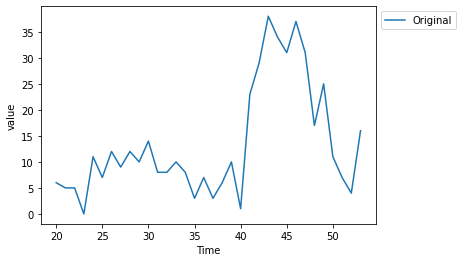

A3000255


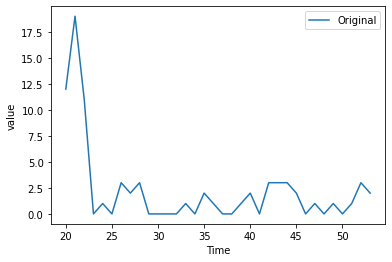

A3000256


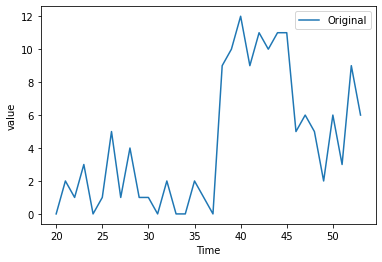

A3000259


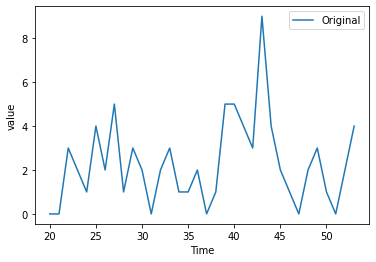

A3000260


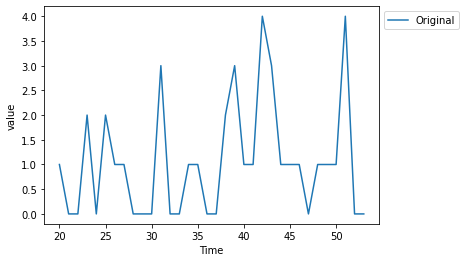

A3000271


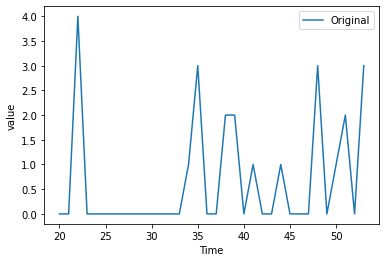

A3000274


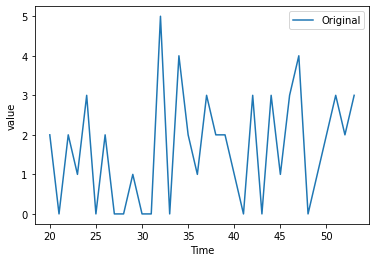

A3000275


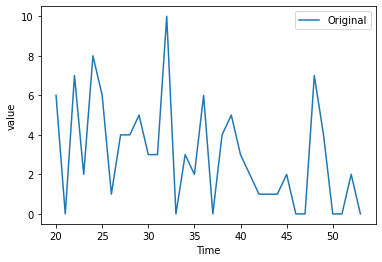

A3000279


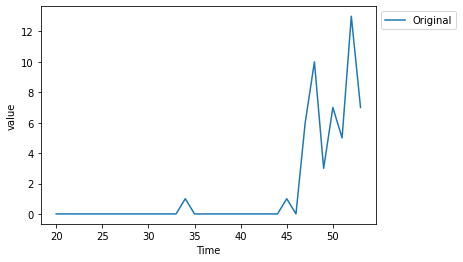

A3000281


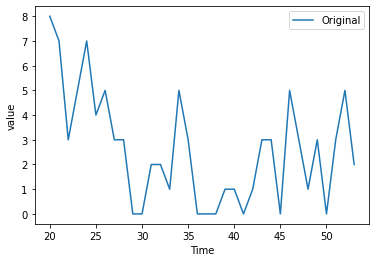

A3000282


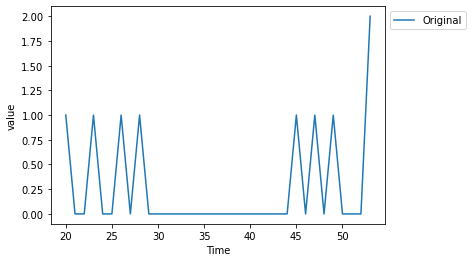

A3000283


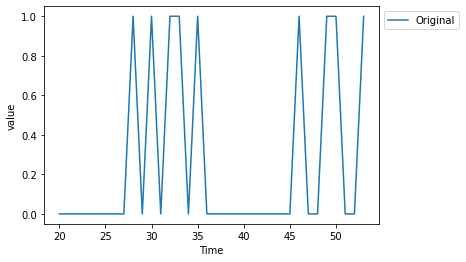

A3000284


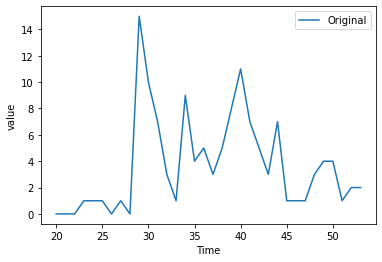

A3000286


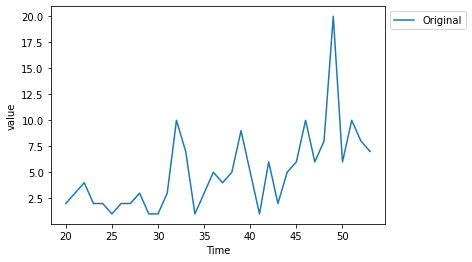

A3000288


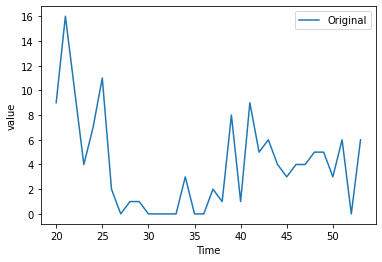

A3000296


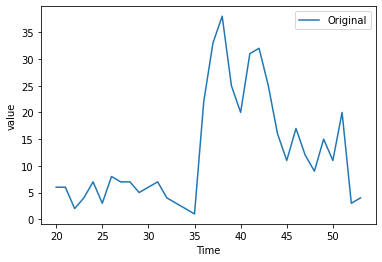

A3000297


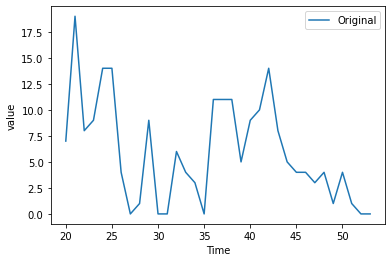

A3000298


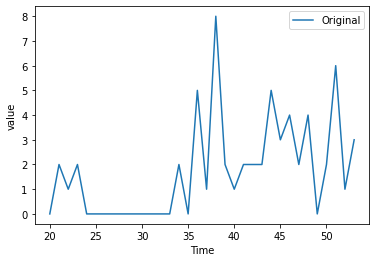

A3000301


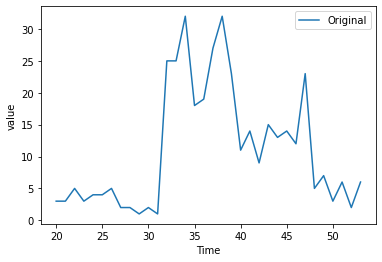

A3000302


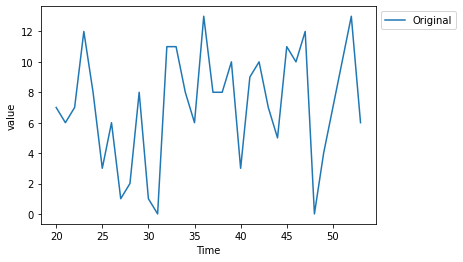

A3000303


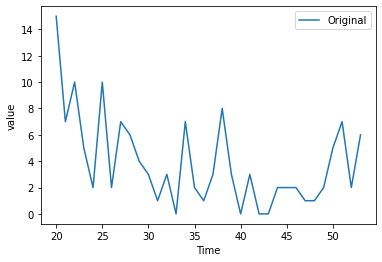

A3000304


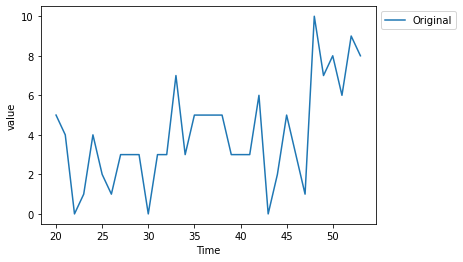

A3000312


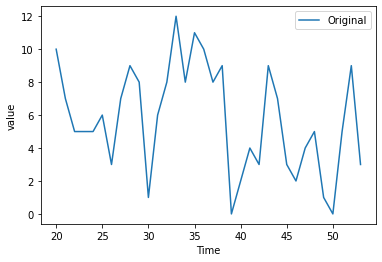

A3000313


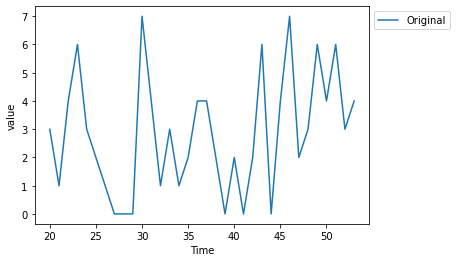

A4000001


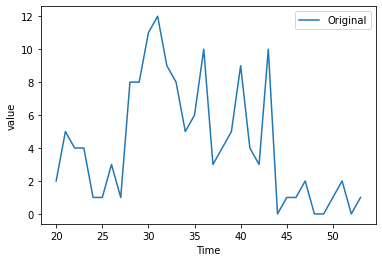

A4000004


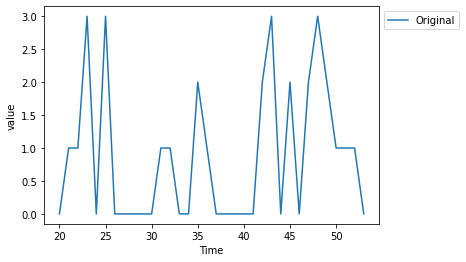

A4000008


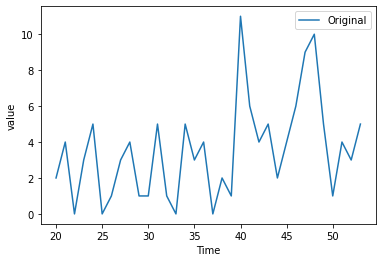

A4000017


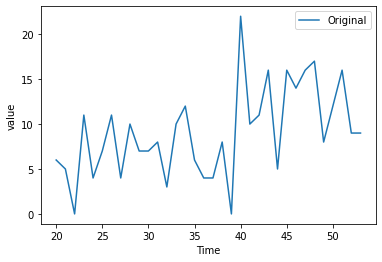

A4000018


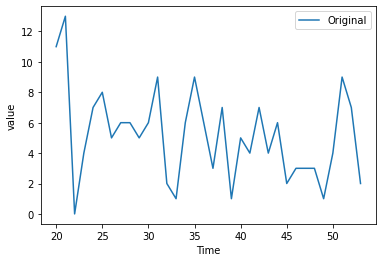

A4000021


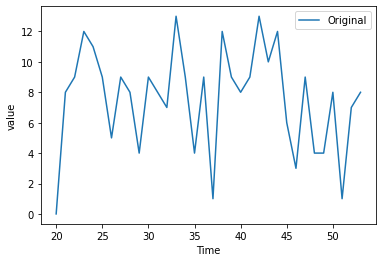

A4000028


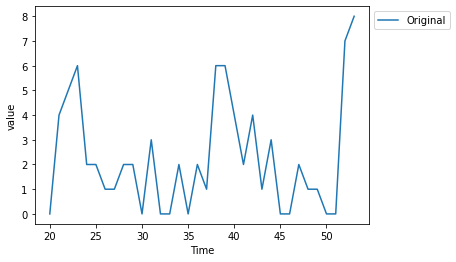

A4000031


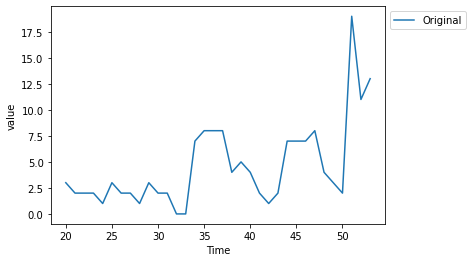

A4000032


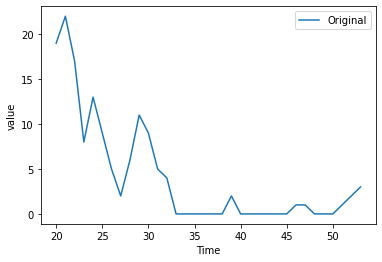

A4000033


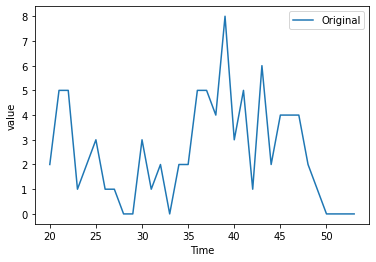

A4000034


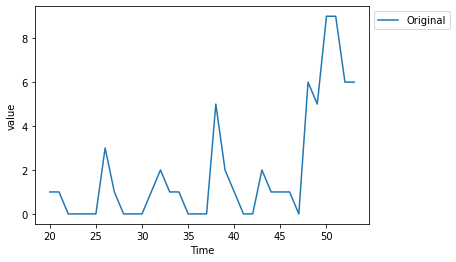

A4000035


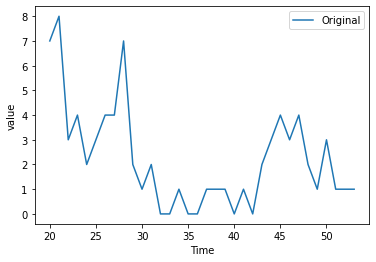

A4000036


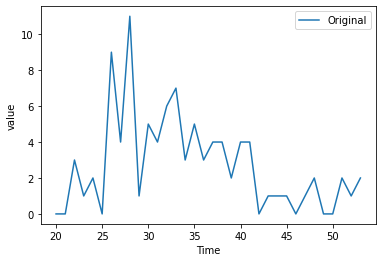

A4000037


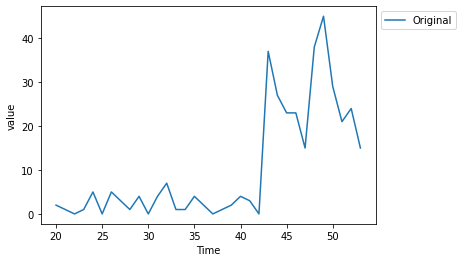

A4000039


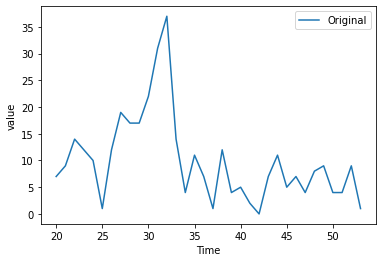

A4000045


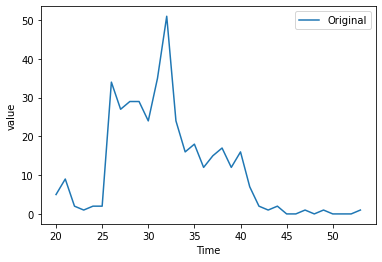

A4000047


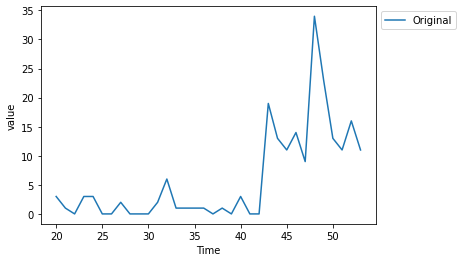

A4000048


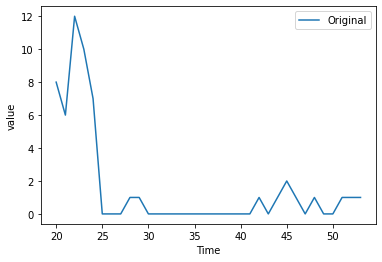

A4000049


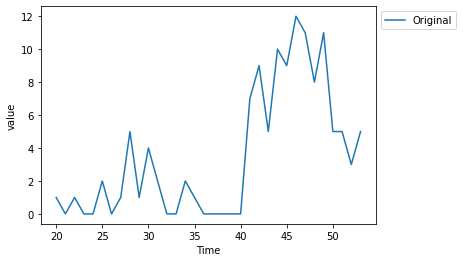

A4000058


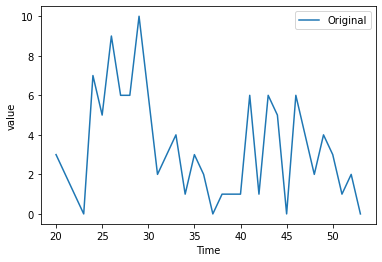

A4000074


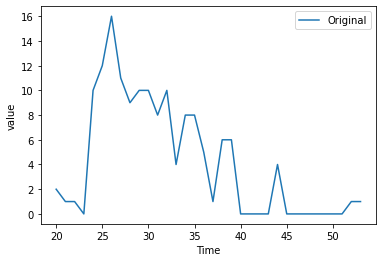

A4000075


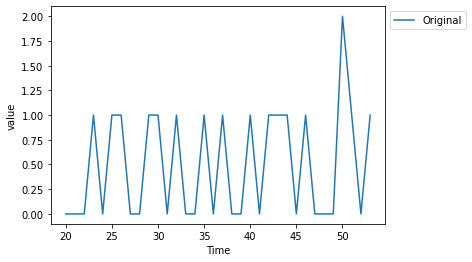

A4000077


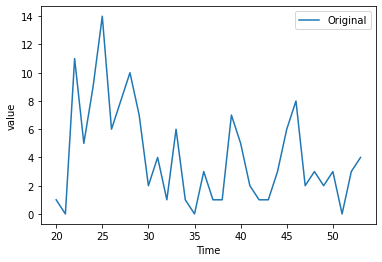

A4000080


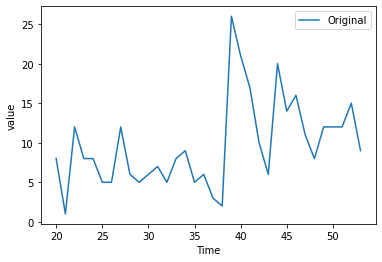

A4000081


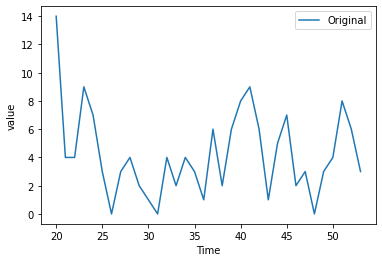

A4000087


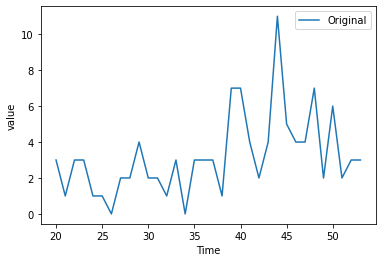

A4000088


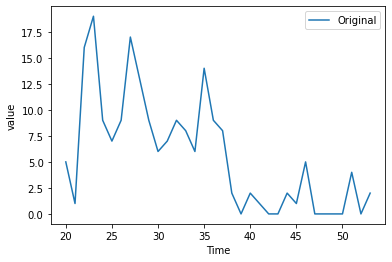

A4000089


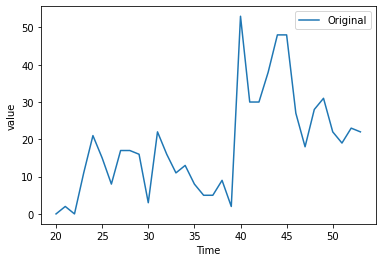

A4000090


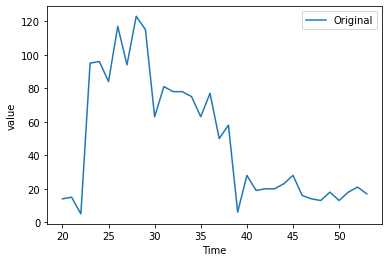

A4000091


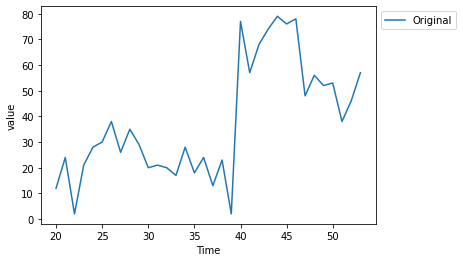

A4000092


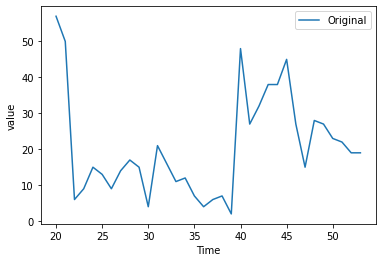

A4000093


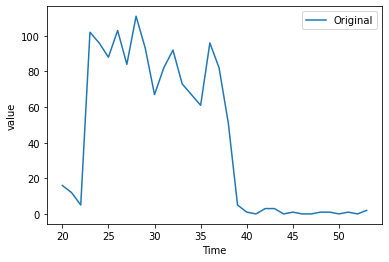

A4000095


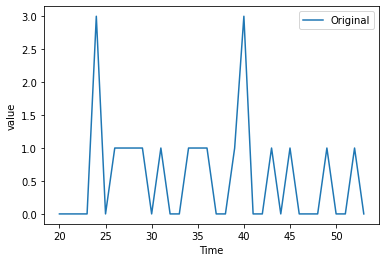

A4000096


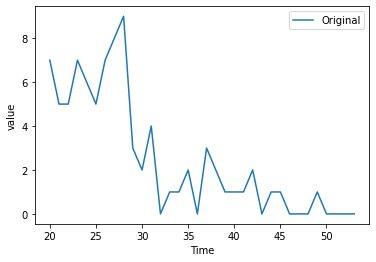

A4000100


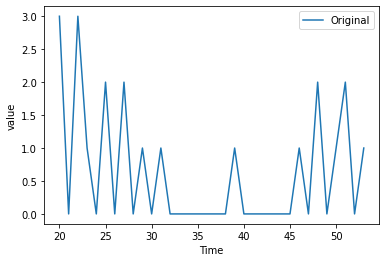

A4000102


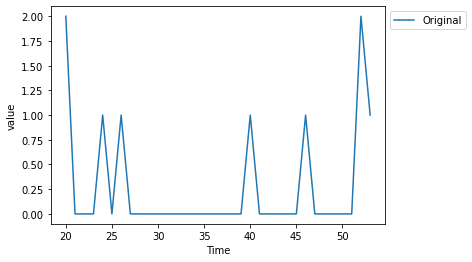

A4000107


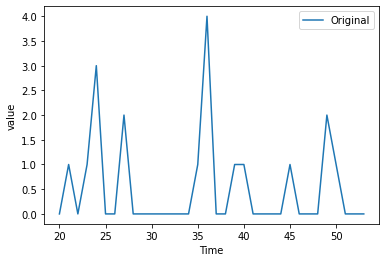

A4000110


KeyboardInterrupt: 

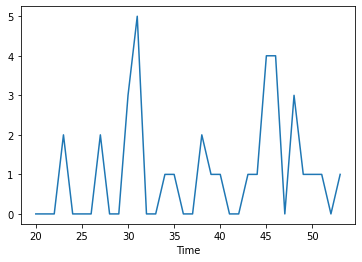

In [137]:
g1=final.groupby('ItemID')
for i in g1.groups.keys():
    print(i)
    sns.lineplot(x='Time',y='value',data=final.groupby('ItemID').get_group(i),hue='name')
    plt.legend(loc='best',bbox_to_anchor=(1,1))
    plt.show()

In [52]:
dfz16.columns

Index(['index', 'ItemID', 'ProductLine', 'SeriesName', 'SeriesNumber',
       'PromoYear', 'PromoWeek', 'Quantity', 'Sales', 'Discounts', 'COGS',
       'PriceZone', 'Price', 'AverageWeeklyPricePreCoupon',
       'AverageWeeklyPrice', 'AverageWeeklyCOGS', 'Prev_week', 'Prev_week2',
       'Prev_week3', 'FiscalQuarter', 'PromotionPeriod', 'SpecialEvent',
       'Holiday', 'Tentpole_AnniversarySale', 'Tentpole_BlackFriday',
       'Tentpole_CyberMonday', 'Tentpole_IndependenceDay', 'Tentpole_LaborDay',
       'Tentpole_MemorialDay', 'Tentpole_NewYear',
       'Tentpole_PostIndependenceDay', 'Tentpole_PostLaborDay',
       'Tentpole_PostMemorialDay', 'Tentpole_PostPresidentsDay',
       'Tentpole_PreBlackFriday', 'Tentpole_PreIndependenceDay',
       'Tentpole_PreLaborDay', 'Tentpole_PreMemorialDay',
       'Tentpole_PrePresidentsDay', 'Tentpole_PresidentsDay', 'Q2_2022',
       'LogPrice', 'Intercept', 'Holiday_Prev_week', 'Holiday_Prev_week2'],
      dtype='object')

In [139]:
metric_table=pd.merge(final_result,test1,left_index=True,right_on=['ItemID','PromoWeek'])
metric_table.rename(columns={'value_x':'y_pred','value_y':'Y_test'},inplace=True)
metric_table.head()

ValueError: You are trying to merge on int64 and object columns. If you wish to proceed you should use pd.concat

In [53]:
dfz16['ItemID'].unique()

array([1010425, 1010477, 1010488, ..., 'Z1730003', 'ZH141228', 'ZH141454'],
      dtype=object)

In [63]:
#merged.reset_index(inplace = True)
merged.head()

,level_0,index,ItemID,ProductLine,SeriesName,SeriesNumber,PromoYear,PromoWeek,Quantity,Sales,...,Tentpole_PreLaborDay,Tentpole_PreMemorialDay,Tentpole_PrePresidentsDay,Tentpole_PresidentsDay,Q2_2022,LogPrice,Intercept,Holiday_Prev_week,Holiday_Prev_week2,Date
0,0,0,1010425,Motion,McCade,10104,7,4,3.0,1298.97,...,0,0,0,0,0,6.070715,1,0.00,0.00,2022-01-30
1,1,1,1010425,Motion,McCade,10104,7,5,2.0,865.98,...,0,0,0,0,0,6.070715,1,0.00,0.00,2022-02-06
2,2,2,1010425,Motion,McCade,10104,7,6,2.0,865.98,...,0,0,0,0,0,6.070715,1,0.00,0.00,2022-02-13
3,3,3,1010425,Motion,McCade,10104,7,7,0.0,0.00,...,0,0,1,0,0,6.070715,1,865.98,865.98,2022-02-20
4,4,4,1010425,Motion,McCade,10104,7,8,1.0,432.99,...,0,0,0,1,0,6.070715,1,0.00,865.98,2022-02-27


In [66]:
from statsmodels.tsa.seasonal import seasonal_decompose
from pmdarima import auto_arima 
import itertools
from statsmodels.tsa.arima_model import ARIMA

In [ ]:
## Prophet
df = date_sales
df.columns = ['y','ds','ProfitCenter','Door Traffic Count']
prediction_size = 10 
train_df = df[:-prediction_size]
train_df.tail(n=3)

In [67]:
#Loop to generate forecast on train and test datasets for selected Stores - NOT only one Store
from statsmodels.tsa.arima_model import ARIMA
#DF with certain store
#sample_df = dfz16.query('ItemID in [1010425, 1010477, 1010488,Z1730003,ZH141228,ZH141454]')

Store_list = dfz16["ItemID"].unique().tolist()

#Range of train and test datasets
train_set = merged.copy()
test_set = test.copy()

#Data Frame for results on TRAIN dataset
df_TRAIN_result = pd.DataFrame(columns=["Date", "ItemID", "Quantity", "Qty_predicted"])
df_TRAIN_result.set_index("Date", inplace=True)
    
#Data Frame for results on TEST dataset
df_TEST_result = pd.DataFrame(columns=["Date", "ItemID", "Quantity", "Qty_predicted"])
df_TEST_result.set_index("Date", inplace=True)

#List for Stores on TRAIN dataset
store_list_TRAIN = list()
#List for evaluation on TRAIN dataset
mse_list_TRAIN = list()
rmse_list_TRAIN = list()
mape_list_TRAIN = list()
mae_list_TRAIN = list()

#List for Stores on TEST dataset
store_list_TEST = list()
#List for evaluation on TEST dataset
mse_list_TEST = list()
rmse_list_TEST = list()
mape_list_TEST = list()
mae_list_TEST = list()

#Loop for store
for store in Store_list:
        
    ####################################### ARIMA MODEL ###################################################
        
    #Data Frame with modelling Store number
    ARIMA_TRAIN=train_set[(train_set["ItemID"] == store)][["ItemID","Quantity",'Date']]
    ARIMA_TRAIN.reset_index(inplace=True)
    ARIMA_TRAIN.sort_values(by="Date", ascending =True, inplace=True)
    ARIMA_TRAIN.set_index(["Date"],inplace=True)
        
    #ARIMA model building
    model = ARIMA(ARIMA_TRAIN["Quantity"], order = (0,1,1))
    result = model.fit(disp=0)
        
    ####################################### PREDICTION ON TRAIN ############################################
        
    #Prediction on TRAIN dataset
    predicted_TRAIN = result.predict(start=1, end=len(ARIMA_TRAIN), typ = 'levels')
    predicted_TRAIN = predicted_TRAIN.reset_index(drop=True)
    predicted_TRAIN.index = ARIMA_TRAIN.index
        
    #Data Frame with actual and prediction on TRAIN dataset
    predicted_df_TRAIN = pd.DataFrame(data=predicted_TRAIN, columns=['Qty_predicted'], index=ARIMA_TRAIN.index.copy())
    df_out_TRAIN = pd.merge(ARIMA_TRAIN, predicted_df_TRAIN, how ='left', left_index=True, right_index=True)
        
    #Data Frame: Date x Store x Sales (actual) X Sales_predicted (predicted) on TRAIN dataset
    df_TRAIN_result = pd.concat([df_TRAIN_result, df_out_TRAIN])
    df_TRAIN_result.sort_index(ascending=True, inplace=True)
    
    ####################################### EVALUATION ON TRAIN ############################################
    
    #RMSE TRAIN
    RMSE_TRAIN = rmse(df_out_TRAIN["Quantity"], df_out_TRAIN["Qty_predicted"]) 
    #MSE TRAIN
    MSE_TRAIN = mean_squared_error(df_out_TRAIN["Quantity"], df_out_TRAIN["Qty_predicted"]) 
    #MAPE TRAIN
    actual, pred = np.array(df_out_TRAIN["Quantity"]), np.array(df_out_TRAIN["Qty_predicted"])
    MAPE_TRAIN = np.mean(np.abs((actual - pred) / actual)) * 100
    #MAE TRAIN
    MAE_TRAIN = mean_absolute_error(df_out_TRAIN["Quantity"], df_out_TRAIN["Qty_predicted"]) 
    
    store_list_TRAIN.append(store)
    rmse_list_TRAIN.append(RMSE_TRAIN)
    mse_list_TRAIN.append(MSE_TRAIN)
    mape_list_TRAIN.append(MAPE_TRAIN)
    mae_list_TRAIN.append(MAE_TRAIN)
        
    ####################################### PREDICTION ON TEST ############################################
        
    #Data Frame (TEST) to predict
    ARIMA_TEST=test_set[(test_set["ItemID"] == store)][["ItemID","Quantity"]]
    ARIMA_TEST.reset_index(inplace=True)
    ARIMA_TEST.sort_values(by="Date", ascending =True, inplace=True)
    ARIMA_TEST.set_index(["Date"],inplace=True)
        
    #Prediction on TEST dataset
    predicted_TEST = result.predict(start=1, end=len(ARIMA_TEST), typ = 'levels')
    predicted_TEST = predicted_TEST.reset_index(drop=True)
    predicted_TEST.index = ARIMA_TEST.index
        
    #Data Frame with actual and prediction on TEST dataset
    predicted_df_TEST = pd.DataFrame(data=predicted_TEST, columns=['Qty_predicted'], index=ARIMA_TEST.index.copy())
    df_out_TEST = pd.merge(ARIMA_TEST, predicted_df_TEST, how ='left', left_index=True, right_index=True)
    
    #Data Frame: Date x Store x Sales (actual) X Sales_predicted (predicted) on TEST dataset
    df_TEST_result = pd.concat([df_TEST_result, df_out_TEST])
    df_TEST_result.sort_index(ascending=True, inplace=True)
    
    ####################################### EVALUATION ON TEST ############################################
    
    #RMSE TEST
    RMSE_TEST = rmse(df_out_TEST["Quantity"], df_out_TEST["Qty_predicted"]) 
    #MSE TEST
    MSE_TEST = mean_squared_error(df_out_TEST["Quantity"], df_out_TEST["Qty_predicted"]) 
    #MAPE TEST
    actual, pred = np.array(df_out_TEST["Quantity"]), np.array(df_out_TEST["Qty_predicted"])
    MAPE_TEST = np.mean(np.abs((actual - pred) / actual)) * 100
    #MAE TEST
    MAE_TEST = mean_absolute_error(df_out_TEST["Quantity"], df_out_TEST["Qty_predicted"]) 
    
    store_list_TEST.append(store)
    rmse_list_TEST.append(RMSE_TEST)
    mse_list_TEST.append(MSE_TEST)
    mape_list_TEST.append(MAPE_TEST)
    mae_list_TEST.append(MAE_TEST)
    
    ################################ DATASETS WITH EVALUATION ON TEST / TRAIN #####################################

    #Data Frame with evaluation statistics on TEST dataset   
    evaluation_TEST = pd.DataFrame()
    evaluation_TEST["ItemID"] = store_list_TEST
    evaluation_TEST["MAPE_test_ARIMA"] = mape_list_TEST
    evaluation_TEST["MSE_test_ARIMA"] = mse_list_TEST
    evaluation_TEST["RMSE_test_ARIMA"] = rmse_list_TEST
    evaluation_TEST["MAE_test_ARIMA"] = mae_list_TEST
    evaluation_TEST.set_index("Store", inplace=True)

    #Data Frame with evaluation statistics on TRAIN dataset   
    evaluation_TRAIN = pd.DataFrame()
    evaluation_TRAIN["ItemID"] = store_list_TRAIN
    evaluation_TRAIN["MAPE_train_ARIMA"] = mape_list_TRAIN
    evaluation_TRAIN["MSE_train_ARIMA"] = mse_list_TRAIN
    evaluation_TRAIN["RMSE_train_ARIMA"] = rmse_list_TRAIN
    evaluation_TRAIN["MAE_train_ARIMA"] = mae_list_TRAIN
    evaluation_TRAIN.set_index("Store", inplace=True)
    
    #Comparision of evaluation on TRAIN and TEST datasets
    comparision_evaluation_loop_arima = pd.merge(evaluation_TEST, evaluation_TRAIN, left_index = True, right_index = True)
    comparision_evaluation_loop_arima = comparision_evaluation_loop_arima[["MAE_test_ARIMA", "MAE_train_ARIMA",
                                                     "MAPE_test_ARIMA", "MAPE_train_ARIMA",
                                                     "MSE_test_ARIMA", "MSE_train_ARIMA",
                                                     "RMSE_test_ARIMA", "RMSE_train_ARIMA"]]

NotImplementedError: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been removed in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and statsmodels.tsa.SARIMAX.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained. It also offers alternative specialized
parameter estimators.
